<a href="https://colab.research.google.com/github/Witcape/AI_Practice/blob/main/PSO_WEIGHT_GNBG_DRAFT_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TEST

In [ ]:
!CMAKE_ARGS="-DLLAMA_CUBLAS=on" FORCE_CMAKE=1 pip install llama-cpp-python==0.1.78 numpy==1.23.4 --force-reinstall --upgrade --no-cache-dir --verbose
!pip install huggingface_hub
!pip install llama-cpp-python==0.1.78
!pip install numpy==1.23.4

Using pip 24.1.2 from /usr/local/lib/python3.10/dist-packages/pip (python 3.10)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 38.7 MB/s eta 0:00:00
  Running command pip subprocess to install build dependencies
  Using pip 24.1.2 from /usr/local/lib/python3.10/dist-packages/pip (python 3.10)
  Non-user install by explicit request
  Created build tracker: /tmp/pip-build-tracker-zh72s4w3
  Entered build tracker: /tmp/pip-build-tracker-zh72s4w3
  Created temporary directory: /tmp/pip-install-ln3fqvc9
  Created temporary directory: /tmp/pip-ephem-wheel-cache-xgw71njy
  1 location(s) to search for versions of setuptools:
  * https://pypi.org/simple/setuptools/
  Fetching project page and analyzing links: https://pypi.org/simple/setuptools/
  Getting page https://pypi.org/simple/setuptools/
  Found index url https://pypi.org/simple/
  Looking up "https://pypi.org/simple/setuptools/" in the cache
  Request header has "max_age" as 0, cache bypassed
  Starting new HTTPS connection (1

In [ ]:
model_name_or_path = "TheBloke/Llama-2-13B-chat-GGML"
model_basename = "llama-2-13b-chat.ggmlv3.q5_1.bin"

In [ ]:
from huggingface_hub import hf_hub_download
from llama_cpp import Llama
import matplotlib.pyplot as plt

In [ ]:
model_path = hf_hub_download(repo_id=model_name_or_path, filename=model_basename)

In [ ]:
# GPU
lcpp_llm = None
lcpp_llm = Llama(
    model_path=model_path,
    n_threads=2, # CPU cores
    n_batch=512, # Should be between 1 and n_ctx, consider the amount of VRAM in your GPU.
    n_gpu_layers=32 # Change this value based on your model and your GPU VRAM pool.
    )

In [ ]:
!pip install pyswarms
import numpy as np
import pyswarms as ps

In [ ]:
CostFunction = sphere  #
nVar = 10  # Number of Decision Variables
VarSize = (nVar,)  # Size of Decision Variables Matrix
VarMin = -10  # Lower Bound of Variables
VarMax = 10  # Upper Bound of Variables

In [ ]:
MaxIt = 20  # Maximum Number of Iterations
nPop = 20

In [ ]:
w = 1  # Inertia Weight
wdamp = 0.99  # Inertia Weight Damping Ratio
c1 = 1.5  # Personal Learning Coefficient
c2 = 2.0  # Global Learning Coefficient

In [ ]:
VelMax = 0.1 * (VarMax - VarMin)
VelMin = -VelMax

In [ ]:
particles = []

for _ in range(nPop):
    position = np.random.uniform(VarMin, VarMax, VarSize)
    velocity = np.zeros(VarSize)
    cost = CostFunction(position)
    best_position = position.copy()
    best_cost = cost
    particles.append({
        'Position': position,
        'Velocity': velocity,
        'Cost': cost,
        'Best': {
            'Position': best_position,
            'Cost': best_cost
        }
    })
print(np.size(particles))

In [ ]:
GlobalBest = {'Position': None, 'Cost': np.inf}

for p in particles:
    if p['Cost'] < GlobalBest['Cost']:
        GlobalBest = {'Position': p['Best']['Position'].copy(), 'Cost': p['Best']['Cost']}

BestCost = np.zeros(MaxIt)

In [ ]:
w_values = []
g_values = []

for it in range(MaxIt):
    for p in particles:
        # Update Velocity
        r1 = np.random.rand(*VarSize)
        r2 = np.random.rand(*VarSize)
        p['Velocity'] = (
            w * p['Velocity']
            + c1 * r1 * (p['Best']['Position'] - p['Position'])
            + c2 * r2 * (GlobalBest['Position'] - p['Position'])
        )

        # Apply Velocity Limits
        p['Velocity'] = np.maximum(p['Velocity'], VelMin)
        p['Velocity'] = np.minimum(p['Velocity'], VelMax)

        # Update Position
        p['Position'] += p['Velocity']

        # Velocity Mirror Effect
        IsOutside = (p['Position'] < VarMin) | (p['Position'] > VarMax)
        p['Velocity'][IsOutside] = -p['Velocity'][IsOutside]

        # Apply Position Limits
        p['Position'] = np.maximum(p['Position'], VarMin)
        p['Position'] = np.minimum(p['Position'], VarMax)

        # Evaluation
        p['Cost'] = CostFunction(p['Position'])

        # Update Personal Best
        if p['Cost'] < p['Best']['Cost']:
            p['Best']['Position'] = p['Position'].copy()
            p['Best']['Cost'] = p['Cost']

            # Update Global Best
            if p['Best']['Cost'] < GlobalBest['Cost']:  # tell best cost using roullete wheel. LLM will check for global best
                GlobalBest = {'Position': p['Best']['Position'].copy(), 'Cost': p['Best']['Cost']} # tell best cost using roullete wheel

    BestCost[it] = GlobalBest['Cost']

    print(f"Iteration {it+1}: Best Cost = {BestCost[it]}")

    prompt = f"Generate a positive number a little lower than {w} and greater then 0.1 using Normalised Glorot Initialization. Don't write anything else, just write that number in decimal notation normally."
    w_finder_template = f'''SYSTEM: You are a helpful, respectful, and honest assistant. Always answer as helpfully.

    USER: {prompt}

    ASSISTANT:
    '''

    w_response = lcpp_llm(prompt=w_finder_template, max_tokens=256, temperature=0.5, top_p=0.95,
                          repeat_penalty=1.2, top_k=150,
                          echo=True)

    g_values.append(GlobalBest['Cost'])
    BestCost[it] = GlobalBest['Cost']

    text_response = w_response['choices'][0]['text']
    value = re.findall(r'-?\d+\.\d+', text_response)
    value = [float(num) for num in value]

    value = value[np.size(value) - 1]
    print(f'w{it+1} = {value}')
    w_values.append(w)
    w = value

w_values.append(w)
print(w_values)

# Function

In [1]:
!CMAKE_ARGS="-DLLAMA_CUBLAS=on" FORCE_CMAKE=1 pip install llama-cpp-python==0.1.78 numpy==1.23.4 --force-reinstall --upgrade --no-cache-dir --verbose
!pip install huggingface_hub
!pip install llama-cpp-python==0.1.78
!pip install numpy==1.23.4

Using pip 24.1.2 from /usr/local/lib/python3.10/dist-packages/pip (python 3.10)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 114.7 MB/s eta 0:00:00
  Running command pip subprocess to install build dependencies
  Using pip 24.1.2 from /usr/local/lib/python3.10/dist-packages/pip (python 3.10)
  Non-user install by explicit request
  Created build tracker: /tmp/pip-build-tracker-ci9lpybw
  Entered build tracker: /tmp/pip-build-tracker-ci9lpybw
  Created temporary directory: /tmp/pip-install-rk1l8a1h
  Created temporary directory: /tmp/pip-ephem-wheel-cache-puz6od00
  1 location(s) to search for versions of setuptools:
  * https://pypi.org/simple/setuptools/
  Fetching project page and analyzing links: https://pypi.org/simple/setuptools/
  Getting page https://pypi.org/simple/setuptools/
  Found index url https://pypi.org/simple/
  Looking up "https://pypi.org/simple/setuptools/" in the cache
  Request header has "max_age" as 0, cache bypassed
  No cache entry available
  Star

In [2]:
model_name_or_path = "TheBloke/Llama-2-13B-chat-GGML"
model_basename = "llama-2-13b-chat.ggmlv3.q5_1.bin"

In [3]:
from huggingface_hub import hf_hub_download
from llama_cpp import Llama
import matplotlib.pyplot as plt

In [4]:
model_path = hf_hub_download(repo_id=model_name_or_path, filename=model_basename)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


llama-2-13b-chat.ggmlv3.q5_1.bin:   0%|          | 0.00/9.76G [00:00<?, ?B/s]

In [5]:
lcpp_llm = Llama(
    model_path=model_path,
    n_threads=2, # CPU cores
    n_batch=512, # Should be between 1 and n_ctx, consider the amount of VRAM in your GPU.
    n_gpu_layers=32 # Change this value based on your model and your GPU VRAM pool.
    )

AVX = 1 | AVX2 = 1 | AVX512 = 0 | AVX512_VBMI = 0 | AVX512_VNNI = 0 | FMA = 1 | NEON = 0 | ARM_FMA = 0 | F16C = 1 | FP16_VA = 0 | WASM_SIMD = 0 | BLAS = 1 | SSE3 = 1 | VSX = 0 | 


In [6]:
!pip install pyswarms
import numpy as np
import pyswarms as ps

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.1/104.1 kB 10.0 MB/s eta 0:00:00


In [7]:
import numpy as np
import re

def run_pso(
    CostFunction, nVar=10, VarMin=-10, VarMax=10, MaxIt=20, nPop=100,
    w=1, wdamp=0.99, c1=2.05, c2=2.05, n_threads=2, n_batch=512, n_gpu_layers=32, chi=0.729843788, milestones=None
):

    if milestones is None:
        milestones = [100000, 250000, 500000]

    milestone_results = {milestone: [] for milestone in milestones}  # Initialize dictionary to store results at milestones
    total_evals = 0  # Counter for total function evaluations

    VarSize = (nVar,)
    VelMax = 0.1 * (VarMax - VarMin)
    VelMin = -VelMax

    particles = []

    for _ in range(nPop):
        position = np.random.uniform(VarMin, VarMax, VarSize)
        velocity = np.zeros(VarSize)
        cost = CostFunction(position)
        best_position = position.copy()
        best_cost = cost
        particles.append({
            'Position': position,
            'Velocity': velocity,
            'Cost': cost,
            'Best': {
                'Position': best_position,
                'Cost': best_cost
            }
        })

    GlobalBest = {'Position': None, 'Cost': np.inf}

    for p in particles:
        if p['Cost'] < GlobalBest['Cost']:
            GlobalBest = {'Position': p['Best']['Position'].copy(), 'Cost': p['Best']['Cost']}

    BestCost = np.zeros(MaxIt)
    w_values = []
    g_values = []
    function_evals = 0

    for it in range(MaxIt):
        for p in particles:
            # Update Velocity
            r1 = np.random.rand(*VarSize)
            r2 = np.random.rand(*VarSize)
            p['Velocity'] = chi * (
                p['Velocity']
                + c1 * r1 * (p['Best']['Position'] - p['Position'])
                + c2 * r2 * (GlobalBest['Position'] - p['Position'])
            )

            # Apply Velocity Limits
            p['Velocity'] = np.maximum(p['Velocity'], VelMin)
            p['Velocity'] = np.minimum(p['Velocity'], VelMax)

            # Update Position
            p['Position'] += p['Velocity']

            # Velocity Mirror Effect
            IsOutside = (p['Position'] < VarMin) | (p['Position'] > VarMax)
            p['Velocity'][IsOutside] = -p['Velocity'][IsOutside]

            # Apply Position Limits
            p['Position'] = np.maximum(p['Position'], VarMin)
            p['Position'] = np.minimum(p['Position'], VarMax)

            # Evaluation
            p['Cost'] = CostFunction(p['Position'])

            # Update Personal Best
            if p['Cost'] < p['Best']['Cost']:
                p['Best']['Position'] = p['Position'].copy()
                p['Best']['Cost'] = p['Cost']

                # Update Global Best
                if p['Best']['Cost'] < GlobalBest['Cost']:
                    GlobalBest = {'Position': p['Best']['Position'].copy(), 'Cost': p['Best']['Cost']}

            if function_evals in milestones:
                milestone_results[function_evals] = GlobalBest['Cost']


        BestCost[it] = GlobalBest['Cost']
        print(f"Iteration {it+1}: Best Cost = {BestCost[it]}")

        if(it <= 40):
          prompt = f"Generate a positive number a little lower than {w} and greater then 0.1 using Normalised Glorot Initialization. Don't write anything else, just write that number in decimal notation normally."
          w_finder_template = f'''SYSTEM: You are a helpful, respectful, and honest assistant. Always answer as helpfully.

          USER: {prompt}

          ASSISTANT:
          '''

          w_response = lcpp_llm(prompt=w_finder_template, max_tokens=256, temperature=0.5, top_p=0.95,
                                repeat_penalty=1.2, top_k=150, echo=True)

          text_response = w_response['choices'][0]['text']
          value = re.findall(r'-?\d+\.\d+', text_response)
          value = [float(num) for num in value]

          if value:
              w = value[-1]
              print(f"w{it+1} = {w}")
          else:
              print("Warning: LLM failed to provide a valid weight. Retaining previous weight.")

          w_values.append(w)
          g_values.append(GlobalBest['Cost'])

        else:
          w *= wdamp

          w_values.append(w)
          g_values.append(GlobalBest['Cost'])

    w_values.append(w)
    print("Final Weights:", w_values)
    for milestone, costs in milestone_results.items():
          if costs:  # Only compute if there are values
              mean_cost = np.mean(costs)
              std_cost = np.std(costs)
              print(f"At {milestone} function evaluations - Mean Cost: {mean_cost}, Std Dev: {std_cost}")

    return BestCost, w_values, g_values, milestone_results

In [8]:
# def sphere(x):
#     return sum(x**2)

In [9]:
# BestCost, w_values, g_values = run_pso(CostFunction=sphere)

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat
import os

# GNBG class definition
class GNBG:
    def __init__(self, MaxEvals, AcceptanceThreshold, Dimension, CompNum, MinCoordinate, MaxCoordinate, CompMinPos, CompSigma, CompH, Mu, Omega, Lambda, RotationMatrix, OptimumValue, OptimumPosition):
        self.MaxEvals = MaxEvals
        self.AcceptanceThreshold = AcceptanceThreshold
        self.Dimension = Dimension
        self.CompNum = CompNum
        self.MinCoordinate = MinCoordinate
        self.MaxCoordinate = MaxCoordinate
        self.CompMinPos = CompMinPos
        self.CompSigma = CompSigma
        self.CompH = CompH
        self.Mu = Mu
        self.Omega = Omega
        self.Lambda = Lambda
        self.RotationMatrix = RotationMatrix
        self.OptimumValue = OptimumValue
        self.OptimumPosition = OptimumPosition
        self.FEhistory = []
        self.FE = 0
        self.BestFoundPosition = None
        self.AcceptanceReachPoint = np.inf
        self.BestFoundResult = np.inf


    def fitness(self, X):
        if len(X.shape)<2:
            X = X.reshape(1,-1)
        SolutionNumber = X.shape[0]
        result = np.nan * np.ones(SolutionNumber)
        for jj in range(SolutionNumber):
            x = X[jj, :].reshape(-1, 1)  # Ensure column vector
            f = np.nan * np.ones(self.CompNum)
            for k in range(self.CompNum):
                if len(self.RotationMatrix.shape) == 3:
                    rotation_matrix = self.RotationMatrix[:, :, k]
                else:
                    rotation_matrix = self.RotationMatrix

                a = self.transform((x - self.CompMinPos[k, :].reshape(-1, 1)).T @ rotation_matrix.T, self.Mu[k, :], self.Omega[k, :])
                b = self.transform(rotation_matrix @ (x - self.CompMinPos[k, :].reshape(-1, 1)), self.Mu[k, :], self.Omega[k, :])
                f[k] = self.CompSigma[k] + (a @ np.diag(self.CompH[k, :]) @ b) ** self.Lambda[k]

            result[jj] = np.min(f)
            if self.FE > (self.MaxEvals-1):
                return result
            self.FE += 1
            self.FEhistory = np.append(self.FEhistory, result[jj])
            if self.BestFoundResult > result[jj]:
                self.BestFoundResult = result[jj]
            if abs(self.FEhistory[self.FE-1] - self.OptimumValue) < self.AcceptanceThreshold and np.isinf(self.AcceptanceReachPoint):
                self.AcceptanceReachPoint = self.FE
        return result
    def transform(self, X, Alpha, Beta):
        Y = X.copy()
        tmp = (X > 0)
        Y[tmp] = np.log(X[tmp])
        Y[tmp] = np.exp(Y[tmp] + Alpha[0] * (np.sin(Beta[0] * Y[tmp]) + np.sin(Beta[1] * Y[tmp])))
        tmp = (X < 0)
        Y[tmp] = np.log(-X[tmp])
        Y[tmp] = -np.exp(Y[tmp] + Alpha[1] * (np.sin(Beta[2] * Y[tmp]) + np.sin(Beta[3] * Y[tmp])))
        return Y

In [11]:
# ProblemIndex = 22  # Choose a problem instance from 1 to 24
# folder_path = '/content'  # Path to the folder containing f1.mat to f24.mat

# # Load GNBG data for the selected problem instance
# if 1 <= ProblemIndex <= 24:
#     filename = f'f{ProblemIndex}.mat'
#     GNBG_tmp = loadmat(os.path.join(folder_path, filename))['GNBG']
#     MaxEvals = np.array([item[0] for item in GNBG_tmp['MaxEvals'].flatten()])[0, 0]
#     AcceptanceThreshold = np.array([item[0] for item in GNBG_tmp['AcceptanceThreshold'].flatten()])[0, 0]
#     Dimension = np.array([item[0] for item in GNBG_tmp['Dimension'].flatten()])[0, 0]
#     CompNum = np.array([item[0] for item in GNBG_tmp['o'].flatten()])[0, 0]  # Number of components
#     MinCoordinate = np.array([item[0] for item in GNBG_tmp['MinCoordinate'].flatten()])[0, 0]
#     MaxCoordinate = np.array([item[0] for item in GNBG_tmp['MaxCoordinate'].flatten()])[0, 0]
#     CompMinPos = np.array(GNBG_tmp['Component_MinimumPosition'][0, 0])
#     CompSigma = np.array(GNBG_tmp['ComponentSigma'][0, 0], dtype=np.float64)
#     CompH = np.array(GNBG_tmp['Component_H'][0, 0])
#     Mu = np.array(GNBG_tmp['Mu'][0, 0])
#     Omega = np.array(GNBG_tmp['Omega'][0, 0])
#     Lambda = np.array(GNBG_tmp['lambda'][0, 0])
#     RotationMatrix = np.array(GNBG_tmp['RotationMatrix'][0, 0])
#     OptimumValue = np.array([item[0] for item in GNBG_tmp['OptimumValue'].flatten()])[0, 0]
#     OptimumPosition = np.array(GNBG_tmp['OptimumPosition'][0, 0])
# else:
#     raise ValueError('ProblemIndex must be between 1 and 24.')

# # Initialize GNBG problem instance
# gnbg = GNBG(MaxEvals, AcceptanceThreshold, Dimension, CompNum, MinCoordinate, MaxCoordinate, CompMinPos, CompSigma, CompH, Mu, Omega, Lambda, RotationMatrix, OptimumValue, OptimumPosition)
# popsize = 500000
# print(MaxEvals // popsize)

In [12]:
# nVar = Dimension
# VarMin = MinCoordinate
# VarMax = MaxCoordinate
# popsize = 500000
# nPop = 100
# maxiter = MaxEvals // popsize

# BestCost, w_values, g_values, milestone_results = run_pso(
#     CostFunction=gnbg.fitness,
#     nVar=nVar,
#     VarMin=VarMin,
#     VarMax=VarMax,
#     MaxIt=maxiter,
#     nPop=nPop
# )

In [13]:
# milestone_means = {}
# milestone_stds = {}

# for milestone, costs in milestone_results.items():
#     if costs:  # Check if there are any results for this milestone
#         mean_cost = np.mean(costs)
#         std_cost = np.std(costs)
#         milestone_means[milestone] = mean_cost
#         milestone_stds[milestone] = std_cost
#         print(f"At {milestone} function evaluations - Mean Cost: {mean_cost}, Std Dev: {std_cost}")

# # Plot milestone results: Mean cost with standard deviation error bars
# milestones_sorted = sorted(milestone_means.keys())
# means = [milestone_means[m] for m in milestones_sorted]
# stds = [milestone_stds[m] for m in milestones_sorted]

# plt.errorbar(milestones_sorted, means, yerr=stds, fmt='o', color='b', capsize=5)
# plt.xlabel('Function Evaluations')
# plt.ylabel('Cost')
# plt.title('Cost vs Function Evaluations with Std Dev')
# plt.show()

In [14]:
# plt.plot(w_values)
# plt.xlabel('Iteration')
# plt.ylabel('Inertia Weight (w)')
# plt.title('Inertia Weight Over Iterations')
# plt.show()

In [15]:
# plt.plot(g_values)
# plt.xlabel('Iteration')
# plt.ylabel('Global Best Position Value')
# plt.title('Global Best Position Over Iterations')
# plt.show()

In [16]:
# # Print best cost and best position
# print("Best Cost Found by PSO:\n\n", BestCost)

# # Print the position corresponding to the best cost
# print("\n\nBest Position:", g_values[-1])

# RUN ALL ALGOS

In [17]:
def run_all_problems(folder_path, num_problems=24):
    all_results = {}

    for problem_index in range(1, num_problems + 1):
        filename = f'f{problem_index}.mat'
        GNBG_tmp = loadmat(os.path.join(folder_path, filename))['GNBG']

        MaxEvals = np.array([item[0] for item in GNBG_tmp['MaxEvals'].flatten()])[0, 0]
        AcceptanceThreshold = np.array([item[0] for item in GNBG_tmp['AcceptanceThreshold'].flatten()])[0, 0]
        Dimension = np.array([item[0] for item in GNBG_tmp['Dimension'].flatten()])[0, 0]
        CompNum = np.array([item[0] for item in GNBG_tmp['o'].flatten()])[0, 0]  # Number of components
        MinCoordinate = np.array([item[0] for item in GNBG_tmp['MinCoordinate'].flatten()])[0, 0]
        MaxCoordinate = np.array([item[0] for item in GNBG_tmp['MaxCoordinate'].flatten()])[0, 0]
        CompMinPos = np.array(GNBG_tmp['Component_MinimumPosition'][0, 0])
        CompSigma = np.array(GNBG_tmp['ComponentSigma'][0, 0], dtype=np.float64)
        CompH = np.array(GNBG_tmp['Component_H'][0, 0])
        Mu = np.array(GNBG_tmp['Mu'][0, 0])
        Omega = np.array(GNBG_tmp['Omega'][0, 0])
        Lambda = np.array(GNBG_tmp['lambda'][0, 0])
        RotationMatrix = np.array(GNBG_tmp['RotationMatrix'][0, 0])
        OptimumValue = np.array([item[0] for item in GNBG_tmp['OptimumValue'].flatten()])[0, 0]
        OptimumPosition = np.array(GNBG_tmp['OptimumPosition'][0, 0])


        # Initialize GNBG problem instance
        gnbg = GNBG(MaxEvals, AcceptanceThreshold, Dimension, CompNum, MinCoordinate, MaxCoordinate, CompMinPos, CompSigma, CompH, Mu, Omega, Lambda, RotationMatrix, OptimumValue, OptimumPosition)

        # Run PSO for the current problem
        nVar = Dimension
        VarMin = MinCoordinate
        VarMax = MaxCoordinate
        MaxEvals = 500000
        nPop = 100
        maxiter = MaxEvals // nPop

        BestCost, w_values, g_values, milestone_results = run_pso(
            CostFunction=gnbg.fitness,
            nVar=nVar,
            VarMin=VarMin,
            VarMax=VarMax,
            MaxIt=maxiter,
            nPop=nPop
        )

        error = abs(BestCost[-1] - gnbg.OptimumValue)

        # Add error to results dictionary
        all_results[problem_index] = {
            'BestCost': BestCost,
            'BestPosition': g_values[-1],
            'w_values': w_values,
            'g_values': g_values,
            'OptimumValue': gnbg.OptimumValue,
            'Error': error
        }

        print(f"Problem {problem_index} Best Cost:", BestCost)
        print(f"Problem {problem_index} Error:", error)

    return all_results

In [18]:
# Run for all 24 problems
folder_path = '/content'  # Path to the folder containing f1.mat to f24.mat
results = run_all_problems(folder_path)

# # Example of how to access results for a particular problem
# problem_1_results = results[1]
# print("\n\n\nProblem 1 Best Cost:", problem_1_results['BestCost'])
# print("Problem 1 Best Position:", problem_1_results['BestPosition'])
# print("Problem 1 Error:", problem_1_results['Error'])

# # Plotting results for one of the problems (e.g., Problem 1)
# plt.plot(problem_1_results['w_values'])
# plt.xlabel('Iteration')
# plt.ylabel('Inertia Weight (w)')
# plt.title('Inertia Weight Over Iterations - Problem 1')
# plt.show()

# plt.plot(problem_1_results['g_values'])
# plt.xlabel('Iteration')
# plt.ylabel('Global Best Position Value')
# plt.title('Global Best Position Over Iterations - Problem 1')
# plt.show()


<ipython-input-10-920e6cc4fb83>:47: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  f[k] = self.CompSigma[k] + (a @ np.diag(self.CompH[k, :]) @ b) ** self.Lambda[k]
<ipython-input-7-c32de5a3c7d8>:90: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  BestCost[it] = GlobalBest['Cost']


Iteration 1: Best Cost = 77894.09352154357
w1 = 0.23456789
Iteration 2: Best Cost = 56600.65477699905


Llama.generate: prefix-match hit


w2 = 0.22987654
Iteration 3: Best Cost = 41808.24749882555


Llama.generate: prefix-match hit


w3 = 0.21345678
Iteration 4: Best Cost = 33197.89594813707


Llama.generate: prefix-match hit


w4 = 0.19523456
Iteration 5: Best Cost = 22325.19481139052


Llama.generate: prefix-match hit


w5 = 0.17823456
Iteration 6: Best Cost = 13928.78314652716


Llama.generate: prefix-match hit


w6 = 0.16982789
Iteration 7: Best Cost = 7780.962179492703


Llama.generate: prefix-match hit


w7 = 0.15432789
Iteration 8: Best Cost = 6992.329082724325


Llama.generate: prefix-match hit


w8 = 0.1456789
Iteration 9: Best Cost = 6427.2473169265695


Llama.generate: prefix-match hit


w9 = 0.132456789
Iteration 10: Best Cost = 4866.294731453743


Llama.generate: prefix-match hit


w10 = 0.125
Iteration 11: Best Cost = 4565.057083263239


Llama.generate: prefix-match hit


w11 = 0.117
Iteration 12: Best Cost = 2897.412255669702


Llama.generate: prefix-match hit


w12 = 0.109
Iteration 13: Best Cost = 2297.52935957956


Llama.generate: prefix-match hit


w13 = 0.087
Iteration 14: Best Cost = 1066.964058625935


Llama.generate: prefix-match hit


w14 = 0.092
Iteration 15: Best Cost = 1066.964058625935


Llama.generate: prefix-match hit


w15 = 0.085
Iteration 16: Best Cost = 879.1347407427452


Llama.generate: prefix-match hit


w16 = 0.079
Iteration 17: Best Cost = 388.11277383974107


Llama.generate: prefix-match hit


w17 = 0.084
Iteration 18: Best Cost = 388.11277383974107


Llama.generate: prefix-match hit


w18 = 0.079
Iteration 19: Best Cost = 209.74441796901306


Llama.generate: prefix-match hit


w19 = 0.065
Iteration 20: Best Cost = 111.4325305598486


Llama.generate: prefix-match hit


w20 = 0.073
Iteration 21: Best Cost = -5.989219518648952


Llama.generate: prefix-match hit


w21 = 0.065
Iteration 22: Best Cost = -161.88331769754564


Llama.generate: prefix-match hit


w22 = 0.082
Iteration 23: Best Cost = -339.3909926984604


Llama.generate: prefix-match hit


w23 = 0.095
Iteration 24: Best Cost = -414.43908253219604


Llama.generate: prefix-match hit


w24 = 0.087
Iteration 25: Best Cost = -414.43908253219604


Llama.generate: prefix-match hit


w25 = 0.093
Iteration 26: Best Cost = -414.43908253219604


Llama.generate: prefix-match hit


w26 = 0.087
Iteration 27: Best Cost = -443.5458133931727


Llama.generate: prefix-match hit


w27 = 0.095
Iteration 28: Best Cost = -532.6243535945326


Llama.generate: prefix-match hit


w28 = 0.087
Iteration 29: Best Cost = -557.4701090812624


Llama.generate: prefix-match hit


w29 = 0.094
Iteration 30: Best Cost = -574.0255500111878


Llama.generate: prefix-match hit


w30 = 0.087
Iteration 31: Best Cost = -612.3685710257043


Llama.generate: prefix-match hit


w31 = 0.095
Iteration 32: Best Cost = -614.7036731615015


Llama.generate: prefix-match hit


w32 = 0.084
Iteration 33: Best Cost = -614.7036731615015


Llama.generate: prefix-match hit


w33 = 0.097
Iteration 34: Best Cost = -684.1657478842988


Llama.generate: prefix-match hit


w34 = 0.084
Iteration 35: Best Cost = -684.1657478842988


Llama.generate: prefix-match hit


w35 = 0.075
Iteration 36: Best Cost = -740.3709868574682


Llama.generate: prefix-match hit


w36 = 0.0625
Iteration 37: Best Cost = -776.2573765643497


Llama.generate: prefix-match hit


w37 = 0.0875
Iteration 38: Best Cost = -776.2573765643497


Llama.generate: prefix-match hit


w38 = 0.09375
Iteration 39: Best Cost = -846.6015443889924


Llama.generate: prefix-match hit


w39 = 0.08462
Iteration 40: Best Cost = -893.9773044285371


Llama.generate: prefix-match hit


w40 = 0.09537
Iteration 41: Best Cost = -923.4695980734132


Llama.generate: prefix-match hit


w41 = 0.08264
Iteration 42: Best Cost = -943.4563340535901
Iteration 43: Best Cost = -956.847464136081
Iteration 44: Best Cost = -956.847464136081
Iteration 45: Best Cost = -956.847464136081
Iteration 46: Best Cost = -956.847464136081
Iteration 47: Best Cost = -961.5555243542727
Iteration 48: Best Cost = -962.3399425561976
Iteration 49: Best Cost = -976.8165186731062
Iteration 50: Best Cost = -983.0296690712934
Iteration 51: Best Cost = -983.0296690712934
Iteration 52: Best Cost = -983.0296690712934
Iteration 53: Best Cost = -1001.4995755169896
Iteration 54: Best Cost = -1025.799647223242
Iteration 55: Best Cost = -1025.799647223242
Iteration 56: Best Cost = -1025.799647223242
Iteration 57: Best Cost = -1025.799647223242
Iteration 58: Best Cost = -1025.799647223242
Iteration 59: Best Cost = -1037.1153319825207
Iteration 60: Best Cost = -1040.7079822684964
Iteration 61: Best Cost = -1043.4596100053286
Iteration 62: Best Cost = -1053.3666819870946
Iteration 63: Best Cost = -1053.36668198

Llama.generate: prefix-match hit


w1 = 0.42857143
Iteration 2: Best Cost = -701.4013293615375


Llama.generate: prefix-match hit


w2 = 0.39604556
Iteration 3: Best Cost = -701.4235016516545


Llama.generate: prefix-match hit


w3 = 0.27827075
Iteration 4: Best Cost = -701.442459345742


Llama.generate: prefix-match hit


w4 = 0.26493653
Iteration 5: Best Cost = -701.4793363207816


Llama.generate: prefix-match hit


w5 = 0.24782653
Iteration 6: Best Cost = -701.4987653497011


Llama.generate: prefix-match hit


w6 = 0.23952098
Iteration 7: Best Cost = -701.5188027470969


Llama.generate: prefix-match hit


w7 = 0.22467792
Iteration 8: Best Cost = -701.5379546181117


Llama.generate: prefix-match hit


w8 = 0.20853486
Iteration 9: Best Cost = -701.5379546181117


Llama.generate: prefix-match hit


w9 = 0.19478255
Iteration 10: Best Cost = -701.5564266508194


Llama.generate: prefix-match hit


w10 = 0.16327786
Iteration 11: Best Cost = -701.5833673531273


Llama.generate: prefix-match hit


w11 = 0.14595234
Iteration 12: Best Cost = -701.5833673531273


Llama.generate: prefix-match hit


w12 = 0.13786759
Iteration 13: Best Cost = -701.593924068114


Llama.generate: prefix-match hit


w13 = 0.12456789
Iteration 14: Best Cost = -701.6212056192041


Llama.generate: prefix-match hit


w14 = 0.11932456
Iteration 15: Best Cost = -701.6420412767558


Llama.generate: prefix-match hit


w15 = 0.11873658
Iteration 16: Best Cost = -701.6463575392366


Llama.generate: prefix-match hit


w16 = 0.11243658
Iteration 17: Best Cost = -701.6711735235583


Llama.generate: prefix-match hit


w17 = 0.10978234
Iteration 18: Best Cost = -701.6711735235583


Llama.generate: prefix-match hit


w18 = 0.10651234
Iteration 19: Best Cost = -701.6830165309021


Llama.generate: prefix-match hit


w19 = 0.09765432
Iteration 20: Best Cost = -701.6915474655068


Llama.generate: prefix-match hit


w20 = 0.08927252
Iteration 21: Best Cost = -701.7145501805708


Llama.generate: prefix-match hit


w21 = 0.06342415
Iteration 22: Best Cost = -701.7172016095205


Llama.generate: prefix-match hit


w22 = 0.05789573
Iteration 23: Best Cost = -701.7307492983965


Llama.generate: prefix-match hit


w23 = 0.04267825
Iteration 24: Best Cost = -701.735714493526


Llama.generate: prefix-match hit


w24 = 0.03937493
Iteration 25: Best Cost = -701.745209488297


Llama.generate: prefix-match hit


w25 = 0.03265789
Iteration 26: Best Cost = -701.745209488297


Llama.generate: prefix-match hit


w26 = 0.02843789
Iteration 27: Best Cost = -701.745209488297


Llama.generate: prefix-match hit


w27 = 0.02563456
Iteration 28: Best Cost = -701.7548948507549


Llama.generate: prefix-match hit


w28 = 0.02078945
Iteration 29: Best Cost = -701.7548948507549


Llama.generate: prefix-match hit


w29 = 0.0193652
Iteration 30: Best Cost = -701.7782834351998


Llama.generate: prefix-match hit


w30 = 0.017845
Iteration 31: Best Cost = -701.7796281115026


Llama.generate: prefix-match hit


w31 = 0.132692
Iteration 32: Best Cost = -701.7796281115026


Llama.generate: prefix-match hit


w32 = 0.128745
Iteration 33: Best Cost = -701.784709058981


Llama.generate: prefix-match hit


w33 = 0.119633
Iteration 34: Best Cost = -701.784709058981


Llama.generate: prefix-match hit


w34 = 0.108572
Iteration 35: Best Cost = -701.7943772601355


Llama.generate: prefix-match hit


w35 = 0.106493
Iteration 36: Best Cost = -701.7943772601355


Llama.generate: prefix-match hit


w36 = 0.0975
Iteration 37: Best Cost = -701.7943772601355


Llama.generate: prefix-match hit


w37 = 0.0842
Iteration 38: Best Cost = -701.7943772601355


Llama.generate: prefix-match hit


w38 = 0.0976
Iteration 39: Best Cost = -701.8088738099913


Llama.generate: prefix-match hit


w39 = 0.0823
Iteration 40: Best Cost = -701.8097885858352


Llama.generate: prefix-match hit


w40 = 0.0954
Iteration 41: Best Cost = -701.8241495975399


Llama.generate: prefix-match hit


w41 = 0.0876
Iteration 42: Best Cost = -701.8241495975399
Iteration 43: Best Cost = -701.8372701725258
Iteration 44: Best Cost = -701.843635078182
Iteration 45: Best Cost = -701.857659591271
Iteration 46: Best Cost = -701.857659591271
Iteration 47: Best Cost = -701.857659591271
Iteration 48: Best Cost = -701.8612710500959
Iteration 49: Best Cost = -701.8612710500959
Iteration 50: Best Cost = -701.8612710500959
Iteration 51: Best Cost = -701.8612710500959
Iteration 52: Best Cost = -701.8757590432507
Iteration 53: Best Cost = -701.8861381459777
Iteration 54: Best Cost = -701.8870665460931
Iteration 55: Best Cost = -701.8870665460931
Iteration 56: Best Cost = -701.8947743695638
Iteration 57: Best Cost = -701.9134711211785
Iteration 58: Best Cost = -701.9134711211785
Iteration 59: Best Cost = -701.9134711211785
Iteration 60: Best Cost = -701.9137199774844
Iteration 61: Best Cost = -701.9137199774844
Iteration 62: Best Cost = -701.9137199774844
Iteration 63: Best Cost = -701.9142719457648
I

Llama.generate: prefix-match hit


w1 = 0.23456789
Iteration 2: Best Cost = 32358356520.466602


Llama.generate: prefix-match hit


w2 = 0.223456789
Iteration 3: Best Cost = 23322159428.458023


Llama.generate: prefix-match hit


w3 = 0.214285714
Iteration 4: Best Cost = 19737788690.227085


Llama.generate: prefix-match hit


w4 = 0.196351714
Iteration 5: Best Cost = 14126844163.897934


Llama.generate: prefix-match hit


w5 = 0.182902489
Iteration 6: Best Cost = 8412385651.96658


Llama.generate: prefix-match hit


w6 = 0.175368519
Iteration 7: Best Cost = 6231700444.825051


Llama.generate: prefix-match hit


w7 = 0.142857143
Iteration 8: Best Cost = 4628765492.519914


Llama.generate: prefix-match hit


w8 = 0.139627129
Iteration 9: Best Cost = 4227483178.6056194


Llama.generate: prefix-match hit


w9 = 0.125
Iteration 10: Best Cost = 4227483178.6056194


Llama.generate: prefix-match hit


w10 = 0.117
Iteration 11: Best Cost = 2933561610.228555


Llama.generate: prefix-match hit


w11 = 0.108
Iteration 12: Best Cost = 2173837267.0671177


Llama.generate: prefix-match hit


w12 = 0.095
Iteration 13: Best Cost = 2163471343.7754474


Llama.generate: prefix-match hit


w13 = 0.082
Iteration 14: Best Cost = 1713677256.2586496


Llama.generate: prefix-match hit


w14 = 0.079
Iteration 15: Best Cost = 868920343.7345306


Llama.generate: prefix-match hit


w15 = 0.065
Iteration 16: Best Cost = 635902505.8654764


Llama.generate: prefix-match hit


w16 = 0.048
Iteration 17: Best Cost = 471814752.21353006


Llama.generate: prefix-match hit


w17 = 0.039
Iteration 18: Best Cost = 471814752.21353006


Llama.generate: prefix-match hit


w18 = 0.027
Iteration 19: Best Cost = 471814752.21353006


Llama.generate: prefix-match hit


w19 = 0.084
Iteration 20: Best Cost = 466271145.26318884


Llama.generate: prefix-match hit


w20 = 0.097
Iteration 21: Best Cost = 439049197.1745618


Llama.generate: prefix-match hit


w21 = 0.084
Iteration 22: Best Cost = 360873059.44932806


Llama.generate: prefix-match hit


w22 = 0.093
Iteration 23: Best Cost = 360873059.44932806


Llama.generate: prefix-match hit


w23 = 0.087
Iteration 24: Best Cost = 360873059.44932806


Llama.generate: prefix-match hit


w24 = 0.094
Iteration 25: Best Cost = 360395514.38216895


Llama.generate: prefix-match hit


w25 = 0.087
Iteration 26: Best Cost = 257443989.96566194


Llama.generate: prefix-match hit


w26 = 0.095
Iteration 27: Best Cost = 257443989.96566194


Llama.generate: prefix-match hit


w27 = 0.086
Iteration 28: Best Cost = 257443989.96566194


Llama.generate: prefix-match hit


w28 = 0.075
Iteration 29: Best Cost = 257443989.96566194


Llama.generate: prefix-match hit


w29 = 0.0625
Iteration 30: Best Cost = 188772887.98228574


Llama.generate: prefix-match hit


w30 = 0.08375
Iteration 31: Best Cost = 188772887.98228574


Llama.generate: prefix-match hit


w31 = 0.0925
Iteration 32: Best Cost = 185336447.52394876


Llama.generate: prefix-match hit


w32 = 0.0876
Iteration 33: Best Cost = 153971200.47502288


Llama.generate: prefix-match hit


w33 = 0.0759
Iteration 34: Best Cost = 125605570.74342681


Llama.generate: prefix-match hit


w34 = 0.0683
Iteration 35: Best Cost = 125605570.74342681


Llama.generate: prefix-match hit


w35 = 0.0752
Iteration 36: Best Cost = 125605570.74342681


Llama.generate: prefix-match hit


w36 = 0.0683
Iteration 37: Best Cost = 116864485.40562429


Llama.generate: prefix-match hit


w37 = 0.0742
Iteration 38: Best Cost = 108221339.77216333


Llama.generate: prefix-match hit


w38 = 0.0683
Iteration 39: Best Cost = 108221339.77216333


Llama.generate: prefix-match hit


w39 = 0.0725
Iteration 40: Best Cost = 91172255.7118095


Llama.generate: prefix-match hit


w40 = 0.0683
Iteration 41: Best Cost = 80396691.83678415


Llama.generate: prefix-match hit


w41 = 0.0742
Iteration 42: Best Cost = 80396691.83678415
Iteration 43: Best Cost = 60131283.28891204
Iteration 44: Best Cost = 59083922.12632754
Iteration 45: Best Cost = 46796092.61677618
Iteration 46: Best Cost = 46796092.61677618
Iteration 47: Best Cost = 46796092.61677618
Iteration 48: Best Cost = 43089204.55813856
Iteration 49: Best Cost = 39178459.061075464
Iteration 50: Best Cost = 37936863.10736239
Iteration 51: Best Cost = 36877278.11984235
Iteration 52: Best Cost = 27310272.518216886
Iteration 53: Best Cost = 27310272.518216886
Iteration 54: Best Cost = 27310272.518216886
Iteration 55: Best Cost = 27310272.518216886
Iteration 56: Best Cost = 24939243.604967378
Iteration 57: Best Cost = 24939243.604967378
Iteration 58: Best Cost = 19583089.69769122
Iteration 59: Best Cost = 19583089.69769122
Iteration 60: Best Cost = 17525598.04576468
Iteration 61: Best Cost = 17525598.04576468
Iteration 62: Best Cost = 16694415.180157967
Iteration 63: Best Cost = 14380196.99341928
Iteration 6

Llama.generate: prefix-match hit


w1 = 0.42
Iteration 2: Best Cost = 200201.28137610736


Llama.generate: prefix-match hit


w2 = 0.35
Iteration 3: Best Cost = 152706.77942215546


Llama.generate: prefix-match hit


w3 = 0.28
Iteration 4: Best Cost = 130040.47126288575


Llama.generate: prefix-match hit


w4 = 0.235
Iteration 5: Best Cost = 99626.71683983464


Llama.generate: prefix-match hit


w5 = 0.218
Iteration 6: Best Cost = 80109.76554486818


Llama.generate: prefix-match hit


w6 = 0.195
Iteration 7: Best Cost = 67149.69527445761


Llama.generate: prefix-match hit


w7 = 0.183
Iteration 8: Best Cost = 50855.90223236367


Llama.generate: prefix-match hit


w8 = 0.175
Iteration 9: Best Cost = 39633.78418701809


Llama.generate: prefix-match hit


w9 = 0.1625
Iteration 10: Best Cost = 25608.972394663186


Llama.generate: prefix-match hit


w10 = 0.1473
Iteration 11: Best Cost = 24378.31122101122


Llama.generate: prefix-match hit


w11 = 0.125
Iteration 12: Best Cost = 22584.521662689924


Llama.generate: prefix-match hit


w12 = 0.117
Iteration 13: Best Cost = 15623.950670090237


Llama.generate: prefix-match hit


w13 = 0.109
Iteration 14: Best Cost = 13295.97309870745


Llama.generate: prefix-match hit


w14 = 0.105
Iteration 15: Best Cost = 10182.672896294234


Llama.generate: prefix-match hit


w15 = 0.097
Iteration 16: Best Cost = 10182.672896294234


Llama.generate: prefix-match hit


w16 = 0.083
Iteration 17: Best Cost = 7267.454995753598


Llama.generate: prefix-match hit


w17 = 0.094
Iteration 18: Best Cost = 5881.167439335302


Llama.generate: prefix-match hit


w18 = 0.087
Iteration 19: Best Cost = 5252.800609963471


Llama.generate: prefix-match hit


w19 = 0.092
Iteration 20: Best Cost = 5252.800609963471


Llama.generate: prefix-match hit


w20 = 0.085
Iteration 21: Best Cost = 4715.037575574288


Llama.generate: prefix-match hit


w21 = 0.076
Iteration 22: Best Cost = 3200.088535643068


Llama.generate: prefix-match hit


w22 = 0.058
Iteration 23: Best Cost = 2547.7822405451293


Llama.generate: prefix-match hit


w23 = 0.074
Iteration 24: Best Cost = 2455.3602140829566


Llama.generate: prefix-match hit


w24 = 0.068
Iteration 25: Best Cost = 2455.3602140829566


Llama.generate: prefix-match hit


w25 = 0.052
Iteration 26: Best Cost = 2455.3602140829566


Llama.generate: prefix-match hit


w26 = 0.084
Iteration 27: Best Cost = 2455.3602140829566


Llama.generate: prefix-match hit


w27 = 0.076
Iteration 28: Best Cost = 2427.5382602224145


Llama.generate: prefix-match hit


w28 = 0.084
Iteration 29: Best Cost = 2427.5382602224145


Llama.generate: prefix-match hit


w29 = 0.097
Iteration 30: Best Cost = 1710.4383691201542


Llama.generate: prefix-match hit


w30 = 0.084
Iteration 31: Best Cost = 1710.4383691201542


Llama.generate: prefix-match hit


w31 = 0.095
Iteration 32: Best Cost = 1710.4383691201542


Llama.generate: prefix-match hit


w32 = 0.087
Iteration 33: Best Cost = 1710.4383691201542


Llama.generate: prefix-match hit


w33 = 0.069
Iteration 34: Best Cost = 1617.2278077423098


Llama.generate: prefix-match hit


w34 = 0.084
Iteration 35: Best Cost = 1145.8585404237642


Llama.generate: prefix-match hit


w35 = 0.079
Iteration 36: Best Cost = 1090.2976468610282


Llama.generate: prefix-match hit


w36 = 0.064
Iteration 37: Best Cost = 1090.2976468610282


Llama.generate: prefix-match hit


w37 = 0.057
Iteration 38: Best Cost = 1090.2976468610282


Llama.generate: prefix-match hit


w38 = 0.043
Iteration 39: Best Cost = 1031.5292441904594


Llama.generate: prefix-match hit


w39 = 0.072
Iteration 40: Best Cost = 879.2113032155092


Llama.generate: prefix-match hit


w40 = 0.065
Iteration 41: Best Cost = 837.9423876733935


Llama.generate: prefix-match hit


w41 = 0.082
Iteration 42: Best Cost = 837.9423876733935
Iteration 43: Best Cost = 770.1144501304485
Iteration 44: Best Cost = 770.1144501304485
Iteration 45: Best Cost = 770.1144501304485
Iteration 46: Best Cost = 691.0144571509592
Iteration 47: Best Cost = 691.0144571509592
Iteration 48: Best Cost = 691.0144571509592
Iteration 49: Best Cost = 683.3227855404144
Iteration 50: Best Cost = 536.2551755570986
Iteration 51: Best Cost = 452.399103923353
Iteration 52: Best Cost = 452.399103923353
Iteration 53: Best Cost = 452.399103923353
Iteration 54: Best Cost = 452.399103923353
Iteration 55: Best Cost = 452.399103923353
Iteration 56: Best Cost = 418.93765433426836
Iteration 57: Best Cost = 69.99935856006363
Iteration 58: Best Cost = 69.99935856006363
Iteration 59: Best Cost = 69.99935856006363
Iteration 60: Best Cost = 69.99935856006363
Iteration 61: Best Cost = 51.0196615875339
Iteration 62: Best Cost = 0.9338418738269638
Iteration 63: Best Cost = -7.07157720841019
Iteration 64: Best Cost 

Llama.generate: prefix-match hit


w1 = 0.2759864388
Iteration 2: Best Cost = -334.22125092879793


Llama.generate: prefix-match hit


w2 = 0.2682326479
Iteration 3: Best Cost = -334.26076144729234


Llama.generate: prefix-match hit


w3 = 0.2552525252
Iteration 4: Best Cost = -334.3173399930307


Llama.generate: prefix-match hit


w4 = 0.2349768952
Iteration 5: Best Cost = -334.3509848977861


Llama.generate: prefix-match hit


w5 = 0.1982573437
Iteration 6: Best Cost = -334.3962359105513


Llama.generate: prefix-match hit


w6 = 0.1625432098
Iteration 7: Best Cost = -334.45679785023265


Llama.generate: prefix-match hit


w7 = 0.1571428571
Iteration 8: Best Cost = -334.46026357142284


Llama.generate: prefix-match hit


w8 = 0.1396427727
Iteration 9: Best Cost = -334.48658925654314


Llama.generate: prefix-match hit


w9 = 0.1285714285
Iteration 10: Best Cost = -334.5295581306784


Llama.generate: prefix-match hit


w10 = 0.1193652374
Iteration 11: Best Cost = -334.56751319295694


Llama.generate: prefix-match hit


w11 = 0.1184378255
Iteration 12: Best Cost = -334.592602266359


Llama.generate: prefix-match hit


w12 = 0.1096979794
Iteration 13: Best Cost = -334.592602266359


Llama.generate: prefix-match hit


w13 = 0.0982355236
Iteration 14: Best Cost = -334.6117417897587


Llama.generate: prefix-match hit


w14 = 0.0744789112
Iteration 15: Best Cost = -334.624197884126


Llama.generate: prefix-match hit


w15 = 0.0653712632
Iteration 16: Best Cost = -334.63541141901703


Llama.generate: prefix-match hit


w16 = 0.0584951287
Iteration 17: Best Cost = -334.6497059650334


Llama.generate: prefix-match hit


w17 = 0.1360474277
Iteration 18: Best Cost = -334.70014554147207


Llama.generate: prefix-match hit


w18 = 0.125
Iteration 19: Best Cost = -334.71046811068874


Llama.generate: prefix-match hit


w19 = 0.117
Iteration 20: Best Cost = -334.74031530370524


Llama.generate: prefix-match hit


w20 = 0.108
Iteration 21: Best Cost = -334.76554193787325


Llama.generate: prefix-match hit


w21 = 0.104
Iteration 22: Best Cost = -334.84154487895273


Llama.generate: prefix-match hit


w22 = 0.097
Iteration 23: Best Cost = -334.84404990756644


Llama.generate: prefix-match hit


w23 = 0.084
Iteration 24: Best Cost = -334.84404990756644


Llama.generate: prefix-match hit


w24 = 0.076
Iteration 25: Best Cost = -334.84404990756644


Llama.generate: prefix-match hit


w25 = 0.082
Iteration 26: Best Cost = -334.84404990756644


Llama.generate: prefix-match hit


w26 = 0.076
Iteration 27: Best Cost = -334.85802142632195


Llama.generate: prefix-match hit


w27 = 0.084
Iteration 28: Best Cost = -334.85976325634323


Llama.generate: prefix-match hit


w28 = 0.076
Iteration 29: Best Cost = -334.86647272554177


Llama.generate: prefix-match hit


w29 = 0.082
Iteration 30: Best Cost = -334.86647272554177


Llama.generate: prefix-match hit


w30 = 0.079
Iteration 31: Best Cost = -334.908430142711


Llama.generate: prefix-match hit


w31 = 0.068
Iteration 32: Best Cost = -334.92182937439003


Llama.generate: prefix-match hit


w32 = 0.054
Iteration 33: Best Cost = -334.9400495458374


Llama.generate: prefix-match hit


w33 = 0.087
Iteration 34: Best Cost = -334.95804470897355


Llama.generate: prefix-match hit


w34 = 0.094562345
Iteration 35: Best Cost = -334.9708927804392


Llama.generate: prefix-match hit


w35 = 0.0878912345
Iteration 36: Best Cost = -334.9708927804392


Llama.generate: prefix-match hit


w36 = 0.09625
Iteration 37: Best Cost = -334.9708927804392


Llama.generate: prefix-match hit


w37 = 0.0875
Iteration 38: Best Cost = -334.9708927804392


Llama.generate: prefix-match hit


w38 = 0.0923
Iteration 39: Best Cost = -334.97141132911474


Llama.generate: prefix-match hit


w39 = 0.0857
Iteration 40: Best Cost = -334.97141132911474


Llama.generate: prefix-match hit


w40 = 0.0934
Iteration 41: Best Cost = -334.98192584822243


Llama.generate: prefix-match hit


w41 = 0.0876
Iteration 42: Best Cost = -334.98192584822243
Iteration 43: Best Cost = -334.98192584822243
Iteration 44: Best Cost = -334.9946799348458
Iteration 45: Best Cost = -334.9946799348458
Iteration 46: Best Cost = -335.0048300487844
Iteration 47: Best Cost = -335.0168827864462
Iteration 48: Best Cost = -335.0168827864462
Iteration 49: Best Cost = -335.04212807445464
Iteration 50: Best Cost = -335.04212807445464
Iteration 51: Best Cost = -335.04212807445464
Iteration 52: Best Cost = -335.0545758858172
Iteration 53: Best Cost = -335.0545758858172
Iteration 54: Best Cost = -335.08305957789685
Iteration 55: Best Cost = -335.08305957789685
Iteration 56: Best Cost = -335.08305957789685
Iteration 57: Best Cost = -335.1154928686184
Iteration 58: Best Cost = -335.1168406725167
Iteration 59: Best Cost = -335.1168406725167
Iteration 60: Best Cost = -335.1168406725167
Iteration 61: Best Cost = -335.16997298770934
Iteration 62: Best Cost = -335.16997298770934
Iteration 63: Best Cost = -335.1

Llama.generate: prefix-match hit


w1 = 0.456789
Iteration 2: Best Cost = -183.59233252970603


Llama.generate: prefix-match hit


w2 = 0.392157
Iteration 3: Best Cost = -183.6365392552725


Llama.generate: prefix-match hit


w3 = 0.284674
Iteration 4: Best Cost = -183.69337849454286


Llama.generate: prefix-match hit


w4 = 0.239578
Iteration 5: Best Cost = -183.76552094730314


Llama.generate: prefix-match hit


w5 = 0.214286
Iteration 6: Best Cost = -183.85013074802094


Llama.generate: prefix-match hit


w6 = 0.197535
Iteration 7: Best Cost = -183.89060475384102


Llama.generate: prefix-match hit


w7 = 0.184623
Iteration 8: Best Cost = -183.890884633668


Llama.generate: prefix-match hit


w8 = 0.17592
Iteration 9: Best Cost = -183.92375245638877


Llama.generate: prefix-match hit


w9 = 0.16438
Iteration 10: Best Cost = -183.9644527586661


Llama.generate: prefix-match hit


w10 = 0.15729
Iteration 11: Best Cost = -184.03960890022256


Llama.generate: prefix-match hit


w11 = 0.14382
Iteration 12: Best Cost = -184.03960890022256


Llama.generate: prefix-match hit


w12 = 0.11765
Iteration 13: Best Cost = -184.0563119638207


Llama.generate: prefix-match hit


w13 = 0.10842
Iteration 14: Best Cost = -184.0587053197239


Llama.generate: prefix-match hit


w14 = 0.09765
Iteration 15: Best Cost = -184.0895447195446


Llama.generate: prefix-match hit


w15 = 0.08437
Iteration 16: Best Cost = -184.0895447195446


Llama.generate: prefix-match hit


w16 = 0.09526
Iteration 17: Best Cost = -184.11357787574914


Llama.generate: prefix-match hit


w17 = 0.08743
Iteration 18: Best Cost = -184.1460311719361


Llama.generate: prefix-match hit


w18 = 0.09526
Iteration 19: Best Cost = -184.1460311719361


Llama.generate: prefix-match hit


w19 = 0.08743
Iteration 20: Best Cost = -184.1460311719361


Llama.generate: prefix-match hit


w20 = 0.05629
Iteration 21: Best Cost = -184.1967240041536


Llama.generate: prefix-match hit


w21 = 0.04783
Iteration 22: Best Cost = -184.1967240041536


Llama.generate: prefix-match hit


w22 = 0.04695
Iteration 23: Best Cost = -184.1967240041536


Llama.generate: prefix-match hit


w23 = 0.03782
Iteration 24: Best Cost = -184.2358950456112


Llama.generate: prefix-match hit


w24 = 0.04569
Iteration 25: Best Cost = -184.2358950456112


Llama.generate: prefix-match hit


w25 = 0.03872
Iteration 26: Best Cost = -184.2358950456112


Llama.generate: prefix-match hit


w26 = 0.03456
Iteration 27: Best Cost = -184.2431145824741


Llama.generate: prefix-match hit


w27 = 0.02987
Iteration 28: Best Cost = -184.24967815522555


Llama.generate: prefix-match hit


w28 = 0.02534
Iteration 29: Best Cost = -184.2617811869983


Llama.generate: prefix-match hit


w29 = 0.02178
Iteration 30: Best Cost = -184.2677576143232


Llama.generate: prefix-match hit


w30 = 0.01953
Iteration 31: Best Cost = -184.2677576143232


Llama.generate: prefix-match hit


w31 = 0.01782
Iteration 32: Best Cost = -184.28707881765132


Llama.generate: prefix-match hit


w32 = 0.01645
Iteration 33: Best Cost = -184.32143249499933


Llama.generate: prefix-match hit


w33 = 0.01234
Iteration 34: Best Cost = -184.32143249499933


Llama.generate: prefix-match hit


w34 = 0.09765
Iteration 35: Best Cost = -184.32407528002383


Llama.generate: prefix-match hit


w35 = 0.08437
Iteration 36: Best Cost = -184.3471073240535


Llama.generate: prefix-match hit


w36 = 0.09562
Iteration 37: Best Cost = -184.36674940034555


Llama.generate: prefix-match hit


w37 = 0.08734
Iteration 38: Best Cost = -184.36674940034555


Llama.generate: prefix-match hit


w38 = 0.09256
Iteration 39: Best Cost = -184.36674940034555


Llama.generate: prefix-match hit


w39 = 0.08743
Iteration 40: Best Cost = -184.36725120281855


Llama.generate: prefix-match hit


w40 = 0.0925
Iteration 41: Best Cost = -184.40145771738574


Llama.generate: prefix-match hit


w41 = 0.0875
Iteration 42: Best Cost = -184.40145771738574
Iteration 43: Best Cost = -184.4100811250232
Iteration 44: Best Cost = -184.42908812421067
Iteration 45: Best Cost = -184.42908812421067
Iteration 46: Best Cost = -184.43154295961958
Iteration 47: Best Cost = -184.43154295961958
Iteration 48: Best Cost = -184.44408122302787
Iteration 49: Best Cost = -184.44408122302787
Iteration 50: Best Cost = -184.44408122302787
Iteration 51: Best Cost = -184.45516422395127
Iteration 52: Best Cost = -184.45516422395127
Iteration 53: Best Cost = -184.47609638533018
Iteration 54: Best Cost = -184.47609638533018
Iteration 55: Best Cost = -184.48261297193355
Iteration 56: Best Cost = -184.49196532111958
Iteration 57: Best Cost = -184.49196532111958
Iteration 58: Best Cost = -184.49196532111958
Iteration 59: Best Cost = -184.49590875423152
Iteration 60: Best Cost = -184.49590875423152
Iteration 61: Best Cost = -184.49590875423152
Iteration 62: Best Cost = -184.49662480441737
Iteration 63: Best Cos

Llama.generate: prefix-match hit


w1 = 0.275346893542154
Iteration 2: Best Cost = 43448.9239968753


Llama.generate: prefix-match hit


w2 = 0.265348793542154
Iteration 3: Best Cost = 30950.351480883986


Llama.generate: prefix-match hit


w3 = 0.253148966552715
Iteration 4: Best Cost = 30950.351480883986


Llama.generate: prefix-match hit


w4 = 0.23125
Iteration 5: Best Cost = 30668.866759191005


Llama.generate: prefix-match hit


w5 = 0.22678
Iteration 6: Best Cost = 30668.866759191005


Llama.generate: prefix-match hit


w6 = 0.19437
Iteration 7: Best Cost = 30668.866759191005


Llama.generate: prefix-match hit


w7 = 0.185
Iteration 8: Best Cost = 24632.591975817362


Llama.generate: prefix-match hit


w8 = 0.173
Iteration 9: Best Cost = 20152.959398940704


Llama.generate: prefix-match hit


w9 = 0.158
Iteration 10: Best Cost = 14444.004017045763


Llama.generate: prefix-match hit


w10 = 0.142
Iteration 11: Best Cost = 14444.004017045763


Llama.generate: prefix-match hit


w11 = 0.137
Iteration 12: Best Cost = 14271.520635399304


Llama.generate: prefix-match hit


w12 = 0.129
Iteration 13: Best Cost = 14271.520635399304


Llama.generate: prefix-match hit


w13 = 0.117
Iteration 14: Best Cost = 14271.520635399304


Llama.generate: prefix-match hit


w14 = 0.108
Iteration 15: Best Cost = 12015.13510506864


Llama.generate: prefix-match hit


w15 = 0.104
Iteration 16: Best Cost = 8890.185437636164


Llama.generate: prefix-match hit


w16 = 0.097
Iteration 17: Best Cost = 8097.876577026864


Llama.generate: prefix-match hit


w17 = 0.085
Iteration 18: Best Cost = 8097.876577026864


Llama.generate: prefix-match hit


w18 = 0.079
Iteration 19: Best Cost = 8097.876577026864


Llama.generate: prefix-match hit


w19 = 0.064
Iteration 20: Best Cost = 8060.7619396400805


Llama.generate: prefix-match hit


w20 = 0.058
Iteration 21: Best Cost = 6777.920182223915


Llama.generate: prefix-match hit


w21 = 0.073
Iteration 22: Best Cost = 3692.0274080294685


Llama.generate: prefix-match hit


w22 = 0.0625
Iteration 23: Best Cost = 3692.0274080294685


Llama.generate: prefix-match hit


w23 = 0.08375
Iteration 24: Best Cost = 3692.0274080294685


Llama.generate: prefix-match hit


w24 = 0.09274
Iteration 25: Best Cost = 3692.0274080294685


Llama.generate: prefix-match hit


w25 = 0.08563
Iteration 26: Best Cost = 3692.0274080294685


Llama.generate: prefix-match hit


w26 = 0.07924
Iteration 27: Best Cost = 2710.3931975576297


Llama.generate: prefix-match hit


w27 = 0.06853
Iteration 28: Best Cost = 2673.9921503513087


Llama.generate: prefix-match hit


w28 = 0.07249
Iteration 29: Best Cost = 2673.9921503513087


Llama.generate: prefix-match hit


w29 = 0.06853
Iteration 30: Best Cost = 2006.4048306017532


Llama.generate: prefix-match hit


w30 = 0.07294
Iteration 31: Best Cost = 1807.5883970250582


Llama.generate: prefix-match hit


w31 = 0.06853
Iteration 32: Best Cost = 1492.8930747572488


Llama.generate: prefix-match hit


w32 = 0.07429
Iteration 33: Best Cost = 1198.9942444822834


Llama.generate: prefix-match hit


w33 = 0.06853
Iteration 34: Best Cost = 1198.9942444822834


Llama.generate: prefix-match hit


w34 = 0.08187
Iteration 35: Best Cost = 1198.9942444822834


Llama.generate: prefix-match hit


w35 = 0.09234
Iteration 36: Best Cost = 1198.9942444822834


Llama.generate: prefix-match hit


w36 = 0.08675
Iteration 37: Best Cost = 1198.9942444822834


Llama.generate: prefix-match hit


w37 = 0.094375
Iteration 38: Best Cost = 674.7042804692519


Llama.generate: prefix-match hit


w38 = 0.08625
Iteration 39: Best Cost = 674.7042804692519


Llama.generate: prefix-match hit


w39 = 0.09375
Iteration 40: Best Cost = 674.7042804692519


Llama.generate: prefix-match hit


w40 = 0.08625
Iteration 41: Best Cost = 674.7042804692519


Llama.generate: prefix-match hit


w41 = 0.07349
Iteration 42: Best Cost = 471.54211250598655
Iteration 43: Best Cost = 295.9548694274865
Iteration 44: Best Cost = 295.9548694274865
Iteration 45: Best Cost = 295.9548694274865
Iteration 46: Best Cost = 292.04536099370284
Iteration 47: Best Cost = 284.3258298592257
Iteration 48: Best Cost = 233.1654288177465
Iteration 49: Best Cost = 109.77569694690715
Iteration 50: Best Cost = 109.77569694690715
Iteration 51: Best Cost = 109.77569694690715
Iteration 52: Best Cost = 107.81056185901025
Iteration 53: Best Cost = 107.81056185901025
Iteration 54: Best Cost = 104.97995723913402
Iteration 55: Best Cost = 104.97995723913402
Iteration 56: Best Cost = 76.72744508530525
Iteration 57: Best Cost = 62.616625451220784
Iteration 58: Best Cost = 62.616625451220784
Iteration 59: Best Cost = 41.30890420477078
Iteration 60: Best Cost = 41.30890420477078
Iteration 61: Best Cost = 41.30890420477078
Iteration 62: Best Cost = 31.777742422264737
Iteration 63: Best Cost = 31.777742422264737
Itera

Llama.generate: prefix-match hit


w1 = 0.3456789
Iteration 2: Best Cost = 36068.38648914913


Llama.generate: prefix-match hit


w2 = 0.2982717
Iteration 3: Best Cost = 21702.82479127567


Llama.generate: prefix-match hit


w3 = 0.2345678
Iteration 4: Best Cost = 21702.82479127567


Llama.generate: prefix-match hit


w4 = 0.2298765
Iteration 5: Best Cost = 20140.28335614102


Llama.generate: prefix-match hit


w5 = 0.2234567
Iteration 6: Best Cost = 18315.436896883166


Llama.generate: prefix-match hit


w6 = 0.2189482
Iteration 7: Best Cost = 13135.690475349544


Llama.generate: prefix-match hit


w7 = 0.1753669
Iteration 8: Best Cost = 9486.761696514905


Llama.generate: prefix-match hit


w8 = 0.1428571
Iteration 9: Best Cost = 9486.761696514905


Llama.generate: prefix-match hit


w9 = 0.1369271
Iteration 10: Best Cost = 9478.233908033633


Llama.generate: prefix-match hit


w10 = 0.1284567
Iteration 11: Best Cost = 7975.658030500058


Llama.generate: prefix-match hit


w11 = 0.1193179
Iteration 12: Best Cost = 7382.411930302294


Llama.generate: prefix-match hit


w12 = 0.1056248
Iteration 13: Best Cost = 5263.054880667759


Llama.generate: prefix-match hit


w13 = 0.1037928
Iteration 14: Best Cost = 5057.468832799501


Llama.generate: prefix-match hit


w14 = 0.095641
Iteration 15: Best Cost = 5057.468832799501


Llama.generate: prefix-match hit


w15 = 0.087642
Iteration 16: Best Cost = 2439.964227023608


Llama.generate: prefix-match hit


w16 = 0.093571
Iteration 17: Best Cost = 2378.5724267333962


Llama.generate: prefix-match hit


w17 = 0.084267
Iteration 18: Best Cost = 1672.9768407410209


Llama.generate: prefix-match hit


w18 = 0.095378
Iteration 19: Best Cost = 1672.9768407410209


Llama.generate: prefix-match hit


w19 = 0.084266
Iteration 20: Best Cost = 1471.4664282264878


Llama.generate: prefix-match hit


w20 = 0.075396
Iteration 21: Best Cost = 1270.9551484638623


Llama.generate: prefix-match hit


w21 = 0.068421
Iteration 22: Best Cost = 748.4682375392406


Llama.generate: prefix-match hit


w22 = 0.059378
Iteration 23: Best Cost = 730.945861698525


Llama.generate: prefix-match hit


w23 = 0.0624
Iteration 24: Best Cost = 730.945861698525


Llama.generate: prefix-match hit


w24 = 0.0571
Iteration 25: Best Cost = 730.945861698525


Llama.generate: prefix-match hit


w25 = 0.0438
Iteration 26: Best Cost = 682.9130126178597


Llama.generate: prefix-match hit


w26 = 0.0756
Iteration 27: Best Cost = 503.2689499611556


Llama.generate: prefix-match hit


w27 = 0.0823
Iteration 28: Best Cost = 35.00476937595738


Llama.generate: prefix-match hit


w28 = 0.0769
Iteration 29: Best Cost = 35.00476937595738


Llama.generate: prefix-match hit


w29 = 0.0854
Iteration 30: Best Cost = 35.00476937595738


Llama.generate: prefix-match hit


w30 = 0.0762
Iteration 31: Best Cost = 22.85010149778907


Llama.generate: prefix-match hit


w31 = 0.0685
Iteration 32: Best Cost = 22.85010149778907


Llama.generate: prefix-match hit


w32 = 0.0723
Iteration 33: Best Cost = 22.85010149778907


Llama.generate: prefix-match hit


w33 = 0.0654
Iteration 34: Best Cost = 22.85010149778907


Llama.generate: prefix-match hit


w34 = 0.0872
Iteration 35: Best Cost = -4.029718991931304


Llama.generate: prefix-match hit


w35 = 0.0943
Iteration 36: Best Cost = -4.029718991931304


Llama.generate: prefix-match hit


w36 = 0.0875
Iteration 37: Best Cost = -4.029718991931304


Llama.generate: prefix-match hit


w37 = 0.0923
Iteration 38: Best Cost = -287.518392064817


Llama.generate: prefix-match hit


w38 = 0.0857
Iteration 39: Best Cost = -287.518392064817


Llama.generate: prefix-match hit


w39 = 0.0943
Iteration 40: Best Cost = -287.518392064817


Llama.generate: prefix-match hit


w40 = 0.0876
Iteration 41: Best Cost = -287.518392064817


Llama.generate: prefix-match hit


w41 = 0.0923
Iteration 42: Best Cost = -287.518392064817
Iteration 43: Best Cost = -307.5113886421794
Iteration 44: Best Cost = -307.5113886421794
Iteration 45: Best Cost = -307.5113886421794
Iteration 46: Best Cost = -307.5113886421794
Iteration 47: Best Cost = -307.5113886421794
Iteration 48: Best Cost = -307.5113886421794
Iteration 49: Best Cost = -307.5113886421794
Iteration 50: Best Cost = -307.5113886421794
Iteration 51: Best Cost = -307.5113886421794
Iteration 52: Best Cost = -347.68485469274106
Iteration 53: Best Cost = -347.68485469274106
Iteration 54: Best Cost = -347.68485469274106
Iteration 55: Best Cost = -347.68485469274106
Iteration 56: Best Cost = -347.68485469274106
Iteration 57: Best Cost = -386.19436527964876
Iteration 58: Best Cost = -386.19436527964876
Iteration 59: Best Cost = -400.5584614601857
Iteration 60: Best Cost = -400.5584614601857
Iteration 61: Best Cost = -400.5584614601857
Iteration 62: Best Cost = -400.5584614601857
Iteration 63: Best Cost = -400.55846

Llama.generate: prefix-match hit


w1 = 0.3456789
Iteration 2: Best Cost = 73064.19011420857


Llama.generate: prefix-match hit


w2 = 0.2856789
Iteration 3: Best Cost = 73064.19011420857


Llama.generate: prefix-match hit


w3 = 0.2431359
Iteration 4: Best Cost = 73064.19011420857


Llama.generate: prefix-match hit


w4 = 0.2178625
Iteration 5: Best Cost = 73064.19011420857


Llama.generate: prefix-match hit


w5 = 0.1934482
Iteration 6: Best Cost = 73064.19011420857


Llama.generate: prefix-match hit


w6 = 0.1756329
Iteration 7: Best Cost = 73064.19011420857


Llama.generate: prefix-match hit


w7 = 0.1483749
Iteration 8: Best Cost = 73064.19011420857


Llama.generate: prefix-match hit


w8 = 0.125
Iteration 9: Best Cost = 73064.19011420857


Llama.generate: prefix-match hit


w9 = 0.117
Iteration 10: Best Cost = 73064.19011420857


Llama.generate: prefix-match hit


w10 = 0.109
Iteration 11: Best Cost = 73064.19011420857


Llama.generate: prefix-match hit


w11 = 0.125
Iteration 12: Best Cost = 73064.19011420857


Llama.generate: prefix-match hit


w12 = 0.117
Iteration 13: Best Cost = 73064.19011420857


Llama.generate: prefix-match hit


w13 = 0.108
Iteration 14: Best Cost = 49963.49328603934


Llama.generate: prefix-match hit


w14 = 0.095
Iteration 15: Best Cost = 49963.49328603934


Llama.generate: prefix-match hit


w15 = 0.087
Iteration 16: Best Cost = 49963.49328603934


Llama.generate: prefix-match hit


w16 = 0.095
Iteration 17: Best Cost = 49963.49328603934


Llama.generate: prefix-match hit


w17 = 0.087
Iteration 18: Best Cost = 49963.49328603934


Llama.generate: prefix-match hit


w18 = 0.095
Iteration 19: Best Cost = 49963.49328603934


Llama.generate: prefix-match hit


w19 = 0.087
Iteration 20: Best Cost = 49963.49328603934


Llama.generate: prefix-match hit


w20 = 0.093
Iteration 21: Best Cost = 49963.49328603934


Llama.generate: prefix-match hit


w21 = 0.085
Iteration 22: Best Cost = 37516.6204450452


Llama.generate: prefix-match hit


w22 = 0.092
Iteration 23: Best Cost = 37516.6204450452


Llama.generate: prefix-match hit


w23 = 0.085
Iteration 24: Best Cost = 37516.6204450452


Llama.generate: prefix-match hit


w24 = 0.079
Iteration 25: Best Cost = 37516.6204450452


Llama.generate: prefix-match hit


w25 = 0.065
Iteration 26: Best Cost = 20891.450428060616


Llama.generate: prefix-match hit


w26 = 0.072
Iteration 27: Best Cost = 20891.450428060616


Llama.generate: prefix-match hit


w27 = 0.095
Iteration 28: Best Cost = 20891.450428060616


Llama.generate: prefix-match hit


w28 = 0.087
Iteration 29: Best Cost = 20891.450428060616


Llama.generate: prefix-match hit


w29 = 0.092
Iteration 30: Best Cost = 19281.163902557015


Llama.generate: prefix-match hit


w30 = 0.085
Iteration 31: Best Cost = 19281.163902557015


Llama.generate: prefix-match hit


w31 = 0.079
Iteration 32: Best Cost = 19281.163902557015


Llama.generate: prefix-match hit


w32 = 0.064
Iteration 33: Best Cost = 19281.163902557015


Llama.generate: prefix-match hit


w33 = 0.057
Iteration 34: Best Cost = 17033.746201137677


Llama.generate: prefix-match hit


w34 = 0.0842
Iteration 35: Best Cost = 11727.122427503067


Llama.generate: prefix-match hit


w35 = 0.0763
Iteration 36: Best Cost = 11431.009194079377


Llama.generate: prefix-match hit


w36 = 0.0925
Iteration 37: Best Cost = 11431.009194079377


Llama.generate: prefix-match hit


w37 = 0.0876
Iteration 38: Best Cost = 11431.009194079377


Llama.generate: prefix-match hit


w38 = 0.0925
Iteration 39: Best Cost = 11431.009194079377


Llama.generate: prefix-match hit


w39 = 0.0876
Iteration 40: Best Cost = 11431.009194079377


Llama.generate: prefix-match hit


w40 = 0.0942
Iteration 41: Best Cost = 11431.009194079377


Llama.generate: prefix-match hit


w41 = 0.0857
Iteration 42: Best Cost = 11431.009194079377
Iteration 43: Best Cost = 7717.991253533235
Iteration 44: Best Cost = 7717.991253533235
Iteration 45: Best Cost = 7717.991253533235
Iteration 46: Best Cost = 7717.991253533235
Iteration 47: Best Cost = 7717.991253533235
Iteration 48: Best Cost = 7717.991253533235
Iteration 49: Best Cost = 7717.991253533235
Iteration 50: Best Cost = 7717.991253533235
Iteration 51: Best Cost = 6811.377092753481
Iteration 52: Best Cost = 6811.377092753481
Iteration 53: Best Cost = 6811.377092753481
Iteration 54: Best Cost = 6730.679800907262
Iteration 55: Best Cost = 6730.679800907262
Iteration 56: Best Cost = 6730.679800907262
Iteration 57: Best Cost = 6730.679800907262
Iteration 58: Best Cost = 6730.679800907262
Iteration 59: Best Cost = 6730.679800907262
Iteration 60: Best Cost = 6218.86429598411
Iteration 61: Best Cost = 6218.86429598411
Iteration 62: Best Cost = 5725.521182112861
Iteration 63: Best Cost = 4888.951901484771
Iteration 64: Best C

Llama.generate: prefix-match hit


w1 = 0.27936584875
Iteration 2: Best Cost = 47713.69475522673


Llama.generate: prefix-match hit


w2 = 0.24848912355
Iteration 3: Best Cost = 36498.295158241475


Llama.generate: prefix-match hit


w3 = 0.23762273234
Iteration 4: Best Cost = 30449.47827422227


Llama.generate: prefix-match hit


w4 = 0.22589556205
Iteration 5: Best Cost = 26797.177570954056


Llama.generate: prefix-match hit


w5 = 0.21734039523
Iteration 6: Best Cost = 26797.177570954056


Llama.generate: prefix-match hit


w6 = 0.18679358269
Iteration 7: Best Cost = 16847.288415786043


Llama.generate: prefix-match hit


w7 = 0.17426555568
Iteration 8: Best Cost = 16847.288415786043


Llama.generate: prefix-match hit


w8 = 0.16936976835
Iteration 9: Best Cost = 16847.288415786043


Llama.generate: prefix-match hit


w9 = 0.142857142857
Iteration 10: Best Cost = 16847.288415786043


Llama.generate: prefix-match hit


w10 = 0.135
Iteration 11: Best Cost = 16036.657608951977


Llama.generate: prefix-match hit


w11 = 0.128
Iteration 12: Best Cost = 15019.804960703546


Llama.generate: prefix-match hit


w12 = 0.115
Iteration 13: Best Cost = 10999.22367248905


Llama.generate: prefix-match hit


w13 = 0.107
Iteration 14: Best Cost = 10999.22367248905


Llama.generate: prefix-match hit


w14 = 0.092
Iteration 15: Best Cost = 10999.22367248905


Llama.generate: prefix-match hit


w15 = 0.085
Iteration 16: Best Cost = 10999.22367248905


Llama.generate: prefix-match hit


w16 = 0.079
Iteration 17: Best Cost = 10999.22367248905


Llama.generate: prefix-match hit


w17 = 0.065
Iteration 18: Best Cost = 10999.22367248905


Llama.generate: prefix-match hit


w18 = 0.048
Iteration 19: Best Cost = 9836.964541819973


Llama.generate: prefix-match hit


w19 = 0.039
Iteration 20: Best Cost = 9836.964541819973


Llama.generate: prefix-match hit


w20 = 0.027
Iteration 21: Best Cost = 8844.415779030902


Llama.generate: prefix-match hit


w21 = 0.084
Iteration 22: Best Cost = 8844.415779030902


Llama.generate: prefix-match hit


w22 = 0.092
Iteration 23: Best Cost = 8844.415779030902


Llama.generate: prefix-match hit


w23 = 0.085
Iteration 24: Best Cost = 8707.766208554855


Llama.generate: prefix-match hit


w24 = 0.092
Iteration 25: Best Cost = 8707.766208554855


Llama.generate: prefix-match hit


w25 = 0.085
Iteration 26: Best Cost = 8707.766208554855


Llama.generate: prefix-match hit


w26 = 0.092
Iteration 27: Best Cost = 8707.766208554855


Llama.generate: prefix-match hit


w27 = 0.085
Iteration 28: Best Cost = 8651.076848230621


Llama.generate: prefix-match hit


w28 = 0.09375
Iteration 29: Best Cost = 8651.076848230621


Llama.generate: prefix-match hit


w29 = 0.08625
Iteration 30: Best Cost = 8459.937691517809


Llama.generate: prefix-match hit


w30 = 0.079375
Iteration 31: Best Cost = 8459.937691517809


Llama.generate: prefix-match hit


w31 = 0.064827
Iteration 32: Best Cost = 7755.999955905967


Llama.generate: prefix-match hit


w32 = 0.059319
Iteration 33: Best Cost = 7755.999955905967


Llama.generate: prefix-match hit


w33 = 0.084276
Iteration 34: Best Cost = 7755.999955905967


Llama.generate: prefix-match hit


w34 = 0.095351
Iteration 35: Best Cost = 7755.999955905967


Llama.generate: prefix-match hit


w35 = 0.087426
Iteration 36: Best Cost = 7755.999955905967


Llama.generate: prefix-match hit


w36 = 0.095354
Iteration 37: Best Cost = 7755.999955905967


Llama.generate: prefix-match hit


w37 = 0.087627
Iteration 38: Best Cost = 7755.999955905967


Llama.generate: prefix-match hit


w38 = 0.093452
Iteration 39: Best Cost = 7755.999955905967


Llama.generate: prefix-match hit


w39 = 0.087621
Iteration 40: Best Cost = 7534.60772770216


Llama.generate: prefix-match hit


w40 = 0.094315
Iteration 41: Best Cost = 7494.038468049778


Llama.generate: prefix-match hit


w41 = 0.087654
Iteration 42: Best Cost = 7494.038468049778
Iteration 43: Best Cost = 7010.109000501645
Iteration 44: Best Cost = 7010.109000501645
Iteration 45: Best Cost = 7010.109000501645
Iteration 46: Best Cost = 7010.109000501645
Iteration 47: Best Cost = 7010.109000501645
Iteration 48: Best Cost = 6952.869421280378
Iteration 49: Best Cost = 6952.869421280378
Iteration 50: Best Cost = 6869.350181260453
Iteration 51: Best Cost = 6869.350181260453
Iteration 52: Best Cost = 6869.350181260453
Iteration 53: Best Cost = 6869.350181260453
Iteration 54: Best Cost = 6563.638993165946
Iteration 55: Best Cost = 5959.523017105002
Iteration 56: Best Cost = 5959.523017105002
Iteration 57: Best Cost = 5959.523017105002
Iteration 58: Best Cost = 5959.523017105002
Iteration 59: Best Cost = 5959.523017105002
Iteration 60: Best Cost = 5959.523017105002
Iteration 61: Best Cost = 5959.523017105002
Iteration 62: Best Cost = 5931.4918440274505
Iteration 63: Best Cost = 5931.4918440274505
Iteration 64: B

Llama.generate: prefix-match hit


w1 = 0.273589645
Iteration 2: Best Cost = 46141.127145944534


Llama.generate: prefix-match hit


w2 = 0.264270449
Iteration 3: Best Cost = 41370.28993370565


Llama.generate: prefix-match hit


w3 = 0.253821079
Iteration 4: Best Cost = 31705.80720188773


Llama.generate: prefix-match hit


w4 = 0.2466325
Iteration 5: Best Cost = 31705.80720188773


Llama.generate: prefix-match hit


w5 = 0.2298749
Iteration 6: Best Cost = 30047.654341330344


Llama.generate: prefix-match hit


w6 = 0.2056317
Iteration 7: Best Cost = 30047.654341330344


Llama.generate: prefix-match hit


w7 = 0.1948271
Iteration 8: Best Cost = 26780.13164900971


Llama.generate: prefix-match hit


w8 = 0.1853633
Iteration 9: Best Cost = 26322.54183807898


Llama.generate: prefix-match hit


w9 = 0.1792459
Iteration 10: Best Cost = 21422.82689890296


Llama.generate: prefix-match hit


w10 = 0.1683023
Iteration 11: Best Cost = 21422.82689890296


Llama.generate: prefix-match hit


w11 = 0.1579458
Iteration 12: Best Cost = 21422.82689890296


Llama.generate: prefix-match hit


w12 = 0.1326546
Iteration 13: Best Cost = 21422.82689890296


Llama.generate: prefix-match hit


w13 = 0.128792
Iteration 14: Best Cost = 20466.620056788364


Llama.generate: prefix-match hit


w14 = 0.115436
Iteration 15: Best Cost = 20466.620056788364


Llama.generate: prefix-match hit


w15 = 0.107827
Iteration 16: Best Cost = 17404.958352397363


Llama.generate: prefix-match hit


w16 = 0.106593
Iteration 17: Best Cost = 17404.958352397363


Llama.generate: prefix-match hit


w17 = 0.098724
Iteration 18: Best Cost = 17404.958352397363


Llama.generate: prefix-match hit


w18 = 0.083652
Iteration 19: Best Cost = 14509.922589769352


Llama.generate: prefix-match hit


w19 = 0.079468
Iteration 20: Best Cost = 14509.922589769352


Llama.generate: prefix-match hit


w20 = 0.067524
Iteration 21: Best Cost = 14509.922589769352


Llama.generate: prefix-match hit


w21 = 0.083972
Iteration 22: Best Cost = 14509.922589769352


Llama.generate: prefix-match hit


w22 = 0.074564
Iteration 23: Best Cost = 14509.922589769352


Llama.generate: prefix-match hit


w23 = 0.068923
Iteration 24: Best Cost = 14509.922589769352


Llama.generate: prefix-match hit


w24 = 0.074567
Iteration 25: Best Cost = 14509.922589769352


Llama.generate: prefix-match hit


w25 = 0.067823
Iteration 26: Best Cost = 14509.922589769352


Llama.generate: prefix-match hit


w26 = 0.059421
Iteration 27: Best Cost = 14509.922589769352


Llama.generate: prefix-match hit


w27 = 0.087362
Iteration 28: Best Cost = 14509.922589769352


Llama.generate: prefix-match hit


w28 = 0.093456
Iteration 29: Best Cost = 14324.861481016897


Llama.generate: prefix-match hit


w29 = 0.087621
Iteration 30: Best Cost = 14324.861481016897


Llama.generate: prefix-match hit


w30 = 0.095345
Iteration 31: Best Cost = 14324.861481016897


Llama.generate: prefix-match hit


w31 = 0.087627
Iteration 32: Best Cost = 14324.861481016897


Llama.generate: prefix-match hit


w32 = 0.095348
Iteration 33: Best Cost = 14324.861481016897


Llama.generate: prefix-match hit


w33 = 0.086275
Iteration 34: Best Cost = 14324.861481016897


Llama.generate: prefix-match hit


w34 = 0.093456
Iteration 35: Best Cost = 13918.163546212203


Llama.generate: prefix-match hit


w35 = 0.087235
Iteration 36: Best Cost = 13918.163546212203


Llama.generate: prefix-match hit


w36 = 0.094653
Iteration 37: Best Cost = 13918.163546212203


Llama.generate: prefix-match hit


w37 = 0.087268
Iteration 38: Best Cost = 13918.163546212203


Llama.generate: prefix-match hit


w38 = 0.095432
Iteration 39: Best Cost = 13918.163546212203


Llama.generate: prefix-match hit


w39 = 0.087627
Iteration 40: Best Cost = 13918.163546212203


Llama.generate: prefix-match hit


w40 = 0.095349
Iteration 41: Best Cost = 13595.525218342173


Llama.generate: prefix-match hit


w41 = 0.087622
Iteration 42: Best Cost = 12417.100575026541
Iteration 43: Best Cost = 12417.100575026541
Iteration 44: Best Cost = 12417.100575026541
Iteration 45: Best Cost = 12417.100575026541
Iteration 46: Best Cost = 12417.100575026541
Iteration 47: Best Cost = 12417.100575026541
Iteration 48: Best Cost = 12417.100575026541
Iteration 49: Best Cost = 12417.100575026541
Iteration 50: Best Cost = 12417.100575026541
Iteration 51: Best Cost = 12201.948608517074
Iteration 52: Best Cost = 12201.948608517074
Iteration 53: Best Cost = 11460.549606465183
Iteration 54: Best Cost = 11460.549606465183
Iteration 55: Best Cost = 11460.549606465183
Iteration 56: Best Cost = 11460.549606465183
Iteration 57: Best Cost = 11460.549606465183
Iteration 58: Best Cost = 11460.549606465183
Iteration 59: Best Cost = 11460.549606465183
Iteration 60: Best Cost = 11460.549606465183
Iteration 61: Best Cost = 11460.549606465183
Iteration 62: Best Cost = 11338.466048265815
Iteration 63: Best Cost = 11314.73592627

Llama.generate: prefix-match hit


w1 = 0.25
Iteration 2: Best Cost = 46173.671203851656


Llama.generate: prefix-match hit


w2 = 0.2346789
Iteration 3: Best Cost = 40427.84535585036


Llama.generate: prefix-match hit


w3 = 0.225
Iteration 4: Best Cost = 35958.6298642608


Llama.generate: prefix-match hit


w4 = 0.208
Iteration 5: Best Cost = 26320.95361487515


Llama.generate: prefix-match hit


w5 = 0.164
Iteration 6: Best Cost = 26320.95361487515


Llama.generate: prefix-match hit


w6 = 0.125
Iteration 7: Best Cost = 21371.370423611163


Llama.generate: prefix-match hit


w7 = 0.117
Iteration 8: Best Cost = 21371.370423611163


Llama.generate: prefix-match hit


w8 = 0.108
Iteration 9: Best Cost = 17209.211915040243


Llama.generate: prefix-match hit


w9 = 0.095
Iteration 10: Best Cost = 15303.542124418307


Llama.generate: prefix-match hit


w10 = 0.087
Iteration 11: Best Cost = 15016.884008811161


Llama.generate: prefix-match hit


w11 = 0.092
Iteration 12: Best Cost = 13972.683053606335


Llama.generate: prefix-match hit


w12 = 0.085
Iteration 13: Best Cost = 13972.683053606335


Llama.generate: prefix-match hit


w13 = 0.079
Iteration 14: Best Cost = 13006.06418925665


Llama.generate: prefix-match hit


w14 = 0.065
Iteration 15: Best Cost = 10586.502694534305


Llama.generate: prefix-match hit


w15 = 0.072
Iteration 16: Best Cost = 10586.502694534305


Llama.generate: prefix-match hit


w16 = 0.068
Iteration 17: Best Cost = 10586.502694534305


Llama.generate: prefix-match hit


w17 = 0.059
Iteration 18: Best Cost = 10398.297358143216


Llama.generate: prefix-match hit


w18 = 0.084
Iteration 19: Best Cost = 9157.996701556749


Llama.generate: prefix-match hit


w19 = 0.076
Iteration 20: Best Cost = 8940.583328206532


Llama.generate: prefix-match hit


w20 = 0.082
Iteration 21: Best Cost = 8722.524275210168


Llama.generate: prefix-match hit


w21 = 0.075
Iteration 22: Best Cost = 8722.524275210168


Llama.generate: prefix-match hit


w22 = 0.0625
Iteration 23: Best Cost = 8722.524275210168


Llama.generate: prefix-match hit


w23 = 0.0875
Iteration 24: Best Cost = 7389.189441737664


Llama.generate: prefix-match hit


w24 = 0.09375
Iteration 25: Best Cost = 7389.189441737664


Llama.generate: prefix-match hit


w25 = 0.084375
Iteration 26: Best Cost = 7389.189441737664


Llama.generate: prefix-match hit


w26 = 0.09625
Iteration 27: Best Cost = 7389.189441737664


Llama.generate: prefix-match hit


w27 = 0.084375
Iteration 28: Best Cost = 7253.146883722933


Llama.generate: prefix-match hit


w28 = 0.092679
Iteration 29: Best Cost = 7253.146883722933


Llama.generate: prefix-match hit


w29 = 0.085437
Iteration 30: Best Cost = 7253.146883722933


Llama.generate: prefix-match hit


w30 = 0.092655
Iteration 31: Best Cost = 7253.146883722933


Llama.generate: prefix-match hit


w31 = 0.087432
Iteration 32: Best Cost = 6921.483740979386


Llama.generate: prefix-match hit


w32 = 0.096531
Iteration 33: Best Cost = 6921.483740979386


Llama.generate: prefix-match hit


w33 = 0.087429
Iteration 34: Best Cost = 6921.483740979386


Llama.generate: prefix-match hit


w34 = 0.076358
Iteration 35: Best Cost = 6921.483740979386


Llama.generate: prefix-match hit


w35 = 0.064296
Iteration 36: Best Cost = 6921.483740979386


Llama.generate: prefix-match hit


w36 = 0.057388
Iteration 37: Best Cost = 6921.483740979386


Llama.generate: prefix-match hit


w37 = 0.049264
Iteration 38: Best Cost = 6921.483740979386


Llama.generate: prefix-match hit


w38 = 0.0375
Iteration 39: Best Cost = 6903.882967015302


Llama.generate: prefix-match hit


w39 = 0.0298
Iteration 40: Best Cost = 6491.155380287124


Llama.generate: prefix-match hit


w40 = 0.075
Iteration 41: Best Cost = 6491.155380287124


Llama.generate: prefix-match hit


w41 = 0.0625
Iteration 42: Best Cost = 5601.347484845317
Iteration 43: Best Cost = 5601.347484845317
Iteration 44: Best Cost = 5601.347484845317
Iteration 45: Best Cost = 5601.347484845317
Iteration 46: Best Cost = 5601.347484845317
Iteration 47: Best Cost = 5601.347484845317
Iteration 48: Best Cost = 5601.347484845317
Iteration 49: Best Cost = 5601.347484845317
Iteration 50: Best Cost = 5601.347484845317
Iteration 51: Best Cost = 5601.347484845317
Iteration 52: Best Cost = 5601.347484845317
Iteration 53: Best Cost = 5601.347484845317
Iteration 54: Best Cost = 5601.347484845317
Iteration 55: Best Cost = 5601.347484845317
Iteration 56: Best Cost = 5570.086546524151
Iteration 57: Best Cost = 5570.086546524151
Iteration 58: Best Cost = 5570.086546524151
Iteration 59: Best Cost = 5570.086546524151
Iteration 60: Best Cost = 5570.086546524151
Iteration 61: Best Cost = 5570.086546524151
Iteration 62: Best Cost = 5570.086546524151
Iteration 63: Best Cost = 5479.940250316357
Iteration 64: Best 

Llama.generate: prefix-match hit


w1 = 0.23456789
Iteration 2: Best Cost = 188886.91068314013


Llama.generate: prefix-match hit


w2 = 0.22983456
Iteration 3: Best Cost = 188886.91068314013


Llama.generate: prefix-match hit


w3 = 0.20712895
Iteration 4: Best Cost = 178621.6740311012


Llama.generate: prefix-match hit


w4 = 0.16435922
Iteration 5: Best Cost = 131476.77840239264


Llama.generate: prefix-match hit


w5 = 0.14782857
Iteration 6: Best Cost = 71651.66115673454


Llama.generate: prefix-match hit


w6 = 0.13965865
Iteration 7: Best Cost = 71651.66115673454


Llama.generate: prefix-match hit


w7 = 0.12745679
Iteration 8: Best Cost = 71651.66115673454


Llama.generate: prefix-match hit


w8 = 0.11835369
Iteration 9: Best Cost = 71651.66115673454


Llama.generate: prefix-match hit


w9 = 0.10742549
Iteration 10: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w10 = 0.09863279
Iteration 11: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w11 = 0.09431523
Iteration 12: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w12 = 0.087625
Iteration 13: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w13 = 0.094375
Iteration 14: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w14 = 0.08625
Iteration 15: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w15 = 0.09375
Iteration 16: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w16 = 0.08625
Iteration 17: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w17 = 0.09375
Iteration 18: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w18 = 0.084375
Iteration 19: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w19 = 0.0921875
Iteration 20: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w20 = 0.07625
Iteration 21: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w21 = 0.08394
Iteration 22: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w22 = 0.07567
Iteration 23: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w23 = 0.06942
Iteration 24: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w24 = 0.07385
Iteration 25: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w25 = 0.06924
Iteration 26: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w26 = 0.07385
Iteration 27: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w27 = 0.06924
Iteration 28: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w28 = 0.05837
Iteration 29: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w29 = 0.06294
Iteration 30: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w30 = 0.05783
Iteration 31: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w31 = 0.04926
Iteration 32: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w32 = 0.0375
Iteration 33: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w33 = 0.2689
Iteration 34: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w34 = 0.2534
Iteration 35: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w35 = 0.2278
Iteration 36: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w36 = 0.1956
Iteration 37: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w37 = 0.1782
Iteration 38: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w38 = 0.1593
Iteration 39: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w39 = 0.1478
Iteration 40: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w40 = 0.1352
Iteration 41: Best Cost = 49355.597575376414


Llama.generate: prefix-match hit


w41 = 0.1279
Iteration 42: Best Cost = 49355.597575376414
Iteration 43: Best Cost = 49355.597575376414
Iteration 44: Best Cost = 49355.597575376414
Iteration 45: Best Cost = 49355.597575376414
Iteration 46: Best Cost = 49355.597575376414
Iteration 47: Best Cost = 49355.597575376414
Iteration 48: Best Cost = 49355.597575376414
Iteration 49: Best Cost = 29383.709307757777
Iteration 50: Best Cost = 29383.709307757777
Iteration 51: Best Cost = 29383.709307757777
Iteration 52: Best Cost = 29383.709307757777
Iteration 53: Best Cost = 29383.709307757777
Iteration 54: Best Cost = 29383.709307757777
Iteration 55: Best Cost = 26688.02890752163
Iteration 56: Best Cost = 26688.02890752163
Iteration 57: Best Cost = 22603.085089352146
Iteration 58: Best Cost = 22603.085089352146
Iteration 59: Best Cost = 22603.085089352146
Iteration 60: Best Cost = 22603.085089352146
Iteration 61: Best Cost = 22603.085089352146
Iteration 62: Best Cost = 22603.085089352146
Iteration 63: Best Cost = 22603.085089352146

Llama.generate: prefix-match hit


w1 = 0.3456789
Iteration 2: Best Cost = 28977.80797004143


Llama.generate: prefix-match hit


w2 = 0.2982719
Iteration 3: Best Cost = 26345.190431611703


Llama.generate: prefix-match hit


w3 = 0.2345678
Iteration 4: Best Cost = 22133.310816674137


Llama.generate: prefix-match hit


w4 = 0.2298476
Iteration 5: Best Cost = 22133.310816674137


Llama.generate: prefix-match hit


w5 = 0.2153985
Iteration 6: Best Cost = 22133.310816674137


Llama.generate: prefix-match hit


w6 = 0.1746452
Iteration 7: Best Cost = 22133.310816674137


Llama.generate: prefix-match hit


w7 = 0.1683936
Iteration 8: Best Cost = 22133.310816674137


Llama.generate: prefix-match hit


w8 = 0.1572429
Iteration 9: Best Cost = 20575.151036369283


Llama.generate: prefix-match hit


w9 = 0.1386228
Iteration 10: Best Cost = 18804.370433562686


Llama.generate: prefix-match hit


w10 = 0.125479
Iteration 11: Best Cost = 18804.370433562686


Llama.generate: prefix-match hit


w11 = 0.118362
Iteration 12: Best Cost = 18804.370433562686


Llama.generate: prefix-match hit


w12 = 0.109745
Iteration 13: Best Cost = 18804.370433562686


Llama.generate: prefix-match hit


w13 = 0.098234
Iteration 14: Best Cost = 18355.610033957768


Llama.generate: prefix-match hit


w14 = 0.075862
Iteration 15: Best Cost = 18355.610033957768


Llama.generate: prefix-match hit


w15 = 0.064932
Iteration 16: Best Cost = 18027.558655632358


Llama.generate: prefix-match hit


w16 = 0.057864
Iteration 17: Best Cost = 17416.77667910522


Llama.generate: prefix-match hit


w17 = 0.093208
Iteration 18: Best Cost = 16774.53623377691


Llama.generate: prefix-match hit


w18 = 0.087645
Iteration 19: Best Cost = 16774.53623377691


Llama.generate: prefix-match hit


w19 = 0.092345
Iteration 20: Best Cost = 16774.53623377691


Llama.generate: prefix-match hit


w20 = 0.087654
Iteration 21: Best Cost = 16774.53623377691


Llama.generate: prefix-match hit


w21 = 0.092345
Iteration 22: Best Cost = 16774.53623377691


Llama.generate: prefix-match hit


w22 = 0.087622
Iteration 23: Best Cost = 16774.53623377691


Llama.generate: prefix-match hit


w23 = 0.094355
Iteration 24: Best Cost = 16774.53623377691


Llama.generate: prefix-match hit


w24 = 0.087622
Iteration 25: Best Cost = 16774.53623377691


Llama.generate: prefix-match hit


w25 = 0.095438
Iteration 26: Best Cost = 15942.246413772922


Llama.generate: prefix-match hit


w26 = 0.076237
Iteration 27: Best Cost = 15942.246413772922


Llama.generate: prefix-match hit


w27 = 0.065489
Iteration 28: Best Cost = 15942.246413772922


Llama.generate: prefix-match hit


w28 = 0.073219
Iteration 29: Best Cost = 15942.246413772922


Llama.generate: prefix-match hit


w29 = 0.068544
Iteration 30: Best Cost = 15828.409805474452


Llama.generate: prefix-match hit


w30 = 0.072395
Iteration 31: Best Cost = 15707.522414366258


Llama.generate: prefix-match hit


w31 = 0.068427
Iteration 32: Best Cost = 15707.522414366258


Llama.generate: prefix-match hit


w32 = 0.059373
Iteration 33: Best Cost = 15707.522414366258


Llama.generate: prefix-match hit


w33 = 0.084272
Iteration 34: Best Cost = 15707.522414366258


Llama.generate: prefix-match hit


w34 = 0.095365
Iteration 35: Best Cost = 14646.331530713649


Llama.generate: prefix-match hit


w35 = 0.087244
Iteration 36: Best Cost = 14646.331530713649


Llama.generate: prefix-match hit


w36 = 0.093561
Iteration 37: Best Cost = 14646.331530713649


Llama.generate: prefix-match hit


w37 = 0.084721
Iteration 38: Best Cost = 14646.331530713649


Llama.generate: prefix-match hit


w38 = 0.095632
Iteration 39: Best Cost = 14646.331530713649


Llama.generate: prefix-match hit


w39 = 0.087462
Iteration 40: Best Cost = 14511.163274705084


Llama.generate: prefix-match hit


w40 = 0.095312
Iteration 41: Best Cost = 14511.163274705084


Llama.generate: prefix-match hit


w41 = 0.087624
Iteration 42: Best Cost = 14511.163274705084
Iteration 43: Best Cost = 14511.163274705084
Iteration 44: Best Cost = 14511.163274705084
Iteration 45: Best Cost = 14511.163274705084
Iteration 46: Best Cost = 14511.163274705084
Iteration 47: Best Cost = 14511.163274705084
Iteration 48: Best Cost = 14511.163274705084
Iteration 49: Best Cost = 14511.163274705084
Iteration 50: Best Cost = 14511.163274705084
Iteration 51: Best Cost = 14511.163274705084
Iteration 52: Best Cost = 13634.757963168968
Iteration 53: Best Cost = 13634.757963168968
Iteration 54: Best Cost = 13634.757963168968
Iteration 55: Best Cost = 13634.757963168968
Iteration 56: Best Cost = 13634.757963168968
Iteration 57: Best Cost = 13634.757963168968
Iteration 58: Best Cost = 13295.199584693988
Iteration 59: Best Cost = 13295.199584693988
Iteration 60: Best Cost = 13295.199584693988
Iteration 61: Best Cost = 13295.199584693988
Iteration 62: Best Cost = 13295.199584693988
Iteration 63: Best Cost = 13242.66945231

Llama.generate: prefix-match hit


w1 = 0.275946385234677
Iteration 2: Best Cost = -225.48194429689613


Llama.generate: prefix-match hit


w2 = 0.2685
Iteration 3: Best Cost = -225.48194429689613


Llama.generate: prefix-match hit


w3 = 0.2437
Iteration 4: Best Cost = -225.48194429689613


Llama.generate: prefix-match hit


w4 = 0.1965
Iteration 5: Best Cost = -225.48194429689613


Llama.generate: prefix-match hit


w5 = 0.1842
Iteration 6: Best Cost = -225.76991652500408


Llama.generate: prefix-match hit


w6 = 0.1769
Iteration 7: Best Cost = -225.76991652500408


Llama.generate: prefix-match hit


w7 = 0.1582
Iteration 8: Best Cost = -225.76991652500408


Llama.generate: prefix-match hit


w8 = 0.1437
Iteration 9: Best Cost = -225.76991652500408


Llama.generate: prefix-match hit


w9 = 0.125
Iteration 10: Best Cost = -225.89377631457913


Llama.generate: prefix-match hit


w10 = 0.117
Iteration 11: Best Cost = -225.89377631457913


Llama.generate: prefix-match hit


w11 = 0.109
Iteration 12: Best Cost = -225.89377631457913


Llama.generate: prefix-match hit


w12 = 0.1085
Iteration 13: Best Cost = -226.00582927040898


Llama.generate: prefix-match hit


w13 = 0.1067
Iteration 14: Best Cost = -226.00582927040898


Llama.generate: prefix-match hit


w14 = 0.0925
Iteration 15: Best Cost = -226.10584662357428


Llama.generate: prefix-match hit


w15 = 0.0876
Iteration 16: Best Cost = -226.10584662357428


Llama.generate: prefix-match hit


w16 = 0.0923
Iteration 17: Best Cost = -226.10584662357428


Llama.generate: prefix-match hit


w17 = 0.0857
Iteration 18: Best Cost = -226.18771444851086


Llama.generate: prefix-match hit


w18 = 0.0923
Iteration 19: Best Cost = -226.34004424788745


Llama.generate: prefix-match hit


w19 = 0.0857
Iteration 20: Best Cost = -226.34004424788745


Llama.generate: prefix-match hit


w20 = 0.0923
Iteration 21: Best Cost = -226.4428383229312


Llama.generate: prefix-match hit


w21 = 0.0857
Iteration 22: Best Cost = -226.8266960612657


Llama.generate: prefix-match hit


w22 = 0.0932
Iteration 23: Best Cost = -226.8266960612657


Llama.generate: prefix-match hit


w23 = 0.0856
Iteration 24: Best Cost = -227.0920985234018


Llama.generate: prefix-match hit


w24 = 0.0923
Iteration 25: Best Cost = -227.0920985234018


Llama.generate: prefix-match hit


w25 = 0.0857
Iteration 26: Best Cost = -227.0920985234018


Llama.generate: prefix-match hit


w26 = 0.0923
Iteration 27: Best Cost = -227.0920985234018


Llama.generate: prefix-match hit


w27 = 0.0857
Iteration 28: Best Cost = -227.0920985234018


Llama.generate: prefix-match hit


w28 = 0.0923
Iteration 29: Best Cost = -227.0920985234018


Llama.generate: prefix-match hit


w29 = 0.0857
Iteration 30: Best Cost = -227.0920985234018


Llama.generate: prefix-match hit


w30 = 0.0943
Iteration 31: Best Cost = -227.0920985234018


Llama.generate: prefix-match hit


w31 = 0.0876
Iteration 32: Best Cost = -227.19101492525323


Llama.generate: prefix-match hit


w32 = 0.0943
Iteration 33: Best Cost = -227.19101492525323


Llama.generate: prefix-match hit


w33 = 0.0876
Iteration 34: Best Cost = -227.19101492525323


Llama.generate: prefix-match hit


w34 = 0.0923
Iteration 35: Best Cost = -227.19101492525323


Llama.generate: prefix-match hit


w35 = 0.0857
Iteration 36: Best Cost = -227.19101492525323


Llama.generate: prefix-match hit


w36 = 0.0932
Iteration 37: Best Cost = -227.19101492525323


Llama.generate: prefix-match hit


w37 = 0.0845
Iteration 38: Best Cost = -227.19101492525323


Llama.generate: prefix-match hit


w38 = 0.0973
Iteration 39: Best Cost = -227.19101492525323


Llama.generate: prefix-match hit


w39 = 0.0842
Iteration 40: Best Cost = -227.19101492525323


Llama.generate: prefix-match hit


w40 = 0.0956
Iteration 41: Best Cost = -227.28912631389855


Llama.generate: prefix-match hit


w41 = 0.0874
Iteration 42: Best Cost = -227.2911488175937
Iteration 43: Best Cost = -227.35161394029345
Iteration 44: Best Cost = -227.35161394029345
Iteration 45: Best Cost = -227.35161394029345
Iteration 46: Best Cost = -227.35161394029345
Iteration 47: Best Cost = -227.35161394029345
Iteration 48: Best Cost = -227.5724143026216
Iteration 49: Best Cost = -227.5724143026216
Iteration 50: Best Cost = -227.5724143026216
Iteration 51: Best Cost = -227.5724143026216
Iteration 52: Best Cost = -227.5724143026216
Iteration 53: Best Cost = -227.5724143026216
Iteration 54: Best Cost = -227.5724143026216
Iteration 55: Best Cost = -227.5724143026216
Iteration 56: Best Cost = -227.5724143026216
Iteration 57: Best Cost = -227.5724143026216
Iteration 58: Best Cost = -227.57622040901293
Iteration 59: Best Cost = -227.57622040901293
Iteration 60: Best Cost = -227.57622040901293
Iteration 61: Best Cost = -227.58770141598865
Iteration 62: Best Cost = -227.58770141598865
Iteration 63: Best Cost = -227.5

Llama.generate: prefix-match hit


w1 = 0.23456789
Iteration 2: Best Cost = 56246.349831092724


Llama.generate: prefix-match hit


w2 = 0.223456789
Iteration 3: Best Cost = 48262.66008120061


Llama.generate: prefix-match hit


w3 = 0.214285714
Iteration 4: Best Cost = 34794.27335635565


Llama.generate: prefix-match hit


w4 = 0.193624798
Iteration 5: Best Cost = 23813.90549528002


Llama.generate: prefix-match hit


w5 = 0.175764798
Iteration 6: Best Cost = 16637.052279845077


Llama.generate: prefix-match hit


w6 = 0.163225889
Iteration 7: Best Cost = 7428.579328187707


Llama.generate: prefix-match hit


w7 = 0.147425245
Iteration 8: Best Cost = 2711.0622728433054


Llama.generate: prefix-match hit


w8 = 0.138695158
Iteration 9: Best Cost = 1109.8195916606273


Llama.generate: prefix-match hit


w9 = 0.127426149
Iteration 10: Best Cost = 1018.165570003358


Llama.generate: prefix-match hit


w10 = 0.118538208
Iteration 11: Best Cost = -260.87300572664617


Llama.generate: prefix-match hit


w11 = 0.11497657
Iteration 12: Best Cost = -824.0200730644824


Llama.generate: prefix-match hit


w12 = 0.10728343
Iteration 13: Best Cost = -1367.3393183274584


Llama.generate: prefix-match hit


w13 = 0.09562049
Iteration 14: Best Cost = -2319.6900405277775


Llama.generate: prefix-match hit


w14 = 0.08738093
Iteration 15: Best Cost = -2650.8802659060793


Llama.generate: prefix-match hit


w15 = 0.06542785
Iteration 16: Best Cost = -2944.3732370363905


Llama.generate: prefix-match hit


w16 = 0.05936584
Iteration 17: Best Cost = -3117.490128216091


Llama.generate: prefix-match hit


w17 = 0.07284128
Iteration 18: Best Cost = -3117.490128216091


Llama.generate: prefix-match hit


w18 = 0.06539216
Iteration 19: Best Cost = -3117.490128216091


Llama.generate: prefix-match hit


w19 = 0.04782957
Iteration 20: Best Cost = -3117.490128216091


Llama.generate: prefix-match hit


w20 = 0.03678937
Iteration 21: Best Cost = -3497.185892938909


Llama.generate: prefix-match hit


w21 = 0.0254
Iteration 22: Best Cost = -3679.4830918450434


Llama.generate: prefix-match hit


w22 = 0.0837
Iteration 23: Best Cost = -3679.4830918450434


Llama.generate: prefix-match hit


w23 = 0.0952
Iteration 24: Best Cost = -3715.174167466258


Llama.generate: prefix-match hit


w24 = 0.0876
Iteration 25: Best Cost = -3920.742094494829


Llama.generate: prefix-match hit


w25 = 0.0943
Iteration 26: Best Cost = -3937.5936134894623


Llama.generate: prefix-match hit


w26 = 0.0867
Iteration 27: Best Cost = -3974.4294378106574


Llama.generate: prefix-match hit


w27 = 0.0943
Iteration 28: Best Cost = -4010.636045028818


Llama.generate: prefix-match hit


w28 = 0.0876
Iteration 29: Best Cost = -4010.636045028818


Llama.generate: prefix-match hit


w29 = 0.0923
Iteration 30: Best Cost = -4012.731714662829


Llama.generate: prefix-match hit


w30 = 0.0845
Iteration 31: Best Cost = -4042.370062817795


Llama.generate: prefix-match hit


w31 = 0.0923
Iteration 32: Best Cost = -4042.370062817795


Llama.generate: prefix-match hit


w32 = 0.0857
Iteration 33: Best Cost = -4047.8460600387157


Llama.generate: prefix-match hit


w33 = 0.0934
Iteration 34: Best Cost = -4047.8460600387157


Llama.generate: prefix-match hit


w34 = 0.0876
Iteration 35: Best Cost = -4107.9212805008865


Llama.generate: prefix-match hit


w35 = 0.0952
Iteration 36: Best Cost = -4107.9212805008865


Llama.generate: prefix-match hit


w36 = 0.0876
Iteration 37: Best Cost = -4149.815539922723


Llama.generate: prefix-match hit


w37 = 0.0952
Iteration 38: Best Cost = -4149.815539922723


Llama.generate: prefix-match hit


w38 = 0.0876
Iteration 39: Best Cost = -4152.67553408865


Llama.generate: prefix-match hit


w39 = 0.0789
Iteration 40: Best Cost = -4176.845837652789


Llama.generate: prefix-match hit


w40 = 0.0645
Iteration 41: Best Cost = -4176.845837652789


Llama.generate: prefix-match hit


w41 = 0.0578
Iteration 42: Best Cost = -4176.845837652789
Iteration 43: Best Cost = -4188.828929477663
Iteration 44: Best Cost = -4231.675966862683
Iteration 45: Best Cost = -4231.675966862683
Iteration 46: Best Cost = -4242.110517037851
Iteration 47: Best Cost = -4242.110517037851
Iteration 48: Best Cost = -4242.110517037851
Iteration 49: Best Cost = -4257.691298772204
Iteration 50: Best Cost = -4257.691298772204
Iteration 51: Best Cost = -4260.489570516362
Iteration 52: Best Cost = -4262.14694422155
Iteration 53: Best Cost = -4263.240443135959
Iteration 54: Best Cost = -4263.240443135959
Iteration 55: Best Cost = -4267.017081308919
Iteration 56: Best Cost = -4275.571681260736
Iteration 57: Best Cost = -4275.571681260736
Iteration 58: Best Cost = -4280.966807652419
Iteration 59: Best Cost = -4280.966807652419
Iteration 60: Best Cost = -4287.91193056257
Iteration 61: Best Cost = -4290.240685910656
Iteration 62: Best Cost = -4290.240685910656
Iteration 63: Best Cost = -4290.240685910656

Llama.generate: prefix-match hit


w1 = 0.357142857142857
Iteration 2: Best Cost = 1818404.250919693


Llama.generate: prefix-match hit


w2 = 0.296553203125
Iteration 3: Best Cost = 1422764.9363302586


Llama.generate: prefix-match hit


w3 = 0.287424749654355
Iteration 4: Best Cost = 1180624.0510043595


Llama.generate: prefix-match hit


w4 = 0.23456789
Iteration 5: Best Cost = 1180624.0510043595


Llama.generate: prefix-match hit


w5 = 0.219875
Iteration 6: Best Cost = 825319.8584013607


Llama.generate: prefix-match hit


w6 = 0.164375
Iteration 7: Best Cost = 685055.2359763517


Llama.generate: prefix-match hit


w7 = 0.12985
Iteration 8: Best Cost = 618845.9284747241


Llama.generate: prefix-match hit


w8 = 0.123456789
Iteration 9: Best Cost = 495984.66982276336


Llama.generate: prefix-match hit


w9 = 0.11923456789
Iteration 10: Best Cost = 393702.96912790363


Llama.generate: prefix-match hit


w10 = 0.11423456789
Iteration 11: Best Cost = 282167.76362104807


Llama.generate: prefix-match hit


w11 = 0.10923456789
Iteration 12: Best Cost = 282167.76362104807


Llama.generate: prefix-match hit


w12 = 0.10843219789
Iteration 13: Best Cost = 215471.65133065594


Llama.generate: prefix-match hit


w13 = 0.10560754082
Iteration 14: Best Cost = 128440.8172637182


Llama.generate: prefix-match hit


w14 = 0.10399512652
Iteration 15: Best Cost = 108859.01519423997


Llama.generate: prefix-match hit


w15 = 0.09847754667
Iteration 16: Best Cost = 99078.4525035129


Llama.generate: prefix-match hit


w16 = 0.08233961831
Iteration 17: Best Cost = 87151.36322471831


Llama.generate: prefix-match hit


w17 = 0.07542653562
Iteration 18: Best Cost = 68921.14891715861


Llama.generate: prefix-match hit


w18 = 0.0698502267
Iteration 19: Best Cost = 60653.28508722174


Llama.generate: prefix-match hit


w19 = 0.0435759825
Iteration 20: Best Cost = 60653.28508722174


Llama.generate: prefix-match hit


w20 = 0.043625
Iteration 21: Best Cost = 55157.41410848766


Llama.generate: prefix-match hit


w21 = 0.078125
Iteration 22: Best Cost = 55157.41410848766


Llama.generate: prefix-match hit


w22 = 0.063719
Iteration 23: Best Cost = 52288.789609130414


Llama.generate: prefix-match hit


w23 = 0.058425
Iteration 24: Best Cost = 36992.0240778102


Llama.generate: prefix-match hit


w24 = 0.073691
Iteration 25: Best Cost = 36992.0240778102


Llama.generate: prefix-match hit


w25 = 0.042857
Iteration 26: Best Cost = 34176.02181475342


Llama.generate: prefix-match hit


w26 = 0.039685
Iteration 27: Best Cost = 33352.0164538928


Llama.generate: prefix-match hit


w27 = 0.027427
Iteration 28: Best Cost = 30223.567576689187


Llama.generate: prefix-match hit


w28 = 0.025698
Iteration 29: Best Cost = 22409.791599710574


Llama.generate: prefix-match hit


w29 = 0.07344
Iteration 30: Best Cost = 22409.791599710574


Llama.generate: prefix-match hit


w30 = 0.06782
Iteration 31: Best Cost = 22409.791599710574


Llama.generate: prefix-match hit


w31 = 0.05349
Iteration 32: Best Cost = 20231.537583173882


Llama.generate: prefix-match hit


w32 = 0.08762
Iteration 33: Best Cost = 20231.537583173882


Llama.generate: prefix-match hit


w33 = 0.09534
Iteration 34: Best Cost = 18076.72531934792


Llama.generate: prefix-match hit


w34 = 0.08762
Iteration 35: Best Cost = 17969.570481813276


Llama.generate: prefix-match hit


w35 = 0.09435
Iteration 36: Best Cost = 16206.32539506616


Llama.generate: prefix-match hit


w36 = 0.08762
Iteration 37: Best Cost = 13804.557108703877


Llama.generate: prefix-match hit


w37 = 0.09543
Iteration 38: Best Cost = 12002.91648813735


Llama.generate: prefix-match hit


w38 = 0.08762
Iteration 39: Best Cost = 11886.272402314415


Llama.generate: prefix-match hit


w39 = 0.09354
Iteration 40: Best Cost = 7075.295770974108


Llama.generate: prefix-match hit


w40 = 0.08762
Iteration 41: Best Cost = 7075.295770974108


Llama.generate: prefix-match hit


w41 = 0.09345
Iteration 42: Best Cost = 6578.563945778666
Iteration 43: Best Cost = 6578.563945778666
Iteration 44: Best Cost = 6578.563945778666
Iteration 45: Best Cost = 6465.97605080826
Iteration 46: Best Cost = 6120.577206986947
Iteration 47: Best Cost = 5704.255212852568
Iteration 48: Best Cost = 5355.953106938856
Iteration 49: Best Cost = 3774.4062364741476
Iteration 50: Best Cost = 2023.338206453429
Iteration 51: Best Cost = 2023.338206453429
Iteration 52: Best Cost = 2023.338206453429
Iteration 53: Best Cost = 2023.338206453429
Iteration 54: Best Cost = 1253.3855108196512
Iteration 55: Best Cost = 965.1508883109254
Iteration 56: Best Cost = 965.1508883109254
Iteration 57: Best Cost = 965.1508883109254
Iteration 58: Best Cost = 965.1508883109254
Iteration 59: Best Cost = 813.5129973447865
Iteration 60: Best Cost = 487.1060334804424
Iteration 61: Best Cost = -367.3802079840698
Iteration 62: Best Cost = -367.3802079840698
Iteration 63: Best Cost = -396.2851767545799
Iteration 64: 

Llama.generate: prefix-match hit


w1 = 0.2754869341
Iteration 2: Best Cost = 40080.39465802715


Llama.generate: prefix-match hit


w2 = 0.2667825345
Iteration 3: Best Cost = 40080.39465802715


Llama.generate: prefix-match hit


w3 = 0.2493478261
Iteration 4: Best Cost = 32762.06248433947


Llama.generate: prefix-match hit


w4 = 0.225
Iteration 5: Best Cost = 32762.06248433947


Llama.generate: prefix-match hit


w5 = 0.214
Iteration 6: Best Cost = 24123.511476841602


Llama.generate: prefix-match hit


w6 = 0.187
Iteration 7: Best Cost = 19540.904732753545


Llama.generate: prefix-match hit


w7 = 0.169
Iteration 8: Best Cost = 17257.056761013155


Llama.generate: prefix-match hit


w8 = 0.145
Iteration 9: Best Cost = 17257.056761013155


Llama.generate: prefix-match hit


w9 = 0.137
Iteration 10: Best Cost = 15591.424778032362


Llama.generate: prefix-match hit


w10 = 0.129
Iteration 11: Best Cost = 15591.424778032362


Llama.generate: prefix-match hit


w11 = 0.117
Iteration 12: Best Cost = 15591.424778032362


Llama.generate: prefix-match hit


w12 = 0.108
Iteration 13: Best Cost = 15591.424778032362


Llama.generate: prefix-match hit


w13 = 0.095
Iteration 14: Best Cost = 15521.929452519742


Llama.generate: prefix-match hit


w14 = 0.087
Iteration 15: Best Cost = 13956.807800358021


Llama.generate: prefix-match hit


w15 = 0.095
Iteration 16: Best Cost = 13956.807800358021


Llama.generate: prefix-match hit


w16 = 0.087
Iteration 17: Best Cost = 13956.807800358021


Llama.generate: prefix-match hit


w17 = 0.094256359215289
Iteration 18: Best Cost = 13956.807800358021


Llama.generate: prefix-match hit


w18 = 0.0875
Iteration 19: Best Cost = 13956.807800358021


Llama.generate: prefix-match hit


w19 = 0.0923
Iteration 20: Best Cost = 13956.807800358021


Llama.generate: prefix-match hit


w20 = 0.0857
Iteration 21: Best Cost = 12455.419772923544


Llama.generate: prefix-match hit


w21 = 0.0923
Iteration 22: Best Cost = 12455.419772923544


Llama.generate: prefix-match hit


w22 = 0.0857
Iteration 23: Best Cost = 12455.419772923544


Llama.generate: prefix-match hit


w23 = 0.0923
Iteration 24: Best Cost = 12455.419772923544


Llama.generate: prefix-match hit


w24 = 0.0857
Iteration 25: Best Cost = 12455.419772923544


Llama.generate: prefix-match hit


w25 = 0.1327
Iteration 26: Best Cost = 11661.39501067679


Llama.generate: prefix-match hit


w26 = 0.125
Iteration 27: Best Cost = 11661.39501067679


Llama.generate: prefix-match hit


w27 = 0.117
Iteration 28: Best Cost = 11661.39501067679


Llama.generate: prefix-match hit


w28 = 0.108
Iteration 29: Best Cost = 11661.39501067679


Llama.generate: prefix-match hit


w29 = 0.104
Iteration 30: Best Cost = 11598.716924470431


Llama.generate: prefix-match hit


w30 = 0.097
Iteration 31: Best Cost = 11598.716924470431


Llama.generate: prefix-match hit


w31 = 0.084
Iteration 32: Best Cost = 11598.716924470431


Llama.generate: prefix-match hit


w32 = 0.097
Iteration 33: Best Cost = 11598.716924470431


Llama.generate: prefix-match hit


w33 = 0.084
Iteration 34: Best Cost = 11598.716924470431


Llama.generate: prefix-match hit


w34 = 0.097
Iteration 35: Best Cost = 11598.716924470431


Llama.generate: prefix-match hit


w35 = 0.084
Iteration 36: Best Cost = 11598.716924470431


Llama.generate: prefix-match hit


w36 = 0.096
Iteration 37: Best Cost = 11598.716924470431


Llama.generate: prefix-match hit


w37 = 0.084
Iteration 38: Best Cost = 11598.716924470431


Llama.generate: prefix-match hit


w38 = 0.076
Iteration 39: Best Cost = 11598.716924470431


Llama.generate: prefix-match hit


w39 = 0.085
Iteration 40: Best Cost = 11598.716924470431


Llama.generate: prefix-match hit


w40 = 0.079
Iteration 41: Best Cost = 11581.153639607362


Llama.generate: prefix-match hit


w41 = 0.064
Iteration 42: Best Cost = 11188.008257533127
Iteration 43: Best Cost = 11188.008257533127
Iteration 44: Best Cost = 11188.008257533127
Iteration 45: Best Cost = 9931.900025260753
Iteration 46: Best Cost = 9931.900025260753
Iteration 47: Best Cost = 9931.900025260753
Iteration 48: Best Cost = 9931.900025260753
Iteration 49: Best Cost = 9931.900025260753
Iteration 50: Best Cost = 9203.656822476778
Iteration 51: Best Cost = 9203.656822476778
Iteration 52: Best Cost = 8774.50882153921
Iteration 53: Best Cost = 8774.50882153921
Iteration 54: Best Cost = 8774.50882153921
Iteration 55: Best Cost = 8774.50882153921
Iteration 56: Best Cost = 8774.50882153921
Iteration 57: Best Cost = 8774.50882153921
Iteration 58: Best Cost = 8774.50882153921
Iteration 59: Best Cost = 8774.50882153921
Iteration 60: Best Cost = 8774.50882153921
Iteration 61: Best Cost = 8774.50882153921
Iteration 62: Best Cost = 8774.50882153921
Iteration 63: Best Cost = 8774.50882153921
Iteration 64: Best Cost = 877

Llama.generate: prefix-match hit


w1 = 0.375
Iteration 2: Best Cost = 56500.89725097513


Llama.generate: prefix-match hit


w2 = 0.294
Iteration 3: Best Cost = 52305.75221229261


Llama.generate: prefix-match hit


w3 = 0.237
Iteration 4: Best Cost = 24784.56382472322


Llama.generate: prefix-match hit


w4 = 0.225
Iteration 5: Best Cost = 24784.56382472322


Llama.generate: prefix-match hit


w5 = 0.207
Iteration 6: Best Cost = 17235.041590851237


Llama.generate: prefix-match hit


w6 = 0.184
Iteration 7: Best Cost = 17235.041590851237


Llama.generate: prefix-match hit


w7 = 0.176
Iteration 8: Best Cost = 17235.041590851237


Llama.generate: prefix-match hit


w8 = 0.159
Iteration 9: Best Cost = 17235.041590851237


Llama.generate: prefix-match hit


w9 = 0.147
Iteration 10: Best Cost = 17235.041590851237


Llama.generate: prefix-match hit


w10 = 0.135
Iteration 11: Best Cost = 17235.041590851237


Llama.generate: prefix-match hit


w11 = 0.128
Iteration 12: Best Cost = 17235.041590851237


Llama.generate: prefix-match hit


w12 = 0.116
Iteration 13: Best Cost = 17235.041590851237


Llama.generate: prefix-match hit


w13 = 0.108
Iteration 14: Best Cost = 17235.041590851237


Llama.generate: prefix-match hit


w14 = 0.095
Iteration 15: Best Cost = 17235.041590851237


Llama.generate: prefix-match hit


w15 = 0.084
Iteration 16: Best Cost = 17235.041590851237


Llama.generate: prefix-match hit


w16 = 0.076
Iteration 17: Best Cost = 17235.041590851237


Llama.generate: prefix-match hit


w17 = 0.084
Iteration 18: Best Cost = 15665.84414810133


Llama.generate: prefix-match hit


w18 = 0.097
Iteration 19: Best Cost = 15665.84414810133


Llama.generate: prefix-match hit


w19 = 0.085
Iteration 20: Best Cost = 15665.84414810133


Llama.generate: prefix-match hit


w20 = 0.079
Iteration 21: Best Cost = 15665.84414810133


Llama.generate: prefix-match hit


w21 = 0.064
Iteration 22: Best Cost = 15665.84414810133


Llama.generate: prefix-match hit


w22 = 0.057
Iteration 23: Best Cost = 15665.84414810133


Llama.generate: prefix-match hit


w23 = 0.043
Iteration 24: Best Cost = 15665.84414810133


Llama.generate: prefix-match hit


w24 = 0.075
Iteration 25: Best Cost = 15665.84414810133


Llama.generate: prefix-match hit


w25 = 0.0625
Iteration 26: Best Cost = 15665.84414810133


Llama.generate: prefix-match hit


w26 = 0.08375
Iteration 27: Best Cost = 14313.971150480606


Llama.generate: prefix-match hit


w27 = 0.09264
Iteration 28: Best Cost = 14313.971150480606


Llama.generate: prefix-match hit


w28 = 0.08573
Iteration 29: Best Cost = 11238.501965149679


Llama.generate: prefix-match hit


w29 = 0.09264
Iteration 30: Best Cost = 11238.501965149679


Llama.generate: prefix-match hit


w30 = 0.08537
Iteration 31: Best Cost = 11238.501965149679


Llama.generate: prefix-match hit


w31 = 0.09246
Iteration 32: Best Cost = 11238.501965149679


Llama.generate: prefix-match hit


w32 = 0.08357
Iteration 33: Best Cost = 11238.501965149679


Llama.generate: prefix-match hit


w33 = 0.09264
Iteration 34: Best Cost = 11238.501965149679


Llama.generate: prefix-match hit


w34 = 0.0875
Iteration 35: Best Cost = 11238.501965149679


Llama.generate: prefix-match hit


w35 = 0.0923
Iteration 36: Best Cost = 11238.501965149679


Llama.generate: prefix-match hit


w36 = 0.0876
Iteration 37: Best Cost = 11238.501965149679


Llama.generate: prefix-match hit


w37 = 0.0923
Iteration 38: Best Cost = 11067.280128984152


Llama.generate: prefix-match hit


w38 = 0.0876
Iteration 39: Best Cost = 11067.280128984152


Llama.generate: prefix-match hit


w39 = 0.0925
Iteration 40: Best Cost = 11067.280128984152


Llama.generate: prefix-match hit


w40 = 0.0876
Iteration 41: Best Cost = 11067.280128984152


Llama.generate: prefix-match hit


w41 = 0.0923
Iteration 42: Best Cost = 11067.280128984152
Iteration 43: Best Cost = 11067.280128984152
Iteration 44: Best Cost = 11067.280128984152
Iteration 45: Best Cost = 11067.280128984152
Iteration 46: Best Cost = 11067.280128984152
Iteration 47: Best Cost = 11067.280128984152
Iteration 48: Best Cost = 9015.595636213073
Iteration 49: Best Cost = 9015.595636213073
Iteration 50: Best Cost = 9015.595636213073
Iteration 51: Best Cost = 9015.595636213073
Iteration 52: Best Cost = 9015.595636213073
Iteration 53: Best Cost = 9015.595636213073
Iteration 54: Best Cost = 9015.595636213073
Iteration 55: Best Cost = 9015.595636213073
Iteration 56: Best Cost = 9015.595636213073
Iteration 57: Best Cost = 9015.595636213073
Iteration 58: Best Cost = 9015.595636213073
Iteration 59: Best Cost = 9015.595636213073
Iteration 60: Best Cost = 9015.595636213073
Iteration 61: Best Cost = 9015.595636213073
Iteration 62: Best Cost = 9015.595636213073
Iteration 63: Best Cost = 9015.595636213073
Iteration 64:

Llama.generate: prefix-match hit


w1 = 0.45
Iteration 2: Best Cost = -83.45827515736235


Llama.generate: prefix-match hit


w2 = 0.32
Iteration 3: Best Cost = -84.41142372340157


Llama.generate: prefix-match hit


w3 = 0.25
Iteration 4: Best Cost = -85.51089430555187


Llama.generate: prefix-match hit


w4 = 0.19
Iteration 5: Best Cost = -85.97915851295066


Llama.generate: prefix-match hit


w5 = 0.16
Iteration 6: Best Cost = -87.54097283798916


Llama.generate: prefix-match hit


w6 = 0.145
Iteration 7: Best Cost = -87.54097283798916


Llama.generate: prefix-match hit


w7 = 0.137
Iteration 8: Best Cost = -87.66391998972207


Llama.generate: prefix-match hit


w8 = 0.129
Iteration 9: Best Cost = -87.66391998972207


Llama.generate: prefix-match hit


w9 = 0.117
Iteration 10: Best Cost = -87.66391998972207


Llama.generate: prefix-match hit


w10 = 0.109
Iteration 11: Best Cost = -87.66391998972207


Llama.generate: prefix-match hit


w11 = 0.085
Iteration 12: Best Cost = -87.69281513857032


Llama.generate: prefix-match hit


w12 = 0.09375
Iteration 13: Best Cost = -87.69281513857032


Llama.generate: prefix-match hit


w13 = 0.08462
Iteration 14: Best Cost = -87.69281513857032


Llama.generate: prefix-match hit


w14 = 0.07539
Iteration 15: Best Cost = -87.69281513857032


Llama.generate: prefix-match hit


w15 = 0.06824
Iteration 16: Best Cost = -87.79592858084688


Llama.generate: prefix-match hit


w16 = 0.07395
Iteration 17: Best Cost = -87.79592858084688


Llama.generate: prefix-match hit


w17 = 0.06428
Iteration 18: Best Cost = -87.79592858084688


Llama.generate: prefix-match hit


w18 = 0.05713
Iteration 19: Best Cost = -87.85212931044096


Llama.generate: prefix-match hit


w19 = 0.04869
Iteration 20: Best Cost = -88.09618169925601


Llama.generate: prefix-match hit


w20 = 0.03572
Iteration 21: Best Cost = -88.09618169925601


Llama.generate: prefix-match hit


w21 = 0.03489
Iteration 22: Best Cost = -88.09618169925601


Llama.generate: prefix-match hit


w22 = 0.02765
Iteration 23: Best Cost = -88.41500802845799


Llama.generate: prefix-match hit


w23 = 0.02394
Iteration 24: Best Cost = -88.41500802845799


Llama.generate: prefix-match hit


w24 = 0.02357
Iteration 25: Best Cost = -88.41500802845799


Llama.generate: prefix-match hit


w25 = 0.01894
Iteration 26: Best Cost = -88.41500802845799


Llama.generate: prefix-match hit


w26 = 0.01732
Iteration 27: Best Cost = -88.41500802845799


Llama.generate: prefix-match hit


w27 = 0.01685
Iteration 28: Best Cost = -88.48300062898973


Llama.generate: prefix-match hit


w28 = 0.01472
Iteration 29: Best Cost = -88.48300062898973


Llama.generate: prefix-match hit


w29 = 0.01385
Iteration 30: Best Cost = -88.48300062898973


Llama.generate: prefix-match hit


w30 = 0.0742
Iteration 31: Best Cost = -88.61866007598152


Llama.generate: prefix-match hit


w31 = 0.0698
Iteration 32: Best Cost = -88.61866007598152


Llama.generate: prefix-match hit


w32 = 0.0742
Iteration 33: Best Cost = -88.61866007598152


Llama.generate: prefix-match hit


w33 = 0.0685
Iteration 34: Best Cost = -88.74316362426498


Llama.generate: prefix-match hit


w34 = 0.0723
Iteration 35: Best Cost = -88.74316362426498


Llama.generate: prefix-match hit


w35 = 0.0658
Iteration 36: Best Cost = -88.74316362426498


Llama.generate: prefix-match hit


w36 = 0.0729
Iteration 37: Best Cost = -88.74316362426498


Llama.generate: prefix-match hit


w37 = 0.0685
Iteration 38: Best Cost = -88.74316362426498


Llama.generate: prefix-match hit


w38 = 0.0723
Iteration 39: Best Cost = -88.74316362426498


Llama.generate: prefix-match hit


w39 = 0.0378
Iteration 40: Best Cost = -88.74316362426498


Llama.generate: prefix-match hit


w40 = 0.295
Iteration 41: Best Cost = -88.81087214016173


Llama.generate: prefix-match hit


w41 = 0.247
Iteration 42: Best Cost = -88.81087214016173
Iteration 43: Best Cost = -88.96080739190657
Iteration 44: Best Cost = -88.96080739190657
Iteration 45: Best Cost = -89.02633362051485
Iteration 46: Best Cost = -89.02633362051485
Iteration 47: Best Cost = -89.02633362051485
Iteration 48: Best Cost = -89.02633362051485
Iteration 49: Best Cost = -89.02633362051485
Iteration 50: Best Cost = -89.02633362051485
Iteration 51: Best Cost = -89.02633362051485
Iteration 52: Best Cost = -89.02633362051485
Iteration 53: Best Cost = -89.10939388540729
Iteration 54: Best Cost = -89.10939388540729
Iteration 55: Best Cost = -89.10939388540729
Iteration 56: Best Cost = -89.10939388540729
Iteration 57: Best Cost = -89.10939388540729
Iteration 58: Best Cost = -89.10939388540729
Iteration 59: Best Cost = -89.10939388540729
Iteration 60: Best Cost = -89.10939388540729
Iteration 61: Best Cost = -89.10939388540729
Iteration 62: Best Cost = -89.10939388540729
Iteration 63: Best Cost = -89.1093938854072

Llama.generate: prefix-match hit


w1 = 0.25
Iteration 2: Best Cost = 99.4386298009197


Llama.generate: prefix-match hit


w2 = 0.19
Iteration 3: Best Cost = 39.67801671872937


Llama.generate: prefix-match hit


w3 = 0.16
Iteration 4: Best Cost = 18.128074064167663


Llama.generate: prefix-match hit


w4 = 0.145
Iteration 5: Best Cost = 18.128074064167663


Llama.generate: prefix-match hit


w5 = 0.137
Iteration 6: Best Cost = 18.128074064167663


Llama.generate: prefix-match hit


w6 = 0.129
Iteration 7: Best Cost = 12.142936009334171


Llama.generate: prefix-match hit


w7 = 0.117
Iteration 8: Best Cost = 12.142936009334171


Llama.generate: prefix-match hit


w8 = 0.109
Iteration 9: Best Cost = 7.888318500630035


Llama.generate: prefix-match hit


w9 = 0.123
Iteration 10: Best Cost = 2.110699544722884


Llama.generate: prefix-match hit


w10 = 0.117
Iteration 11: Best Cost = 2.110699544722884


Llama.generate: prefix-match hit


w11 = 0.108
Iteration 12: Best Cost = 0.0004036221733798584


Llama.generate: prefix-match hit


w12 = 0.097
Iteration 13: Best Cost = 0.0004036221733798584


Llama.generate: prefix-match hit


w13 = 0.084
Iteration 14: Best Cost = -3.732479254123483


Llama.generate: prefix-match hit


w14 = 0.092
Iteration 15: Best Cost = -6.237535030221693


Llama.generate: prefix-match hit


w15 = 0.084
Iteration 16: Best Cost = -9.218305582986169


Llama.generate: prefix-match hit


w16 = 0.093
Iteration 17: Best Cost = -10.127543729410313


Llama.generate: prefix-match hit


w17 = 0.087
Iteration 18: Best Cost = -10.127543729410313


Llama.generate: prefix-match hit


w18 = 0.092
Iteration 19: Best Cost = -11.45915025412912


Llama.generate: prefix-match hit


w19 = 0.085
Iteration 20: Best Cost = -11.45915025412912


Llama.generate: prefix-match hit


w20 = 0.09375
Iteration 21: Best Cost = -17.776508372602436


Llama.generate: prefix-match hit


w21 = 0.084375
Iteration 22: Best Cost = -17.776508372602436


Llama.generate: prefix-match hit


w22 = 0.09625
Iteration 23: Best Cost = -17.776508372602436


Llama.generate: prefix-match hit


w23 = 0.0875
Iteration 24: Best Cost = -19.197662101238468


Llama.generate: prefix-match hit


w24 = 0.0942
Iteration 25: Best Cost = -20.239448499849388


Llama.generate: prefix-match hit


w25 = 0.0876
Iteration 26: Best Cost = -20.239448499849388


Llama.generate: prefix-match hit


w26 = 0.0923
Iteration 27: Best Cost = -20.497570615377562


Llama.generate: prefix-match hit


w27 = 0.0857
Iteration 28: Best Cost = -20.497570615377562


Llama.generate: prefix-match hit


w28 = 0.0943
Iteration 29: Best Cost = -20.497570615377562


Llama.generate: prefix-match hit


w29 = 0.0876
Iteration 30: Best Cost = -21.277172001395165


Llama.generate: prefix-match hit


w30 = 0.0942
Iteration 31: Best Cost = -26.157005376844808


Llama.generate: prefix-match hit


w31 = 0.0876
Iteration 32: Best Cost = -26.157005376844808


Llama.generate: prefix-match hit


w32 = 0.0923
Iteration 33: Best Cost = -26.157005376844808


Llama.generate: prefix-match hit


w33 = 0.0857
Iteration 34: Best Cost = -28.040758108327495


Llama.generate: prefix-match hit


w34 = 0.0923
Iteration 35: Best Cost = -28.977639739535878


Llama.generate: prefix-match hit


w35 = 0.0857
Iteration 36: Best Cost = -28.977639739535878


Llama.generate: prefix-match hit


w36 = 0.0923
Iteration 37: Best Cost = -28.977639739535878


Llama.generate: prefix-match hit


w37 = 0.0857
Iteration 38: Best Cost = -29.903524489346413


Llama.generate: prefix-match hit


w38 = 0.0942
Iteration 39: Best Cost = -29.903524489346413


Llama.generate: prefix-match hit


w39 = 0.0867
Iteration 40: Best Cost = -29.903524489346413


Llama.generate: prefix-match hit


w40 = 0.0943
Iteration 41: Best Cost = -30.041175306920053


Llama.generate: prefix-match hit


w41 = 0.0876
Iteration 42: Best Cost = -30.041175306920053
Iteration 43: Best Cost = -30.49253555771196
Iteration 44: Best Cost = -32.949319498330865
Iteration 45: Best Cost = -33.344626571442106
Iteration 46: Best Cost = -35.197579782467635
Iteration 47: Best Cost = -36.34515459501146
Iteration 48: Best Cost = -36.34515459501146
Iteration 49: Best Cost = -36.89468085477411
Iteration 50: Best Cost = -36.89468085477411
Iteration 51: Best Cost = -36.89468085477411
Iteration 52: Best Cost = -36.89468085477411
Iteration 53: Best Cost = -36.89468085477411
Iteration 54: Best Cost = -36.89468085477411
Iteration 55: Best Cost = -37.15564012569312
Iteration 56: Best Cost = -37.719007190079
Iteration 57: Best Cost = -37.719007190079
Iteration 58: Best Cost = -37.737679816783356
Iteration 59: Best Cost = -37.737679816783356
Iteration 60: Best Cost = -37.737679816783356
Iteration 61: Best Cost = -37.737679816783356
Iteration 62: Best Cost = -38.39457580065507
Iteration 63: Best Cost = -38.39457580

Llama.generate: prefix-match hit


w1 = 2.87649259354732
Iteration 2: Best Cost = 206924.1899859072


Llama.generate: prefix-match hit


w2 = 2.34567890123456
Iteration 3: Best Cost = 200168.85521019646


Llama.generate: prefix-match hit


w3 = 0.2234567890123456
Iteration 4: Best Cost = 193576.16710629826


Llama.generate: prefix-match hit


w4 = 0.2142857142857143
Iteration 5: Best Cost = 165122.51296512416


Llama.generate: prefix-match hit


w5 = 0.1964285714285714
Iteration 6: Best Cost = 165122.51296512416


Llama.generate: prefix-match hit


w6 = 0.1836519519519519
Iteration 7: Best Cost = 141225.97515346957


Llama.generate: prefix-match hit


w7 = 0.1742548413764548
Iteration 8: Best Cost = 141225.97515346957


Llama.generate: prefix-match hit


w8 = 0.169773192348625
Iteration 9: Best Cost = 141225.97515346957


Llama.generate: prefix-match hit


w9 = 0.159205119207275
Iteration 10: Best Cost = 141225.97515346957


Llama.generate: prefix-match hit


w10 = 0.146831592051192
Iteration 11: Best Cost = 141225.97515346957


Llama.generate: prefix-match hit


w11 = 0.13742589634125
Iteration 12: Best Cost = 141225.97515346957


Llama.generate: prefix-match hit


w12 = 0.12884992177395
Iteration 13: Best Cost = 141225.97515346957


Llama.generate: prefix-match hit


w13 = 0.11623413758444
Iteration 14: Best Cost = 141225.97515346957


Llama.generate: prefix-match hit


w14 = 0.10998877602387
Iteration 15: Best Cost = 141225.97515346957


Llama.generate: prefix-match hit


w15 = 0.10541727559992
Iteration 16: Best Cost = 141225.97515346957


Llama.generate: prefix-match hit


w16 = 0.098634932904607
Iteration 17: Best Cost = 141225.97515346957


Llama.generate: prefix-match hit


w17 = 0.095123456789012
Iteration 18: Best Cost = 141225.97515346957


Llama.generate: prefix-match hit


w18 = 0.082345678901234
Iteration 19: Best Cost = 120553.36476736172


Llama.generate: prefix-match hit


w19 = 0.0767890123456789
Iteration 20: Best Cost = 120553.36476736172


Llama.generate: prefix-match hit


w20 = 0.067890123456789
Iteration 21: Best Cost = 120553.36476736172


Llama.generate: prefix-match hit


w21 = 0.067890123456789
Iteration 22: Best Cost = 120553.36476736172


Llama.generate: prefix-match hit


w22 = 0.0567890123456789
Iteration 23: Best Cost = 120270.29773236006


Llama.generate: prefix-match hit


w23 = 0.0567890123456789
Iteration 24: Best Cost = 120270.29773236006


Llama.generate: prefix-match hit


w24 = 0.0567890123456789
Iteration 25: Best Cost = 120270.29773236006


Llama.generate: prefix-match hit


w25 = 0.05234567890123456
Iteration 26: Best Cost = 120270.29773236006


Llama.generate: prefix-match hit


w26 = 0.0478260869042778
Iteration 27: Best Cost = 113344.79645181738


Llama.generate: prefix-match hit


w27 = 0.03557890625
Iteration 28: Best Cost = 113344.79645181738


Llama.generate: prefix-match hit


w28 = 0.0342678046875
Iteration 29: Best Cost = 113344.79645181738


Llama.generate: prefix-match hit


w29 = 0.0292900723226558
Iteration 30: Best Cost = 113344.79645181738


Llama.generate: prefix-match hit


w30 = 0.0246151229227537
Iteration 31: Best Cost = 109960.51413576228


Llama.generate: prefix-match hit


w31 = 0.0228571428571429
Iteration 32: Best Cost = 109960.51413576228


Llama.generate: prefix-match hit


w32 = 0.0203675789473686
Iteration 33: Best Cost = 109960.51413576228


Llama.generate: prefix-match hit


w33 = 0.0195
Iteration 34: Best Cost = 109960.51413576228


Llama.generate: prefix-match hit


w34 = 0.0174
Iteration 35: Best Cost = 109589.20750819179


Llama.generate: prefix-match hit


w35 = 0.0153
Iteration 36: Best Cost = 108369.86238936006


Llama.generate: prefix-match hit


w36 = 0.0148
Iteration 37: Best Cost = 108369.86238936006


Llama.generate: prefix-match hit


w37 = 0.0135
Iteration 38: Best Cost = 108369.86238936006


Llama.generate: prefix-match hit


w38 = 0.0789
Iteration 39: Best Cost = 108026.4611437244


Llama.generate: prefix-match hit


w39 = 0.0653
Iteration 40: Best Cost = 108026.4611437244


Llama.generate: prefix-match hit


w40 = 0.0722
Iteration 41: Best Cost = 108026.4611437244


Llama.generate: prefix-match hit


w41 = 0.0659
Iteration 42: Best Cost = 101752.7283222264
Iteration 43: Best Cost = 101752.7283222264
Iteration 44: Best Cost = 101752.7283222264
Iteration 45: Best Cost = 101575.34884464164
Iteration 46: Best Cost = 101575.34884464164
Iteration 47: Best Cost = 100545.02526625541
Iteration 48: Best Cost = 100545.02526625541
Iteration 49: Best Cost = 100545.02526625541
Iteration 50: Best Cost = 100405.941378122
Iteration 51: Best Cost = 99545.51868098968
Iteration 52: Best Cost = 99545.51868098968
Iteration 53: Best Cost = 98367.65781044551
Iteration 54: Best Cost = 98367.65781044551
Iteration 55: Best Cost = 98367.65781044551
Iteration 56: Best Cost = 98367.65781044551
Iteration 57: Best Cost = 97450.73256332739
Iteration 58: Best Cost = 97450.73256332739
Iteration 59: Best Cost = 95170.73015330308
Iteration 60: Best Cost = 95170.73015330308
Iteration 61: Best Cost = 95170.73015330308
Iteration 62: Best Cost = 93223.59672824544
Iteration 63: Best Cost = 92058.87520742755
Iteration 64: B

Llama.generate: prefix-match hit


w1 = 0.45
Iteration 2: Best Cost = -24.069671039540864


Llama.generate: prefix-match hit


w2 = 0.32
Iteration 3: Best Cost = -24.344541992585206


Llama.generate: prefix-match hit


w3 = 0.28571429
Iteration 4: Best Cost = -33.52504596778601


Llama.generate: prefix-match hit


w4 = 0.2376254
Iteration 5: Best Cost = -35.207811855632855


Llama.generate: prefix-match hit


w5 = 0.229875
Iteration 6: Best Cost = -37.98780320093812


Llama.generate: prefix-match hit


w6 = 0.226343
Iteration 7: Best Cost = -37.98780320093812


Llama.generate: prefix-match hit


w7 = 0.217587
Iteration 8: Best Cost = -39.838648268328974


Llama.generate: prefix-match hit


w8 = 0.194632
Iteration 9: Best Cost = -41.82940339185345


Llama.generate: prefix-match hit


w9 = 0.1875
Iteration 10: Best Cost = -45.38235997821709


Llama.generate: prefix-match hit


w10 = 0.1625
Iteration 11: Best Cost = -53.98845713708326


Llama.generate: prefix-match hit


w11 = 0.14375
Iteration 12: Best Cost = -53.98845713708326


Llama.generate: prefix-match hit


w12 = 0.125
Iteration 13: Best Cost = -53.98845713708326


Llama.generate: prefix-match hit


w13 = 0.117
Iteration 14: Best Cost = -53.98845713708326


Llama.generate: prefix-match hit


w14 = 0.109
Iteration 15: Best Cost = -53.98845713708326


Llama.generate: prefix-match hit


w15 = 0.105
Iteration 16: Best Cost = -53.98845713708326


Llama.generate: prefix-match hit


w16 = 0.0974
Iteration 17: Best Cost = -53.98845713708326


Llama.generate: prefix-match hit


w17 = 0.0856
Iteration 18: Best Cost = -53.98845713708326


Llama.generate: prefix-match hit


w18 = 0.0792
Iteration 19: Best Cost = -53.98845713708326


Llama.generate: prefix-match hit


w19 = 0.0635
Iteration 20: Best Cost = -53.98845713708326


Llama.generate: prefix-match hit


w20 = 0.042
Iteration 21: Best Cost = -53.98845713708326


Llama.generate: prefix-match hit


w21 = 0.035
Iteration 22: Best Cost = -53.98845713708326


Llama.generate: prefix-match hit


w22 = 0.029
Iteration 23: Best Cost = -53.98845713708326


Llama.generate: prefix-match hit


w23 = 0.087
Iteration 24: Best Cost = -53.98845713708326


Llama.generate: prefix-match hit


w24 = 0.092
Iteration 25: Best Cost = -53.98845713708326


Llama.generate: prefix-match hit


w25 = 0.085
Iteration 26: Best Cost = -53.98845713708326


Llama.generate: prefix-match hit


w26 = 0.079
Iteration 27: Best Cost = -53.98845713708326


Llama.generate: prefix-match hit


w27 = 0.064
Iteration 28: Best Cost = -53.98845713708326


Llama.generate: prefix-match hit


w28 = 0.057
Iteration 29: Best Cost = -53.98845713708326


Llama.generate: prefix-match hit


w29 = 0.043
Iteration 30: Best Cost = -56.96106713091668


Llama.generate: prefix-match hit


w30 = 0.072
Iteration 31: Best Cost = -56.96106713091668


Llama.generate: prefix-match hit


w31 = 0.068
Iteration 32: Best Cost = -56.96106713091668


Llama.generate: prefix-match hit


w32 = 0.059
Iteration 33: Best Cost = -56.96106713091668


Llama.generate: prefix-match hit


w33 = 0.087
Iteration 34: Best Cost = -56.96106713091668


Llama.generate: prefix-match hit


w34 = 0.095
Iteration 35: Best Cost = -56.96106713091668


Llama.generate: prefix-match hit


w35 = 0.087
Iteration 36: Best Cost = -56.96106713091668


Llama.generate: prefix-match hit


w36 = 0.092
Iteration 37: Best Cost = -56.96106713091668


Llama.generate: prefix-match hit


w37 = 0.085
Iteration 38: Best Cost = -56.96106713091668


Llama.generate: prefix-match hit


w38 = 0.092
Iteration 39: Best Cost = -56.96106713091668


Llama.generate: prefix-match hit


w39 = 0.085
Iteration 40: Best Cost = -56.96106713091668


Llama.generate: prefix-match hit


w40 = 0.092
Iteration 41: Best Cost = -56.96106713091668


Llama.generate: prefix-match hit


w41 = 0.085
Iteration 42: Best Cost = -57.02053485131229
Iteration 43: Best Cost = -57.02053485131229
Iteration 44: Best Cost = -57.02053485131229
Iteration 45: Best Cost = -57.02053485131229
Iteration 46: Best Cost = -57.02053485131229
Iteration 47: Best Cost = -57.02053485131229
Iteration 48: Best Cost = -57.02053485131229
Iteration 49: Best Cost = -57.02053485131229
Iteration 50: Best Cost = -57.02053485131229
Iteration 51: Best Cost = -57.02053485131229
Iteration 52: Best Cost = -57.02053485131229
Iteration 53: Best Cost = -57.02053485131229
Iteration 54: Best Cost = -57.02053485131229
Iteration 55: Best Cost = -57.02053485131229
Iteration 56: Best Cost = -57.02053485131229
Iteration 57: Best Cost = -57.02053485131229
Iteration 58: Best Cost = -57.02053485131229
Iteration 59: Best Cost = -57.02053485131229
Iteration 60: Best Cost = -57.02053485131229
Iteration 61: Best Cost = -57.02053485131229
Iteration 62: Best Cost = -57.02053485131229
Iteration 63: Best Cost = -57.0205348513122

Llama.generate: prefix-match hit


w1 = 0.23456789
Iteration 2: Best Cost = 120.52732956946342


Llama.generate: prefix-match hit


w2 = 0.22984571
Iteration 3: Best Cost = 109.87984714186165


Llama.generate: prefix-match hit


w3 = 0.21639853
Iteration 4: Best Cost = 97.78227324226809


Llama.generate: prefix-match hit


w4 = 0.17425235
Iteration 5: Best Cost = 85.71140415583353


Llama.generate: prefix-match hit


w5 = 0.16986566
Iteration 6: Best Cost = 79.65076429227206


Llama.generate: prefix-match hit


w6 = 0.14732356
Iteration 7: Best Cost = 63.67483435778651


Llama.generate: prefix-match hit


w7 = 0.13892345
Iteration 8: Best Cost = 54.23934236144483


Llama.generate: prefix-match hit


w8 = 0.127622
Iteration 9: Best Cost = 52.22487860777231


Llama.generate: prefix-match hit


w9 = 0.119543
Iteration 10: Best Cost = 49.24561324017334


Llama.generate: prefix-match hit


w10 = 0.112345
Iteration 11: Best Cost = 44.561036653510556


Llama.generate: prefix-match hit


w11 = 0.108765
Iteration 12: Best Cost = 36.21554171450295


Llama.generate: prefix-match hit


w12 = 0.094321
Iteration 13: Best Cost = 32.41442535507166


Llama.generate: prefix-match hit


w13 = 0.086759
Iteration 14: Best Cost = 26.500387639272944


Llama.generate: prefix-match hit


w14 = 0.074321
Iteration 15: Best Cost = 24.771065245469487


Llama.generate: prefix-match hit


w15 = 0.065894
Iteration 16: Best Cost = 23.101940422968838


Llama.generate: prefix-match hit


w16 = 0.073294
Iteration 17: Best Cost = 13.80009854702692


Llama.generate: prefix-match hit


w17 = 0.0685
Iteration 18: Best Cost = 13.80009854702692


Llama.generate: prefix-match hit


w18 = 0.0742
Iteration 19: Best Cost = 10.14651340371583


Llama.generate: prefix-match hit


w19 = 0.0698
Iteration 20: Best Cost = 10.14651340371583


Llama.generate: prefix-match hit


w20 = 0.0734
Iteration 21: Best Cost = 6.8581981290487875


Llama.generate: prefix-match hit


w21 = 0.0689
Iteration 22: Best Cost = 6.375950942762472


Llama.generate: prefix-match hit


w22 = 0.0574
Iteration 23: Best Cost = 3.110485656340714


Llama.generate: prefix-match hit


w23 = 0.0432
Iteration 24: Best Cost = -0.2285624965707882


Llama.generate: prefix-match hit


w24 = 0.0756
Iteration 25: Best Cost = -0.2285624965707882


Llama.generate: prefix-match hit


w25 = 0.0839
Iteration 26: Best Cost = -0.5116779901199209


Llama.generate: prefix-match hit


w26 = 0.0742
Iteration 27: Best Cost = -1.284572181684311


Llama.generate: prefix-match hit


w27 = 0.0685
Iteration 28: Best Cost = -5.925790792715873


Llama.generate: prefix-match hit


w28 = 0.0723
Iteration 29: Best Cost = -5.925790792715873


Llama.generate: prefix-match hit


w29 = 0.0685
Iteration 30: Best Cost = -5.925790792715873


Llama.generate: prefix-match hit


w30 = 0.0732
Iteration 31: Best Cost = -5.925790792715873


Llama.generate: prefix-match hit


w31 = 0.0698
Iteration 32: Best Cost = -13.217444328504143


Llama.generate: prefix-match hit


w32 = 0.0534
Iteration 33: Best Cost = -13.217444328504143


Llama.generate: prefix-match hit


w33 = 0.0876
Iteration 34: Best Cost = -13.217444328504143


Llama.generate: prefix-match hit


w34 = 0.0952
Iteration 35: Best Cost = -13.217444328504143


Llama.generate: prefix-match hit


w35 = 0.0876
Iteration 36: Best Cost = -13.217444328504143


Llama.generate: prefix-match hit


w36 = 0.0942
Iteration 37: Best Cost = -13.217444328504143


Llama.generate: prefix-match hit


w37 = 0.0873
Iteration 38: Best Cost = -13.217444328504143


Llama.generate: prefix-match hit


w38 = 0.0925
Iteration 39: Best Cost = -13.217444328504143


Llama.generate: prefix-match hit


w39 = 0.0876
Iteration 40: Best Cost = -13.217444328504143


Llama.generate: prefix-match hit


w40 = 0.0943
Iteration 41: Best Cost = -13.217444328504143


Llama.generate: prefix-match hit


w41 = 0.0876
Iteration 42: Best Cost = -13.217444328504143
Iteration 43: Best Cost = -15.081498881072605
Iteration 44: Best Cost = -15.081498881072605
Iteration 45: Best Cost = -16.941993524564438
Iteration 46: Best Cost = -18.21210456748112
Iteration 47: Best Cost = -18.21210456748112
Iteration 48: Best Cost = -19.882121751227487
Iteration 49: Best Cost = -19.882121751227487
Iteration 50: Best Cost = -19.882121751227487
Iteration 51: Best Cost = -20.66164197616655
Iteration 52: Best Cost = -20.66164197616655
Iteration 53: Best Cost = -20.66164197616655
Iteration 54: Best Cost = -22.918366474807527
Iteration 55: Best Cost = -22.918366474807527
Iteration 56: Best Cost = -22.918366474807527
Iteration 57: Best Cost = -23.112608878064293
Iteration 58: Best Cost = -23.112608878064293
Iteration 59: Best Cost = -24.042402845879423
Iteration 60: Best Cost = -24.042402845879423
Iteration 61: Best Cost = -24.042402845879423
Iteration 62: Best Cost = -24.042402845879423
Iteration 63: Best Cost = 




Problem 1 Best Cost: [77894.09352154 56600.654777   41808.24749883 ... -1081.9837994
 -1081.9837994  -1081.9837994 ]
Problem 1 Best Position: [-1081.9837994]


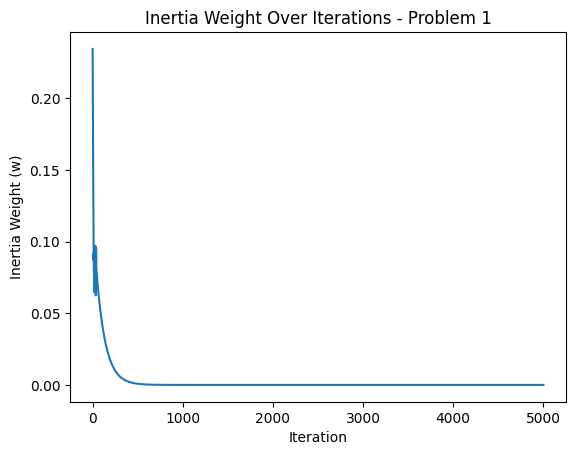

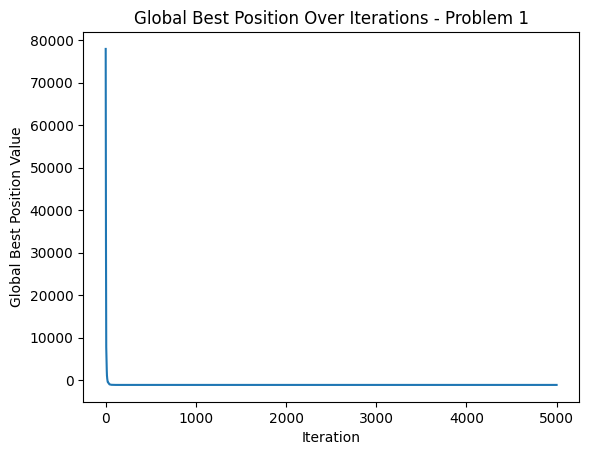




Problem 2 Best Cost: [-701.38124191 -701.40132936 -701.42350165 ... -703.13281462 -703.13281462
 -703.13281462]
Problem 2 Best Position: [-703.13281462]


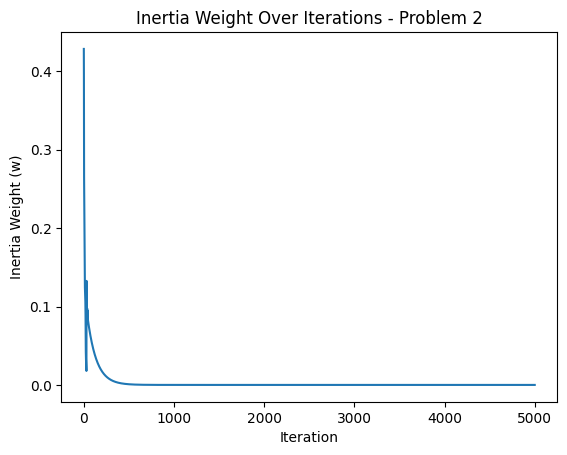

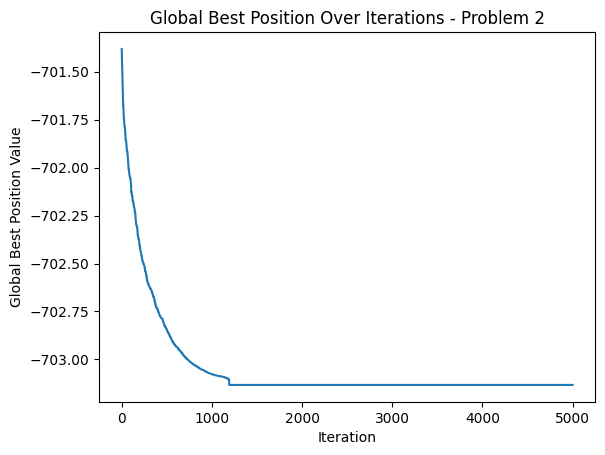




Problem 3 Best Cost: [ 3.62207426e+10  3.23583565e+10  2.33221594e+10 ... -3.57579750e+02
 -3.57579750e+02 -3.57579750e+02]
Problem 3 Best Position: [-357.57974959]


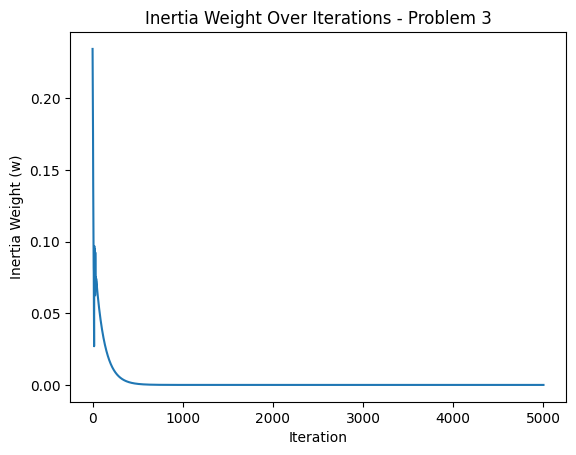

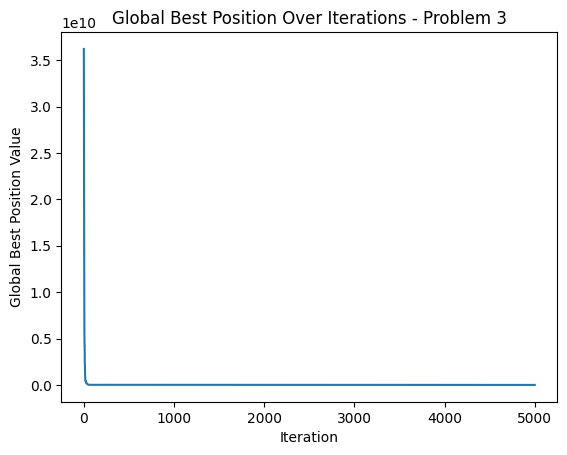




Problem 4 Best Cost: [230569.0894768  200201.28137611 152706.77942216 ...   -382.62052118
   -382.62052118   -382.62052118]
Problem 4 Best Position: [-382.62052118]


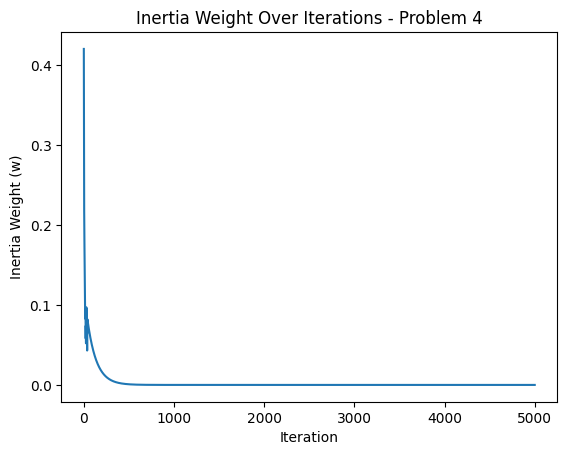

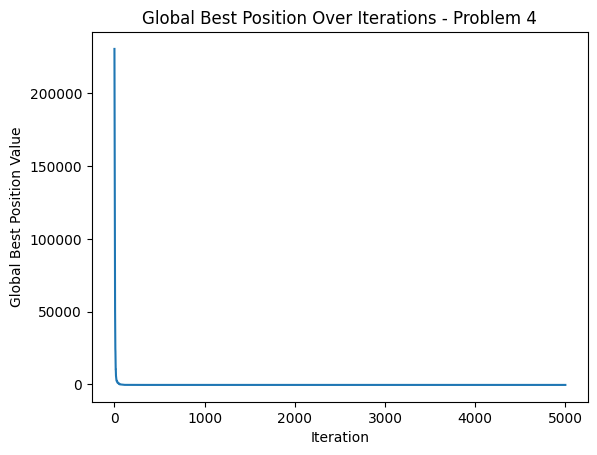




Problem 5 Best Cost: [-334.20178325 -334.22125093 -334.26076145 ... -336.1543883  -336.15438895
 -336.1543893 ]
Problem 5 Best Position: [-336.1543893]


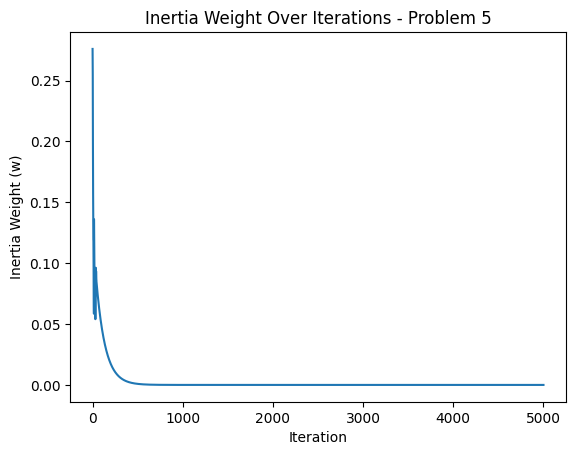

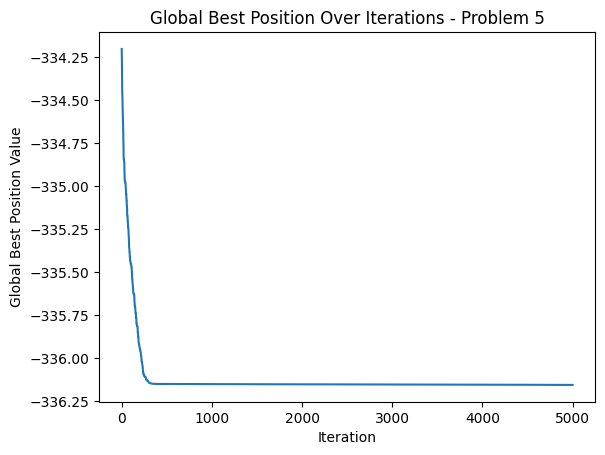




Problem 6 Best Cost: [-183.53106328 -183.59233253 -183.63653926 ... -185.4386681  -185.43866811
 -185.43866812]
Problem 6 Best Position: [-185.43866812]


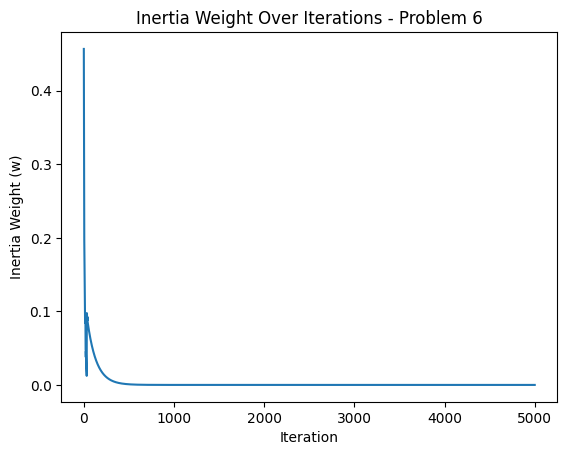

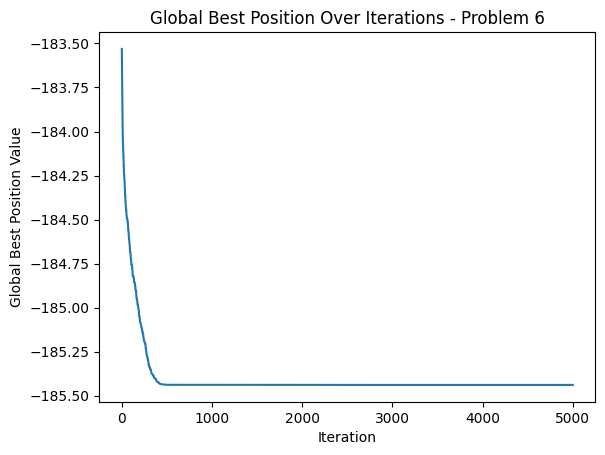




Problem 7 Best Cost: [72398.80358073 43448.92399688 30950.35148088 ...  -912.85734314
  -912.85734314  -912.85734314]
Problem 7 Best Position: [-912.85734314]


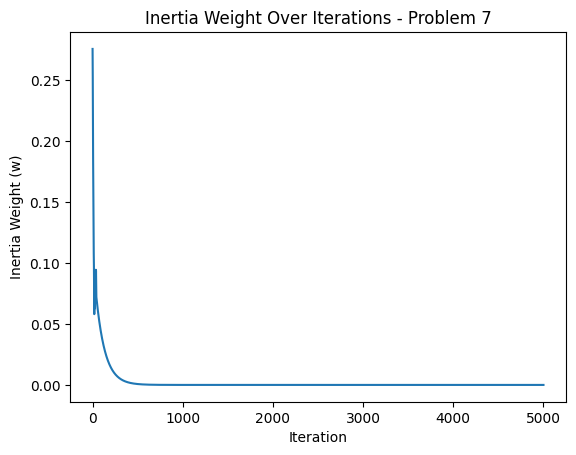

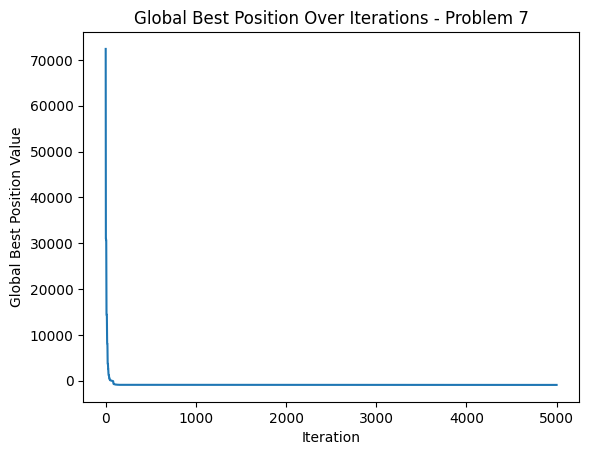




Problem 8 Best Cost: [57963.69120926 36068.38648915 21702.82479128 ...  -656.36705089
  -656.36705089  -656.36705089]
Problem 8 Best Position: [-656.36705089]


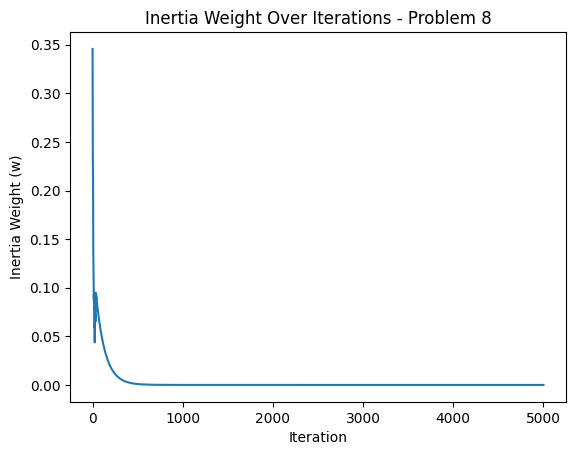

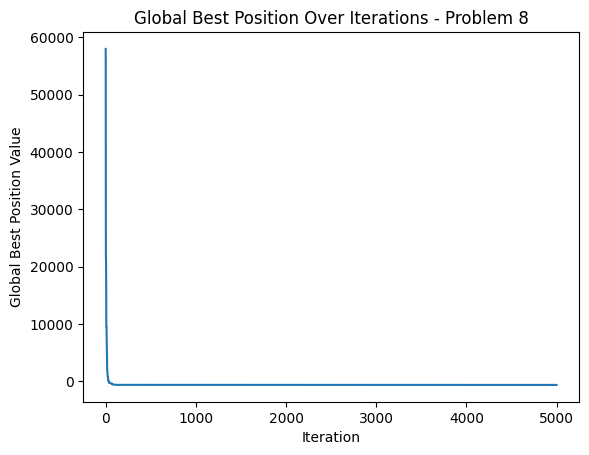




Problem 9 Best Cost: [73064.19011421 73064.19011421 73064.19011421 ...   965.56683639
   965.56683639   965.56683639]
Problem 9 Best Position: [965.56683639]


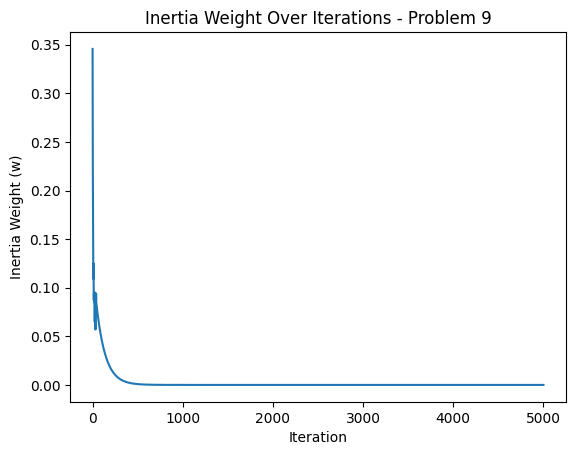

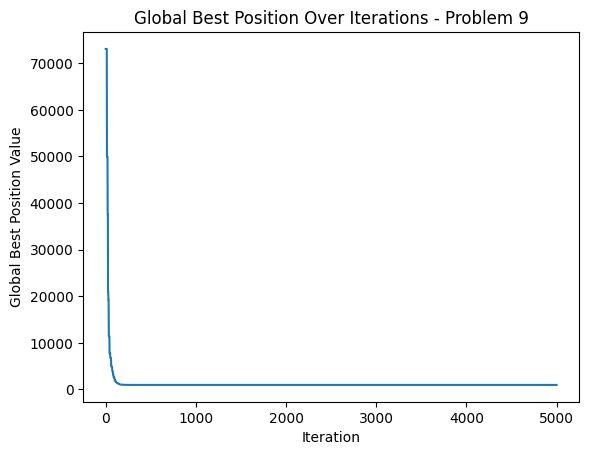




Problem 10 Best Cost: [64631.18643119 47713.69475523 36498.29515824 ...  2282.96697897
  2282.96697897  2282.96697897]
Problem 10 Best Position: [2282.96697897]


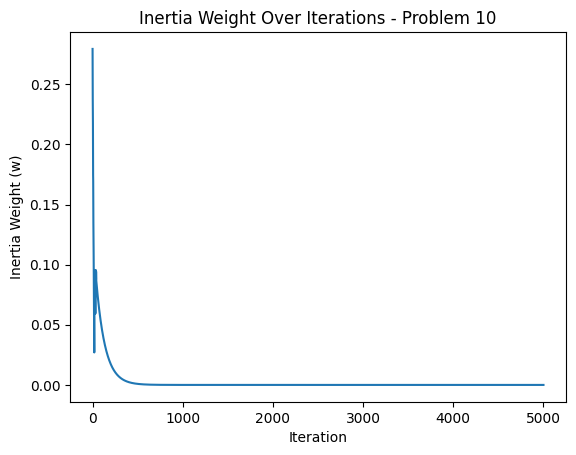

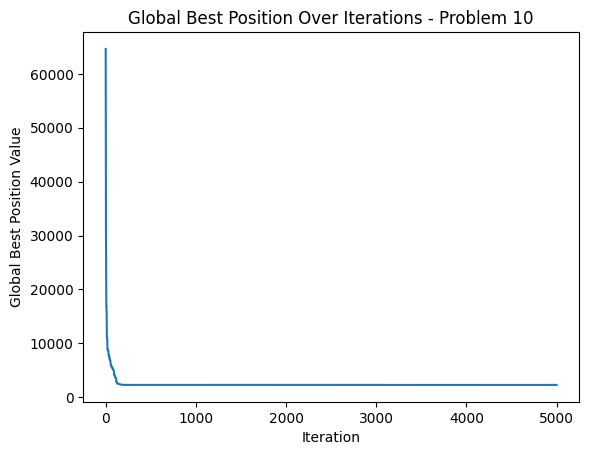




Problem 11 Best Cost: [62388.65437571 46141.12714594 41370.28993371 ...  7224.4564458
  7224.4564458   7224.4564458 ]
Problem 11 Best Position: [7224.4564458]


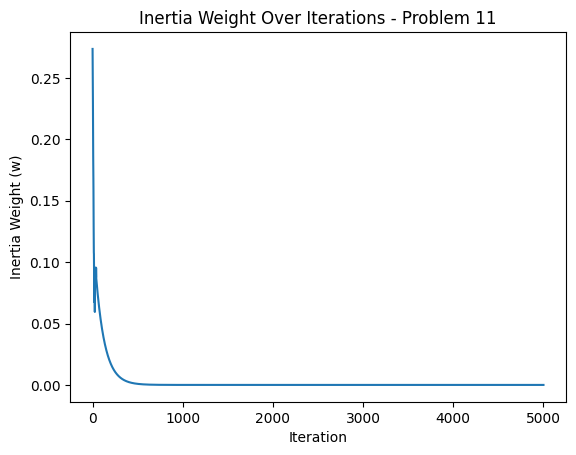

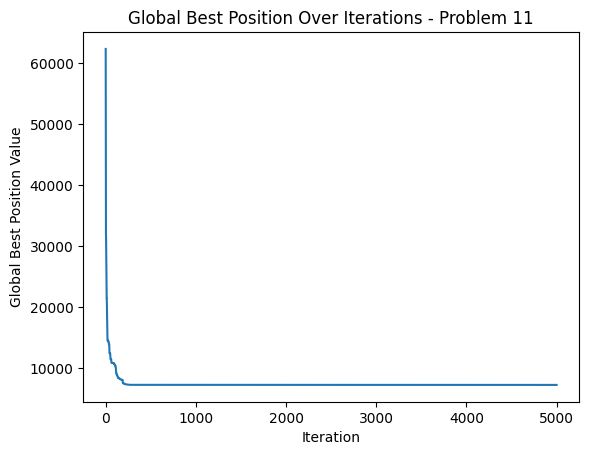




Problem 12 Best Cost: [58897.14040682 46173.67120385 40427.84535585 ...  4416.18417097
  4416.18417097  4416.18417097]
Problem 12 Best Position: [4416.18417097]


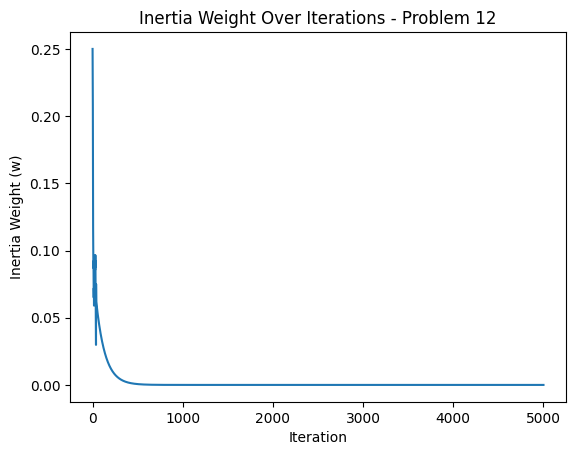

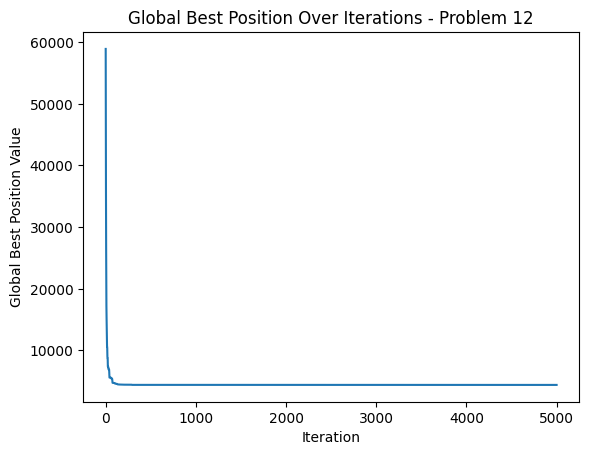




Problem 13 Best Cost: [246637.74170502 188886.91068314 188886.91068314 ...   1039.34875204
   1039.34875204   1039.34875204]
Problem 13 Best Position: [1039.34875204]


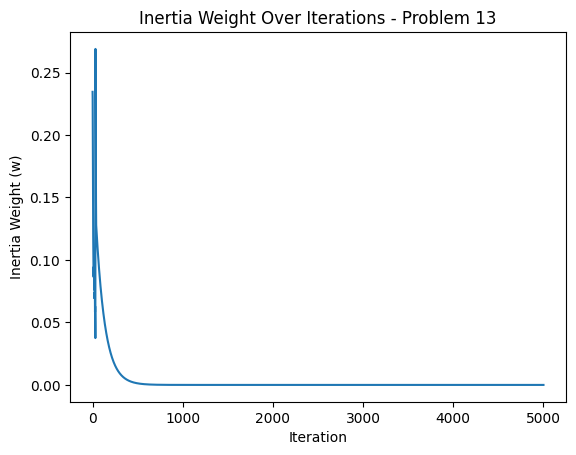

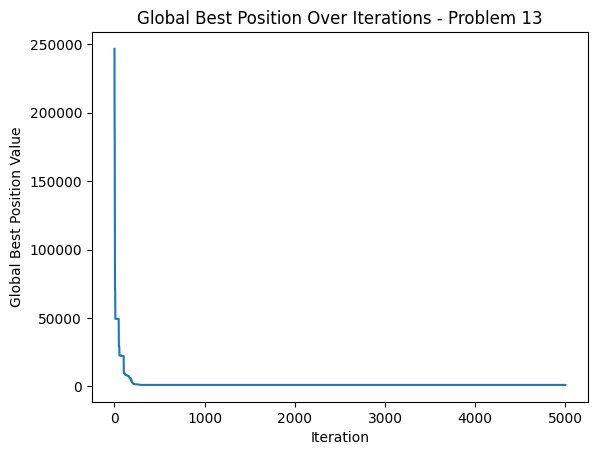




Problem 14 Best Cost: [30577.97610247 28977.80797004 26345.19043161 ... 10620.74645179
 10620.74645177 10620.74645177]
Problem 14 Best Position: [10620.74645177]


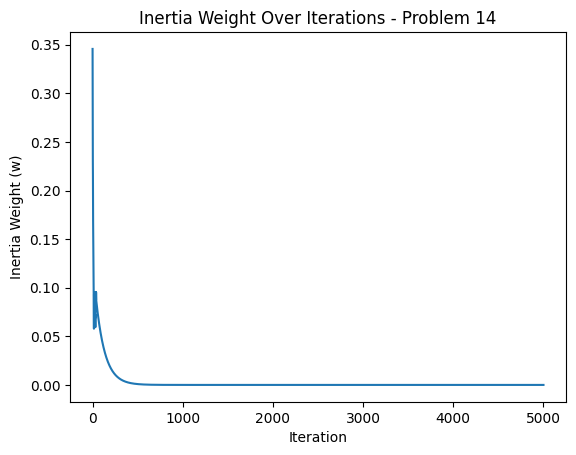

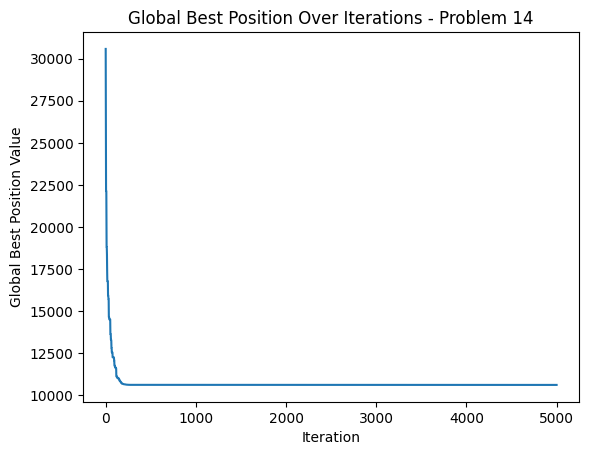




Problem 15 Best Cost: [-224.9237026 -225.4819443 -225.4819443 ... -227.8056011 -227.8056011
 -227.8056011]
Problem 15 Best Position: [-227.8056011]


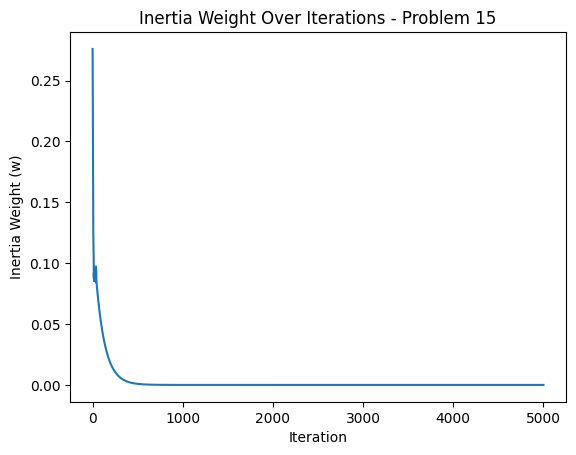

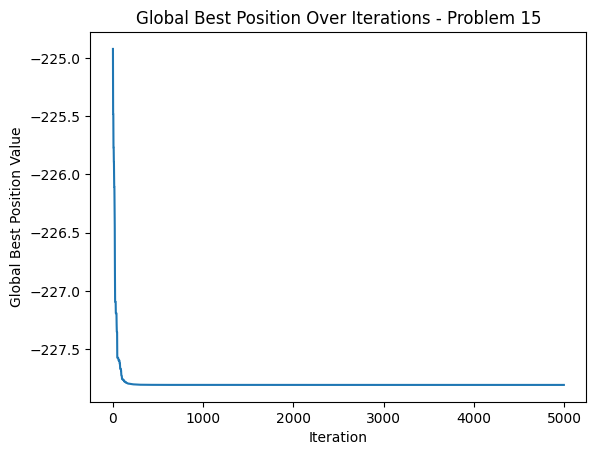




Problem 16 Best Cost: [62630.49360582 56246.34983109 48262.6600812  ... -4317.9
 -4317.9        -4317.9       ]
Problem 16 Best Position: [-4317.9]


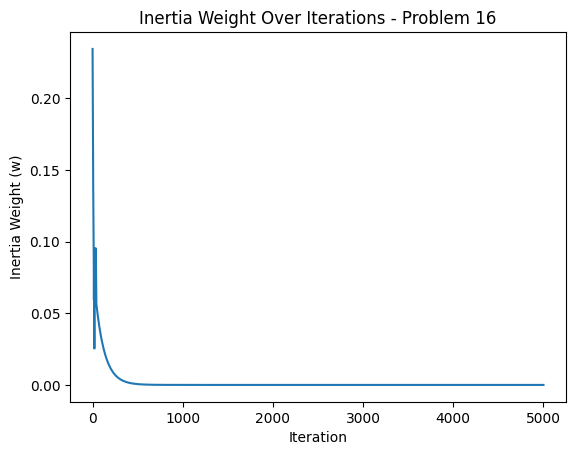

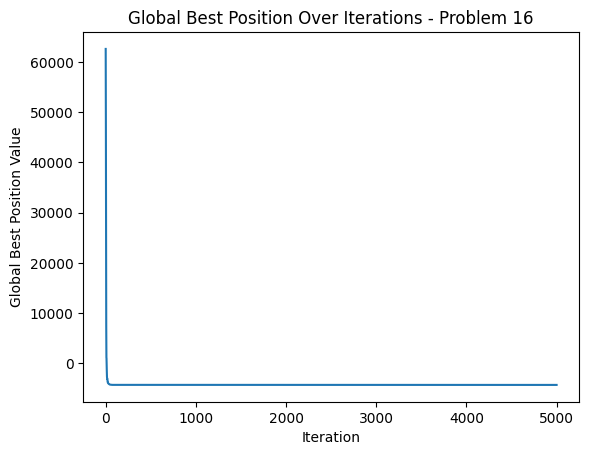




Problem 17 Best Cost: [2303065.92702167 1818404.25091969 1422764.93633026 ...   -5000.
   -5000.           -5000.        ]
Problem 17 Best Position: [-5000.]


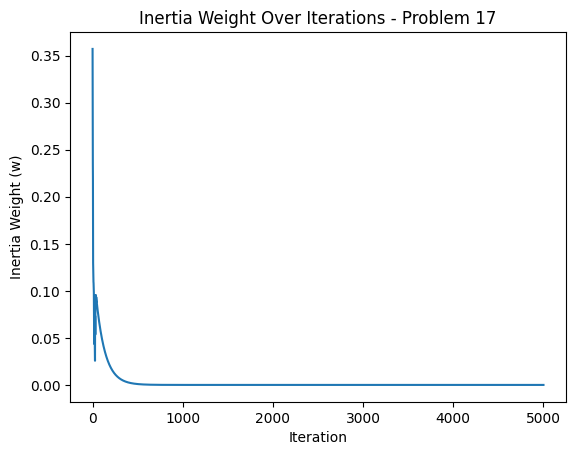

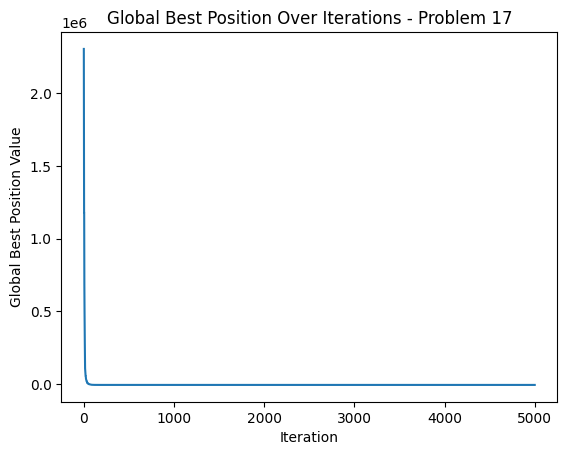




Problem 18 Best Cost: [62168.50373646 40080.39465803 40080.39465803 ...  5621.90774214
  5621.90774214  5621.90774214]
Problem 18 Best Position: [5621.90774214]


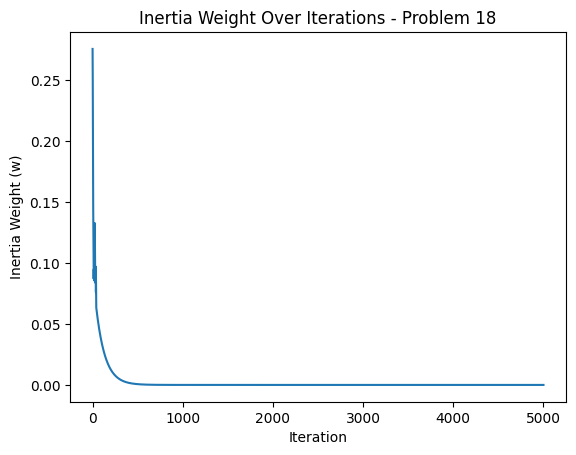

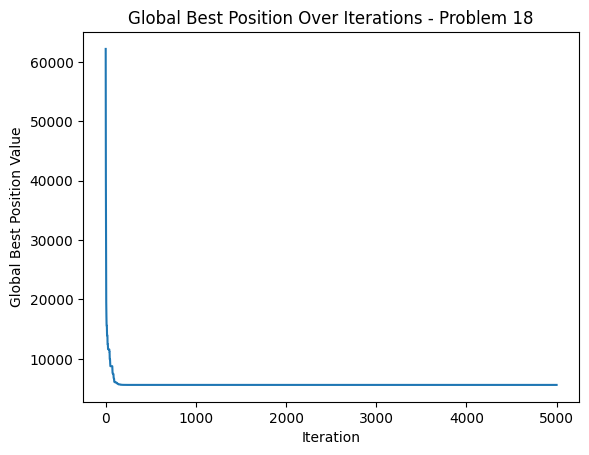




Problem 19 Best Cost: [67515.87465859 56500.89725098 52305.75221229 ...  4582.23091509
  4582.23091509  4582.23091509]
Problem 19 Best Position: [4582.23091509]


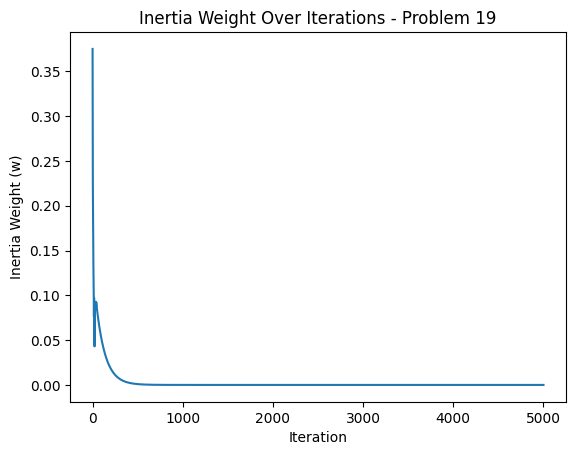

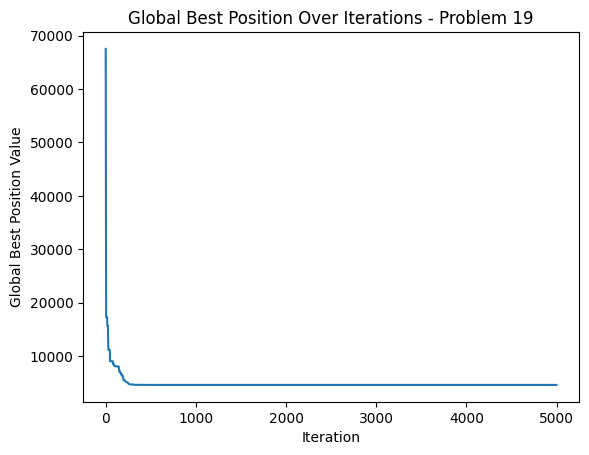




Problem 20 Best Cost: [-83.45827516 -83.45827516 -84.41142372 ... -89.28362939 -89.28362939
 -89.28362939]
Problem 20 Best Position: [-89.28362939]


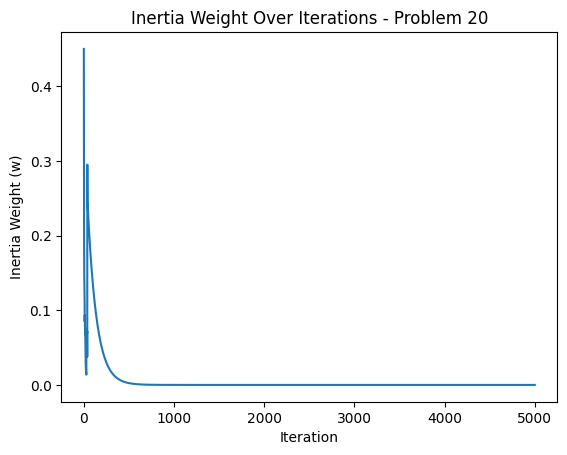

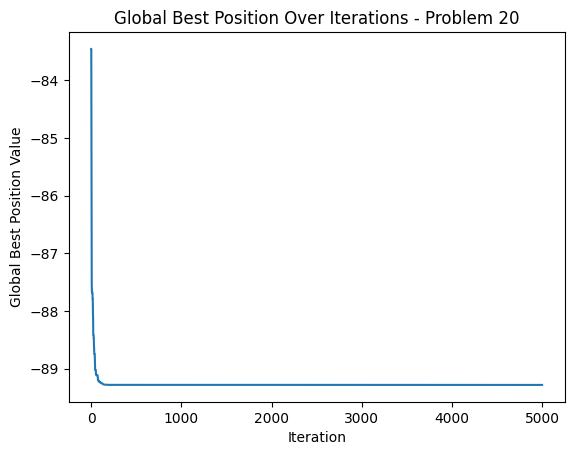




Problem 21 Best Cost: [155.07176824  99.4386298   39.67801672 ... -44.99999987 -44.99999987
 -44.99999987]
Problem 21 Best Position: [-44.99999987]


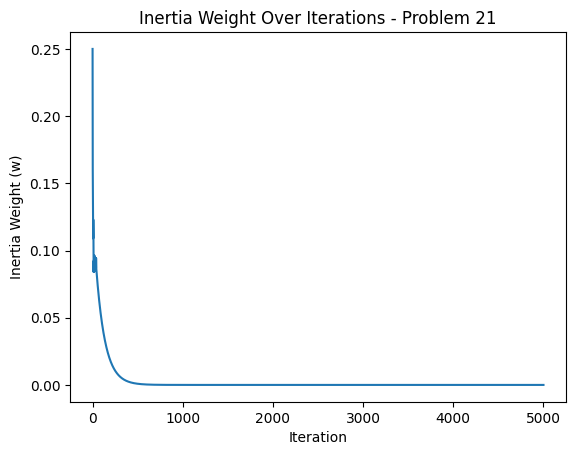

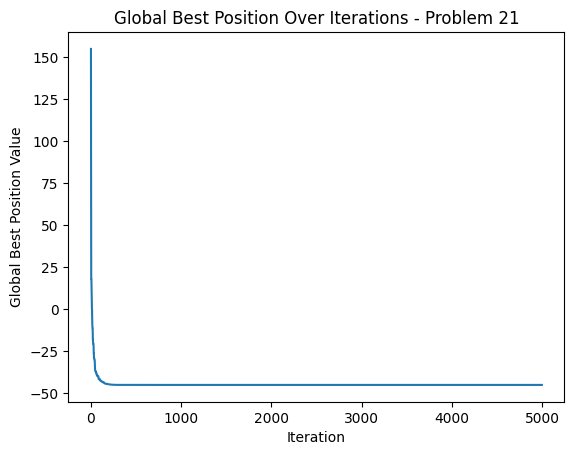




Problem 22 Best Cost: [235069.80546533 206924.18998591 200168.8552102  ...  83509.02533503
  83509.02533503  83509.02533503]
Problem 22 Best Position: [83509.02533503]


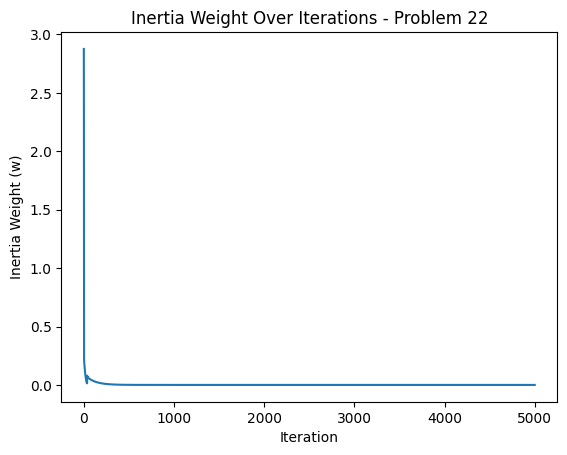

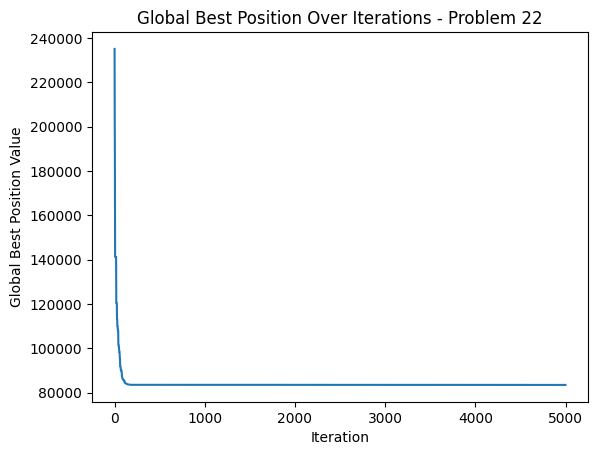




Problem 23 Best Cost: [ -7.79464893 -24.06967104 -24.34454199 ... -66.09274795 -66.09274795
 -66.09274795]
Problem 23 Best Position: [-66.09274795]


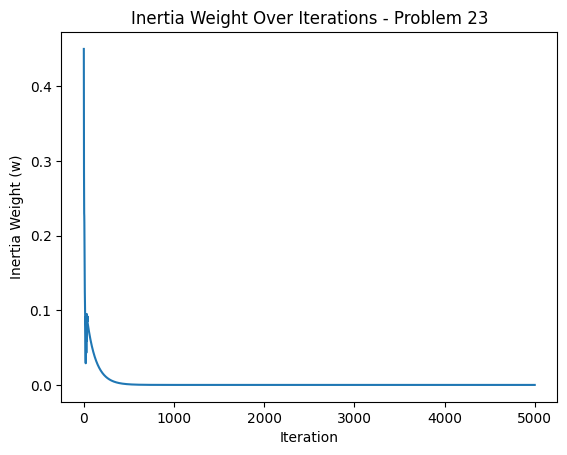

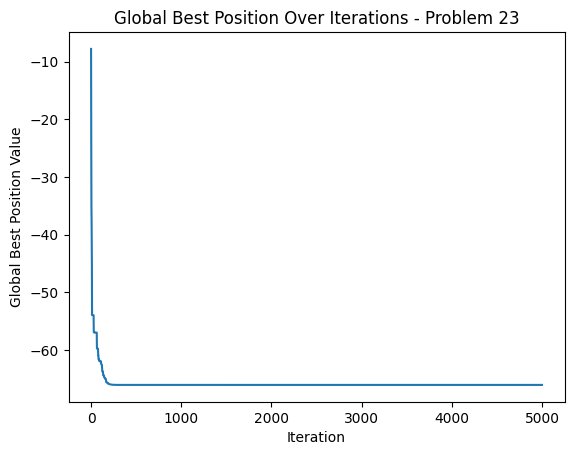




Problem 24 Best Cost: [120.52732957 120.52732957 109.87984714 ... -37.14053793 -37.14053793
 -37.14053793]
Problem 24 Best Position: [-37.14053793]


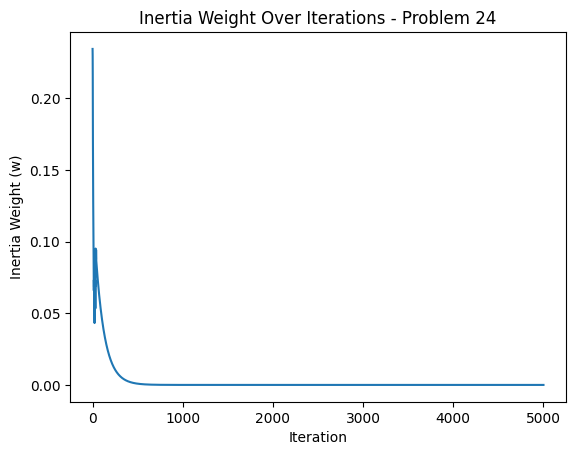

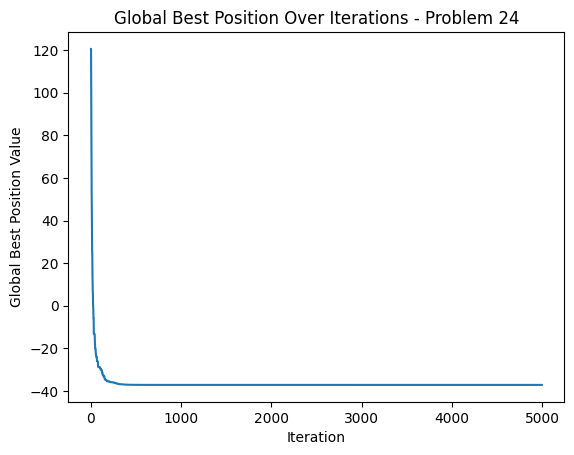

In [24]:
for prob in range(24):
    curr = prob + 1
    problem_results = results[curr]

    print("\n\n\nProblem", curr, "Best Cost:", problem_results['BestCost'])
    print("Problem", curr, "Best Position:", problem_results['BestPosition'])

    # milestone_means = {}
    # milestone_stds = {}

    # for milestone, costs in milestone_results.items():
    #     if costs:  # Check if there are any results for this milestone
    #         mean_cost = np.mean(costs)
    #         std_cost = np.std(costs)
    #         milestone_means[milestone] = mean_cost
    #         milestone_stds[milestone] = std_cost
    #         print(f"At {milestone} function evaluations - Mean Cost: {mean_cost}, Std Dev: {std_cost}")

    # # Plot milestone results: Mean cost with standard deviation error bars
    # milestones_sorted = sorted(milestone_means.keys())
    # means = [milestone_means[m] for m in milestones_sorted]
    # stds = [milestone_stds[m] for m in milestones_sorted]

    # plt.errorbar(milestones_sorted, means, yerr=stds, fmt='o', color='b', capsize=5)
    # plt.xlabel('Function Evaluations')
    # plt.ylabel('Cost')
    # plt.title('Cost vs Function Evaluations with Std Dev')
    # plt.show()

    plt.plot(problem_results['w_values'])
    plt.xlabel('Iteration')
    plt.ylabel('Inertia Weight (w)')
    plt.title(f'Inertia Weight Over Iterations - Problem {curr}')
    plt.show()

    plt.plot(problem_results['g_values'])
    plt.xlabel('Iteration')
    plt.ylabel('Global Best Position Value')
    plt.title(f'Global Best Position Over Iterations - Problem {curr}')
    plt.show()

In [ ]:
print('nice')

In [20]:
print('almost complete')

almost complete


In [21]:
print("Don't disconnect runtime")

Don't disconnect runtime
